# Predicting Project Success for New York City Capital Projects

### Project authors

- [An Hoang](https://github.com/hoangthienan95)
- [Mark McDonald](https://github.com/mcdomx)
- [Mike Sedelmeyer](https://github.com/sedelmeyer)


# Introduction

## i. About this notebook

This notebook contains an exploratory analysis, wherein we attempt different approaches to modelling and feature engineering to predict 3-year outcomes for New York City managed capital projects with budgets greater than \$25 million using an openly avaiable dataset [hosted by NYC Open Data](https://data.cityofnewyork.us/City-Government/Capital-Projects/n7gv-k5yt). Due to the limited scope and amount of data available in this dataset, this project can only be thought of as a proof of concept, which will need to replicated under more stringent standards with a larger set of more robust data.

- **For an overview of the analytical sections of this notebook, please see the [Notebook Contents](#Notebook-contents) index listed below this introduction.**

### i.i. A note about supporting notebooks

The code and results given in this notebook are only a summary of the work completed toward this analysis. Supplemental notebooks containing the complete EDA, data cleansing, feature engineering, and model exploration illustrated in this report can be found in the **`notebooks/`** directory of the **[supporting GitHub project repository](https://github.com/sedelmeyer/nyc-capital-projects)**. The notebooks in that repository are designed to be run in sequential numbered order to reproduce the results shown here. In addition, throughout this report, we will provide links to specific supporting notebooks for further reference.

### i.ii. A note about supporting custom python modules

As you will see in [the imports section](#Import-libraries-and-load-data) of this notebook, there are a number of custom ``caproj`` Python modules used to generate the results shown throughout this notebook. The code for these modules are part of the custom ``caproj`` package and are located in the **`src/`** directory of the **[supporting GitHub repository](https://github.com/sedelmeyer/nyc-capital-projects)**. The purpose of authoring this custom package, rather than include all of the source code in this notebook, is to (1) ensure better source code version control, (2) reproduce output using identical algorithms across multiple notebooks, and (3) keep the length of this report to a manageable length.

For further information, in-depth API documentation for this ``caproj`` package can be found [in the online documentation](https://sedelmeyer.github.io/nyc-capital-projects/modules.html).

## ii. Research Question

After initial exploration and cleansing of the available data, we have focused our efforts on the following research question:

- Given the set of New York City Capital Projects change data, can we create a model that can accurately predict 3-year change in forecasted project budget and 3-year change in forecasted project duration using only the data available at the start of the project as our predictors?

- In other words, using historical project data, can we predict how much the forecasted budget and duration of any given capital project run by the City of New York will deviate from it's original budgeted estimates by the end of year-3 for the project?

The significance of a model that can accurately address this question means, given any new project, project managers and city administrators would have another tool at their disposal for objectively identifying potential budget and schedule risk at the start of a new city-run capital project. Such a tool can help to overcome common planning fallacies and optimism biases to help to mitigate cost and and schedule overruns. 

## iii. Summary of findings

Overall, we found promising results that, given a limited amount of project data, moderately accuract predictions could be made as to the 3-year budget change ratio and schedule change ratio for changes made on NYC capital projects. Ultimately, we explored a number of modelling methods ranging from basic linear regression (as an initial baseline), to smoothing spline generalized additive models (GAMs), to non-parameteric ensemble methods using decision tree regressors and boosting. In addition, using our limited dataset, we sought to extract the greatest amount of predictive information as possible from it by focusing heavily on feature engineering. Methods for feature engineering included competing methods for generating latent "reference class" categories for each project using K-means clustering as well as uniform manifold approximation and projection (UMAP) in combination with the HDBSCAN clustering algorithm, which took into account all categorical and quantitative characteristics of our training project. Additionally, we use bidirectional encoder representations from transformers (BERT) embeddings of the textual information available for each project, and further encoded those embeddings into a smaller, more usable feature-space through competing methods of dimensionality reduction such as principal compenent analysis (PCA), latent space encoding with a dense autoencoder neural network, and UMAP.

Not surprisingly, linear models lacked the expressiveness needed to successfully model our predictions, particularly those for budget ratio change of our test projects. Not only were there drastic differences in the predictive performance of models on both budget change ratio and schedule change ratio as as our primary response variables, but models also needed to be individually parameterized for optimal predictions on each of those two response variables.

In the end, through the use of ensemble decision tree regressors using boosting, we were able to achieve test $R^2$ scores of $0.48$ on our budget change ratio predictions and $0.70$ on our schedule change predictions. While there is still a great deal of additional work we can put towards this problem, we feel that this analysis is a good starting point for more principled exploration.

# Notebook contents

[Introduction](#Introduction)

[Import libraries and load data](#Import-libraries-and-load-data)

**[1. About the data](#1.-About-the-data)**

**[2. Research question](#2.-Research-question)**

**[3. Feature engineering](#3.-Feature-engineering)**

- [3.1. Reference class clustering with K-means and UMAP](#3.1.-Reference-class-clustering-with-K-means-and-UMAP)

- [3.2. Embedding project descriptions text with BERT](#3.2.-Embedding-project-descriptions-text-with-BERT)

- [3.3 Encoding the BERT embedding with PCA, Autoencoders, and UMAP](#3.3-Encoding-the-BERT-embedding-with-PCA,-Autoencoders,-and-UMAP)

**[4. Linear models](#4.-Linear-models)**

- [4.1. Baseline linear regression](#4.1.-Baseline-linear-regression)

- [4.2. Smoothing spline generalized additive models (GAMs)](#4.2.-Smoothing-spline-generalized-additive-models-(GAMs))

**[5. Nonparametric models](#5.-Nonparametric-models)**

- [5.1. Decision tree regressors](#5.1.-Decision-tree-regressors)

- [5.2. Ensemble tree regressors with boosting](#5.2.-Ensemble-tree-regressors-with-boosting)

**[6. Conclusions](#6.-Conclusions)**

**[7. Next steps & future work](#7.-Next-steps-&-future-work)**

# Imported libraries and load data

[Return to top](#Notebook-contents)

In [1]:
from IPython.display import HTML

HTML(
    '''<script> code_show=true; function code_toggle() {
    if (code_show){
    $('div.input').show();
    } else {
    $('div.input').hide();
    }
    code_show = !code_show
    } 
    $( document ).ready(code_toggle);
    </script>
    <form action="javascript:code_toggle()">
    <input type="submit" value="Click here to hide/show the raw code.">
    </form>'''
)

In [2]:
import os
import pickle
import csv
import warnings

from gap_statistic import OptimalK
import graphviz
from keras_bert import extract_embeddings, POOL_NSP, POOL_MAX
from matplotlib.cbook import MatplotlibDeprecationWarning
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pygam import LinearGAM, s, f
import seaborn as sns
import scipy.cluster.hierarchy as hac
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import export_graphviz
import statsmodels.formula.api as sm
from tqdm.notebook import tqdm

import caproj.autoencoder
import caproj.cluster
import caproj.datagen
import caproj.model
import caproj.scale
import caproj.trees
import caproj.visualize

# Avoid scientific notation output in Pandas
# pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.options.display.float_format = '{:,.2f}'.format

# Improve resolution of output graphics
%config InlineBackend.figure_format ='retina'

# silence matplotlib deprecation warnings 
warnings.filterwarnings('ignore', category=MatplotlibDeprecationWarning)

In [3]:
# establish that required file paths and directory paths exist
filepath_train = '../data/processed/NYC_capital_projects_3yr_final_train.csv'
filepath_test = '../data/processed/NYC_capital_projects_3yr_final_test.csv'
filepath_full = '../data/interim/Capital_Projects_clean.csv'
filepath_allyears = '../data/interim/NYC_capital_projects_all.csv'

# filepath_pca_embed = '../models/pca_descr_embed.pickle'
filepath_ae_hist = '../models/ae_descr_embed_history.pickle'
filepath_gam1 = '../models/gam_budget_gridsearch.pickle'
filepath_gam2 = '../models/gam_schedule_gridsearch.pickle'

# clustering pickled objects
filepath_scaler = "../models/UMAP_fitted_robust_scaler.pickle"
filepath_clusterer = "../models/UMAP_fitted_HDBSCAN.pickle"
filepath_final_cols = "../models/UMAP_final_cols.pickle"
filepath_mapper_dict = "../models/UMAP_mapper_dict.pickle"
filepath_clustering_X_full = "../models/clustering_X.pickle"

BERT_BASE_DIR = '../models/pretrained_bert'
filepath_bert = '../data/interim/embeddings_uncased_L-2_H-128_A-2.csv'

# figure root path for saving plots
FIGURE_ROOT = '../docs/_static/figures/'
# set to False to prevent existing image files from being overwritten
save_images = False

# check to ensure target files exist to prevent runtime errors
path_errors = []
for filepath in [
    filepath_train, filepath_test, filepath_full, filepath_allyears,
    filepath_ae_hist, filepath_gam1, filepath_gam2, filepath_scaler,
    filepath_clusterer, filepath_final_cols, filepath_mapper_dict,
    filepath_clustering_X_full, filepath_bert, BERT_BASE_DIR, FIGURE_ROOT
]: 
    if (not os.path.isfile(filepath)) and (not os.path.isdir(filepath)):
        path_errors.append(filepath)
        
if len(path_errors)==0:
    print("OK - all filepaths point to existing files!")

else:
    raise ValueError(
        "The following target paths do not exist...\n\n\t{}\n"\
        "".format(path_errors)
    )


OK - all filepaths point to existing files!


In [4]:
# load dataframes from target files
data_train = pd.read_csv(filepath_train)
data_test = pd.read_csv(filepath_test)
data_full = pd.read_csv(filepath_full)
data_allyears = pd.read_csv(filepath_allyears)

# convert datetime columns to the correct data type
datetime_cols = [
    'Design_Start',
    'Final_Change_Date',
    'Schedule_Start',
    'Schedule_End',
]

for col in datetime_cols:
    data_train[col] = pd.to_datetime(data_train[col])
    data_test[col] = pd.to_datetime(data_test[col])
    data_allyears[col] = pd.to_datetime(data_allyears[col])

In [5]:
# use custom function located in ../src/datagen to summarize
# record counts available in each loaded dataframe
caproj.datagen.print_record_project_count(data_full, 'full')
caproj.datagen.print_record_project_count(data_allyears, 'all')
caproj.datagen.print_record_project_count(data_train, 'training')
caproj.datagen.print_record_project_count(data_test, 'test')


For the ORIGINAL cleansed data, containing all available NYC capital projects change records:

	Number of dataset records: 2095
	Number of unique projects in dataset: 355

For the data containing start and end data for all available NYC capital projects for the ENTIRE INTERVAL of changes covered in the ORIGINAL data:

	Number of dataset records: 355
	Number of unique projects in dataset: 355

For the final TRAINING data, containing the training split of 3-year project data used in this analysis:

	Number of dataset records: 134
	Number of unique projects in dataset: 134

For the final TEST data, containing the test split of 3-year project data used in this analysis:

	Number of dataset records: 15
	Number of unique projects in dataset: 15



In [6]:
# check shape of availale train test split used in this analysis
print(
    'The shapes of our loaded train-test splits are:\n\n'\
    '\tTrain\t{}\n\tTest\t{}\n'.format(
        data_train.shape, data_test.shape
    )
)

The shapes of our loaded train-test splits are:

	Train	(134, 54)
	Test	(15, 54)



In [7]:
print(
    'For future reference, here is an overview of the features '\
    'contained in our final TRAINING dataset:\n'
)

data_train.info()

print('\n\n...and, here are the first 3 rows of our TRAINING data:')
data_train.head(3)

For future reference, here is an overview of the features contained in our final TRAINING dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Unnamed: 0                  134 non-null    int64         
 1   PID                         134 non-null    int64         
 2   Project_Name                134 non-null    object        
 3   Description                 134 non-null    object        
 4   Category                    134 non-null    object        
 5   Borough                     134 non-null    object        
 6   Managing_Agency             134 non-null    object        
 7   Client_Agency               134 non-null    object        
 8   Phase_Start                 134 non-null    object        
 9   Current_Project_Years       134 non-null    float64       
 10  Current_Project_Year  

,Unnamed: 0,PID,Project_Name,Description,Category,Borough,Managing_Agency,Client_Agency,Phase_Start,Current_Project_Years,...,umap_descr_2D_embed_1,umap_descr_2D_embed_2,umap_attributes_2D_embed_1,umap_attributes_2D_embed_2,attribute_clustering_label,ae_descr_embed_1,ae_descr_embed_2,pca_descr_embed_1,pca_descr_embed_2,attribute_km3_label
0,0,204,Edgewood Triangle Roadway Reconstruction,Reconstruct roadway and extend storm and sanit...,Streets and Roadways,Queens,DDC,DOT,2-Design,6.55,...,0.46,-0.41,12.32,10.59,4,6.10,4.54,6.02,3.01,0
1,1,577,Bronx Public School 19 Addition,Design and construction of a new school,Schools,Bronx,SCA,DOE,2-Design,2.94,...,-12.40,-3.70,8.39,-1.15,0,0.00,-0.01,-11.32,-2.94,1
2,2,664,"NEW STRM SWR & WM REPLACEMENT IN ACACIA AVE, ETC.",New Strom Sewer extension & Water Main replace...,Sewers,Staten Island,DDC,DEP,3-Construction Procurement,4.75,...,-0.47,-0.43,16.50,11.85,5,5.16,3.84,4.00,0.82,0


# 1. About the data

[Return to top](#Notebook-contents)

**The unabridged notebooks used to generate the findings in this section can be [found here on GitHub](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/00_eda_and_clean_data.ipynb) and [here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/01_generate_data_splits.ipynb)**

## Data Source

The focus of this analysis is to determine what methods might be available for predicting project success on large capital projects.

To investigate this question, we perform an in depth analysis and modelling exercise using a dataset containing project-change records for currently active City of New York (NYC) capital projects. The dataset describes all major infrastructure and information technology projects with a budget of $25 million or more that were currently active (in the design, procurement, or construction phase). The version of that dataset used throughout this report contained project data that was reported as of September 1st, 2019.

If you wish to access the latest version of the data available from the NYC website, or care to read more about the collection and availability of the data, it can be [accessed online here](https://data.cityofnewyork.us/City-Government/Capital-Projects/n7gv-k5yt).

**Level of observation**

The raw data provided by the NYC website contained 2,259 records, each of which represent one change (either budgetary or scheduling) issued to an active NYC capital project. Therefore, the original raw data contained 2,259 project change records inclusive of 378 unique activate projects.

**Data cleansing**

We encountered a high degree of missingness in this original raw data, and after the process of cleansing the data, populating project information and change information in instances where it could be identified through other project change records, we ultimately ended up with a set of 2,095 valid change records comprising 355 unique projects.

**Subsetting for a valid prediction time-interval**

Furthermore, because all projects in this dataset are currently, and if our objective is to make project-outcome predictions of some sort, we ultimately decided to limit our prediction interval to changes that occur during the first 3 years of a project. Therefore, it we are thinking of this problem in terms of outcomes, we would predict the outcome of a project after 3 years given it's initial characteristics at project start time. This 3-year interval was determined by empirical exploration of the data, and the limiting factor that an interval any longer than 3 years would not provide a large enough subset of available projects and any interval shorter than that would likely be of minimal usefulness given the scope and long-term duration of these \$25+ million capital projects.

Therefore, after we further subsetted our dataset to account for projects that could statisfy this 3-year interval requirement, we were left with only 149 unique projects.

To give a better sense of the nature of the data contained in this dataset, it is likely useful to provide some visual representations of the types of projects available. For a more indepth review of the EDA conducted on this dataset, please refer to [the accompanying EDA and data cleansing notebook on GitHub](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/00_eda_and_clean_data.ipynb).

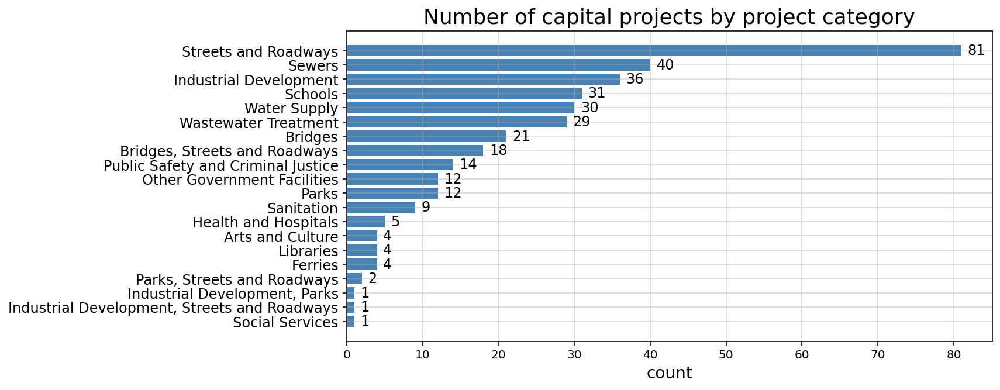

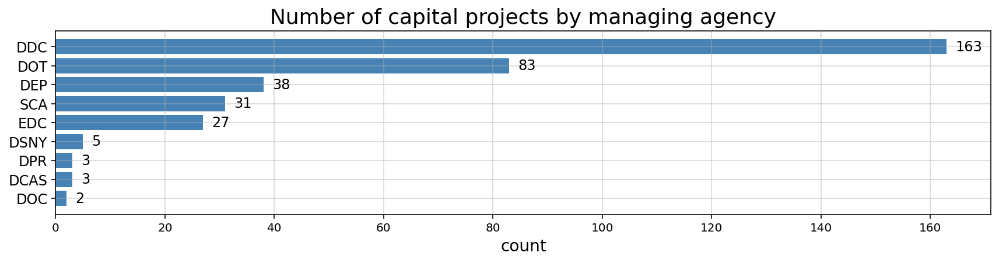

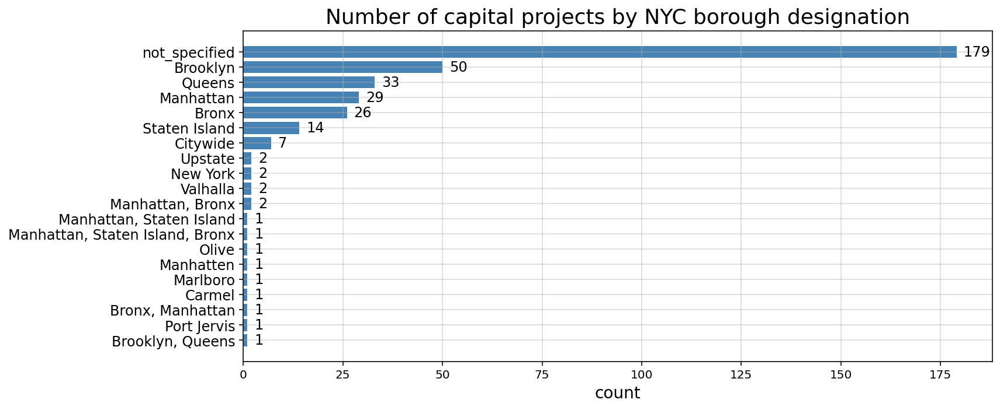

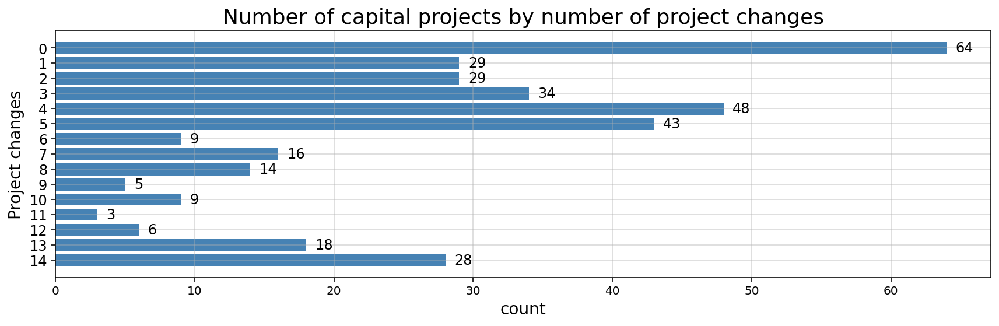

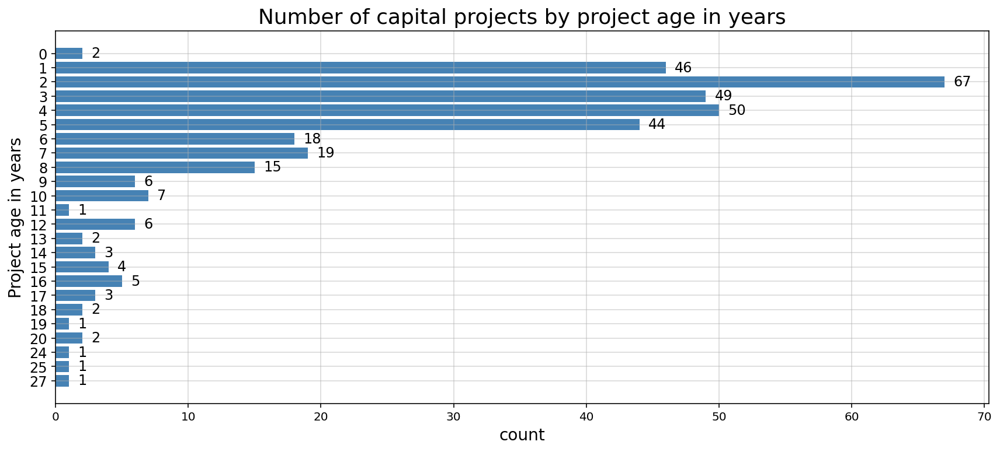

In [8]:
color = 'steelblue'

cat_values = data_allyears['Category'].value_counts().sort_values(ascending=True)

title = 'Number of capital projects by project category'
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '01-projects-by-cat-barplot.jpg', save_images
)
caproj.visualize.plot_barplot(
    cat_values, title, height=4.75, color=color, savepath=savepath
)

cat_values = data_allyears['Managing_Agency'].value_counts().sort_values(ascending=True)

title = 'Number of capital projects by managing agency'
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '02-projects-by-agency-barplot.jpg', save_images
)
caproj.visualize.plot_barplot(
    cat_values, title, height=3.25, color=color, savepath=savepath
)

cat_values = data_allyears['Borough'].value_counts().sort_values(ascending=True)

title = 'Number of capital projects by NYC borough designation'
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '03-projects-by-borough-barplot.jpg', save_images
)
caproj.visualize.plot_barplot(
    cat_values, title, height=5, color=color, savepath=savepath
)

cat_values = data_allyears['Number_Changes'].value_counts().sort_index(ascending=False)

title = 'Number of capital projects by number of project changes'
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '04-projects-by-changes-barplot.jpg', save_images
)
caproj.visualize.plot_barplot(
    cat_values, title, height=4, color=color,
    varname='Project changes',
    savepath=savepath,
)

cat_values = data_allyears['Current_Project_Year'].value_counts().sort_index(ascending=False)

title = 'Number of capital projects by project age in years'
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '05-projects-by-age-barplot.jpg', save_images
)
caproj.visualize.plot_barplot(
    cat_values, title, height=5.5, color=color, 
    varname='Project age in years',
    savepath=savepath,
)

**FINDINGS:**

As can be seen in the horizontal barplots above, there were several categorical features available for each project. However, the categories provided were highly imbalanced, and as was the case with NYC borough designations for projects, not all categories were exclusive. Some categories overlapped and there were in some instances duplicative categories based on different naming conventions.

Additionally, in the final plot above, we can easily see illustrated supporting evidence for why 3 years was an ideal interval to select for our predictive analysis.

Now for a scatter matrix illustrating the correlative relationships of all quantitative variables in our dataset.

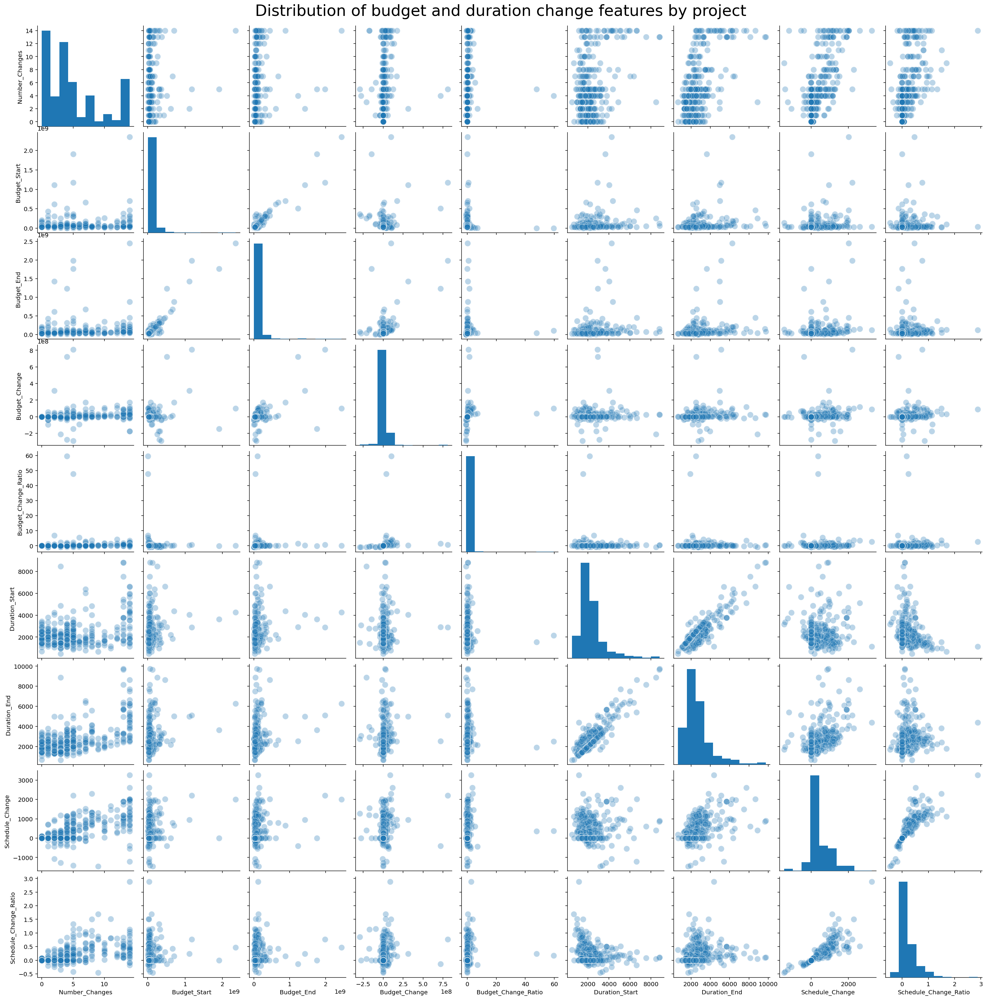

CPU times: user 13 s, sys: 228 ms, total: 13.2 s
Wall time: 13 s


In [9]:
%%time

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '06-features-scatter-matrix.jpg', save_images
)

scatter_cols = [
    'Number_Changes',
    'Budget_Start',
    'Budget_End',
    'Budget_Change',
    'Budget_Change_Ratio',
    'Duration_Start',
    'Duration_End',
    'Schedule_Change',
    'Schedule_Change_Ratio'
]

g = sns.pairplot(
    data_allyears[scatter_cols],
    plot_kws={'alpha': 0.3, 's': 100}
)
g.fig.suptitle(
    'Distribution of budget and duration change features by project',
    fontsize=26,
    y=1.02
)
caproj.visualize.save_plot(plt, savepath=savepath)
plt.show();

**FINDINGS:**

As can be seen scatterplots above, many of the quantitative variables are heavily skewed with extreme outliers, particularly for budget-related metrics. There are also a number of variables with week correlation including relationships between starting budgets and schedules, as well as ending budgets and schedules. The variables exhibiting the greatest levels of correlation various change metrics that we created during our initial investigation of how to measure project change over our 3-year interval. Therefore, it would be expected that those features would ehibit high levels of correlation, and not particularly troubling, because those competing metrics will not likely coexist in any model that we build. 

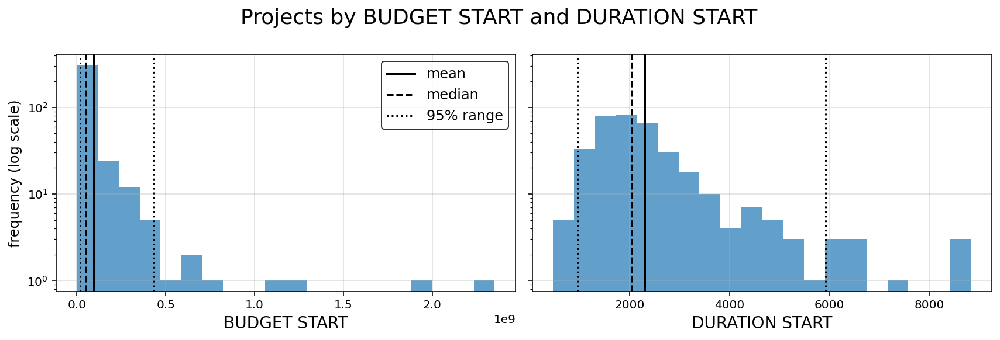

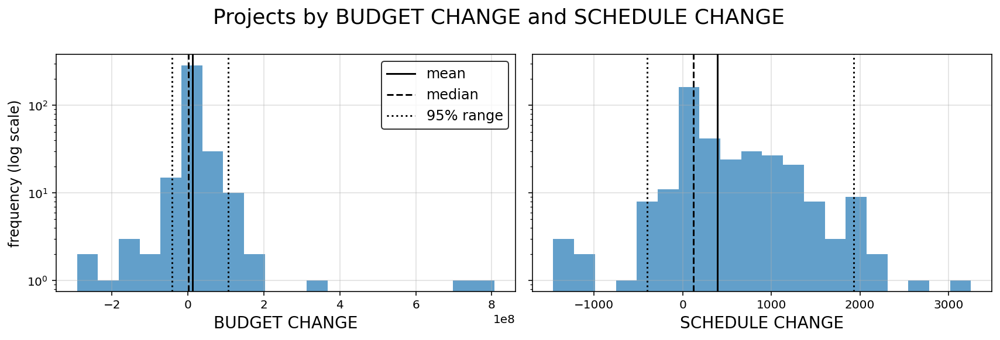

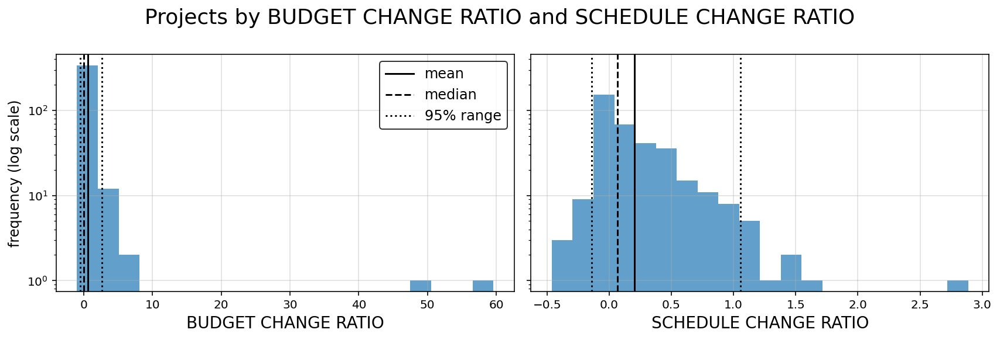

In [10]:
caproj.visualize.plot_hist_comps(
    data_allyears,
    'Budget_Start',
    'Duration_Start',
    y_log=True,
    savepath=caproj.visualize.set_savepath(
        FIGURE_ROOT, '07-project-start-hist.jpg', save_images
    ),
)
caproj.visualize.plot_hist_comps(
    data_allyears,
    'Budget_Change',
    'Schedule_Change',
    y_log=True,
    savepath=caproj.visualize.set_savepath(
        FIGURE_ROOT, '08-project-change-hist.jpg', save_images
    ),
)
caproj.visualize.plot_hist_comps(
    data_allyears,
    'Budget_Change_Ratio',
    'Schedule_Change_Ratio',
    y_log=True,
    savepath=caproj.visualize.set_savepath(
        FIGURE_ROOT, '09-project-change-ratio-hist.jpg', save_images
    ),
)

**FINDINGS:**

As was highlighted in our analysis of the scatter matrix above, our core quantitative features related to budget and schedule are heavily shewed with extreme outliers. In addition, there are extreme difference in the scale of the values measured by each metric (i.e. budget is measured in hundreds of millions of dollars, while schedule is measured in thousands of days). These side-by-side histograms illustrate the severity of this problem.

These findings tell us that we will need to take great care in both scaling as well as transforming our quantitative predictors to mitigate these issues, particularly for classes of models where this will pose a major issue. 

Now let's looks at the change trends for some specific projects in our dataset.

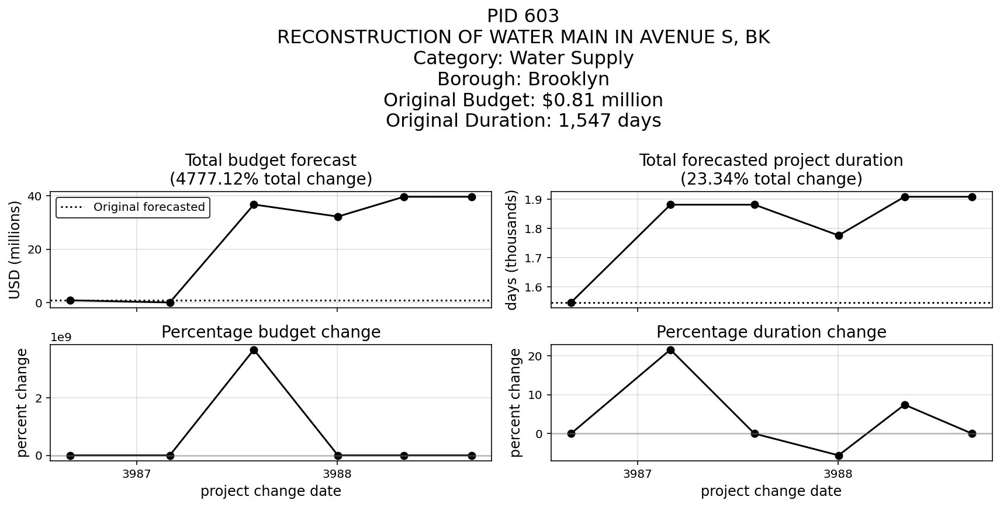

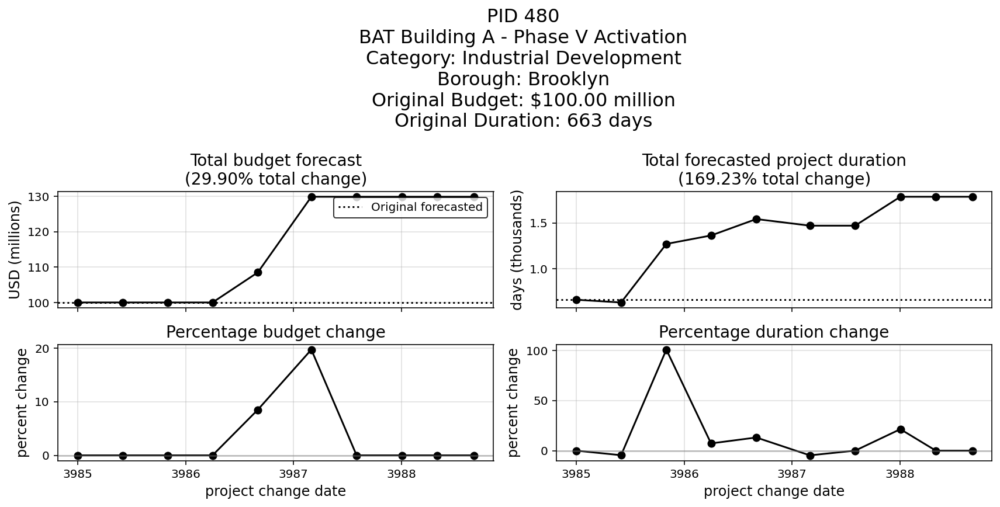

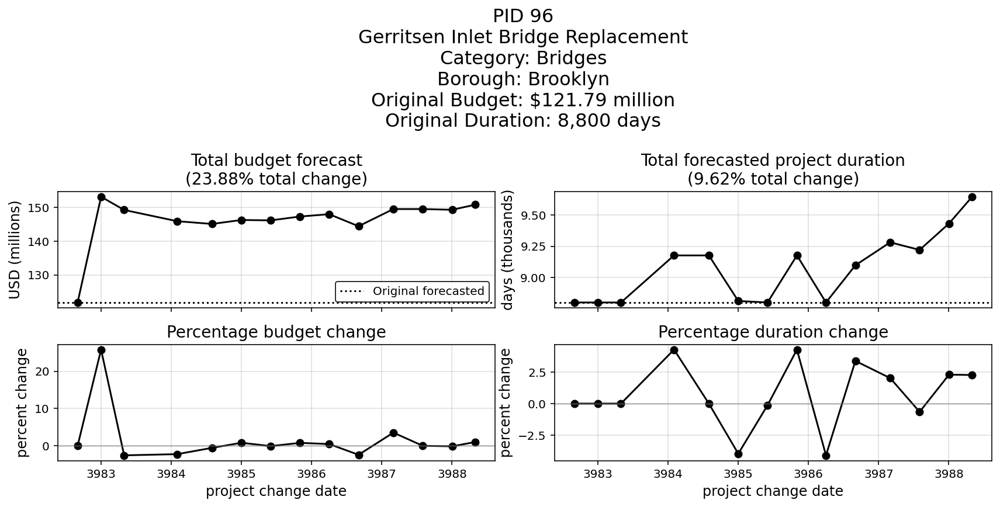

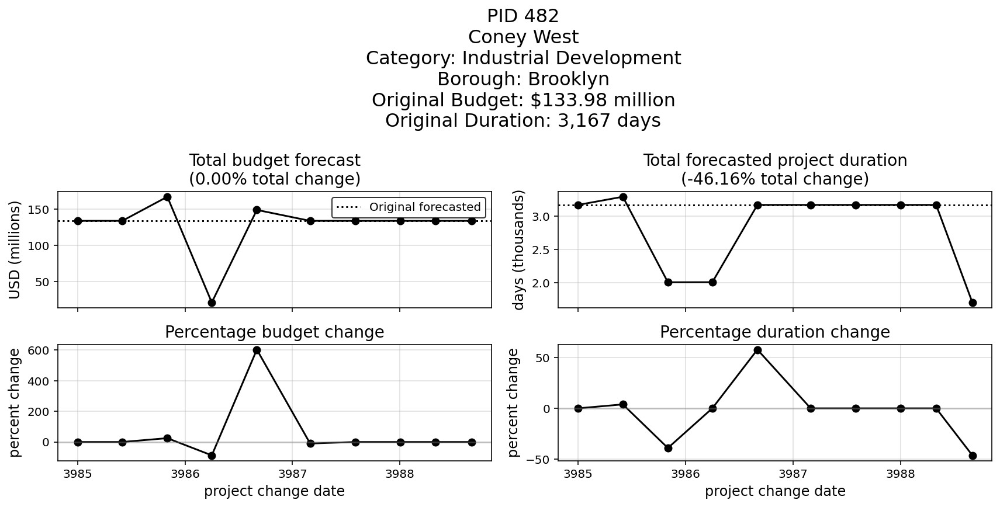

In [11]:
pid_list = [603, 480, 96, 482]

for i, pid in enumerate(pid_list):
    savepath = caproj.visualize.set_savepath(
        FIGURE_ROOT, '{}-project-{}-trend.jpg'.format(10+i, pid), save_images
    )
    caproj.visualize.plot_change_trend(
        data_full, data_allyears, pid, savepath=savepath
    )

**Findings:**

As is illustrated by these time series of individual project changes above, we can see the varying degrees to which project budgets and durations change relative to one another within any singular project.

While the form of the data we will be using will represent a starting snapshot of each project as well as a 3-year snapshot of each project at the end of the prediction interval (effectively removing change-to-change variability over that period), these time trends tell us that budget changes and schedule changes, as they occur over time, appear to exhibit very little correlation to one another. Often times, counterintuitive and opposite changes in schedule duration appear to accompany comparable changes in budget.

It is definitely interesting to see how this seemingly independent behavior between budget changes and schedule changes manifests itself as we continue this analysis and begin fitting models to our data.

Now, armed with the basic underpinnings we have identified during our initial EDA and data cleansing activies, we are ready to define our research question and begin our model engineering process.

# 2. Research question

[Return to top](#Notebook-contents)

After initial exploration and cleansing of the available data, we now focus our efforts on the following research question:

- Given the set of New York City Capital Projects change data, can we create a model that can accurately predict 3-year change in forecasted project budget and 3-year change in forecasted project duration using only the data available at the start of the project as our predictors?

- In other words, using historical project data, can we predict how much the forecasted budget and duration of any given capital project run by the City of New York will deviate from it's original budgeted estimates by the end of year-3 for the project?

The significance of a model that can accurately address this question means, given any new project, project managers and city administrators would have another tool at their disposal for objectively identifying potential budget and schedule risk at the start of a new city-run capital project. Such a tool can help to overcome common planning fallacies and optimism biases to help to mitigate cost and and schedule overruns.

**Response variables**

Throughout the remainder of this analysis, the specific response variables we will be seeking to predict are:

1. `Budget_Change_Ratio` as defined by the total forecasted budget change (in dollars) for a project experienced during the 3-year interval divided by the initial starting budget of the project (i.e. `Budget_Start`) 

2. `Schedule_Change_Ratio` as defined by the total scheduled duration change (in days) for a project experienced during the 3-year interval divided by the initial start scheduled duration of the project (i.e. `Duration_Start`) 

Therefore, we are seeking to predict 2 response variables with all of the modelling methods investigated herein.

# 3. Feature engineering

[Return to top](#Notebook-contents)

**IN THIS SECTION:**

**[3.1. Reference class clustering with K-means and UMAP](#3.1.-Reference-class-clustering-with-K-means-and-UMAP)**

**[3.2. Embedding project descriptions text with BERT](#3.2.-Embedding-project-descriptions-text-with-BERT)**

**[3.3 Encoding the BERT embedding with PCA, Autoencoders, and UMAP](#3.3-Encoding-the-BERT-embedding-with-PCA,-Autoencoders,-and-UMAP)**


As mentioned in the introduction to this analysis, the amount of features availble at the start of each project is sparse and in it's current many of the individual features taken by themselves are either problematic or not that useful. Therefore, in order make the most of the limited data available to us, we realized very quickly that creative feature engineering would need to be an important part of any effective predictive model using this data.  

Approaches to feature engineering covered in this section include (1) competing methods for generating latent "reference class" categories for each project using K-means clustering as well as uniform manifold approximation and projection (UMAP) in combination with the HDBSCAN clustering algorithm, which took into account all categorical and quantitative characteristics of our training projects. Additionally, (2) we use bidirectional encoder representations from transformers (BERT) embeddings of the textual information available for each project, and further encoded those embeddings into a smaller, more usable feature-space through competing methods of dimensionality reduction such as principal compenent analysis (PCA), latent space encoding with a dense autoencoder neural network, and UMAP.

## 3.1. Reference class clustering with K-means and UMAP

[Return to section index](#3.-Feature-engineering)

**IN THIS SECTION:**

**[3.1.1. K-means clustering for reference class labels](#3.1.1.-K-means-clustering-for-reference-class-labels)**

**[3.1.2. UMAP clustering for reference class labels](#3.1.2.-UMAP-clustering-for-reference-class-labels)**


In the project management literature, particularly for academic research concerned with predicting project outcomes related to cost and duration overages, the concept of a project "reference class" is important to grouping like projects for the purpose of improved predictive accuracy. Due to the limitations of the categorical variables present in our current dataset, we have determined that, instead of using intuition or some predefined categorization of projects by type, we'd instead seek to algorithmically classify our projects. The objective we are seeking to accomplish, is to use all available types of quantitative and categorical data at the start of the project to identify some sort of "latent" reference class clusters derived from the totality of those features.

To accomplish this, we perform two competing approaches to clustering on our original feature data (being careful to use only features we would have access to when given a new project to predict). First we use a set of baseline clustering algorithms (K-means, DBSCAN, and Agglomerative Cluster with Wards Method) to generate an initial reference class feature for our training set.

Next, we seek to overcome some of the shortcomings of these methods by using Uniform Manifold Approximation and Projection (UMAP), combined with HDBSCAN, to generate a second competing set of reference classes. Ultimately, we will determine which, if either, of these engineered features improve the predictive accuracy of our regression models.

Now, let's get started prepping our data for use with K-means...

### 3.1.1. K-means clustering for reference class labels

[Return to section index](#3.1.-Reference-class-clustering-with-K-means-and-UMAP)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/03_kmeans_attribute_features.ipynb)**

Once we take care of the first steps of subsetting our data features to include only the predictive features we'd have available when encountering a new project, we need to one-hot-encode our categorical features `Category`, `Borough`, `Managing_Agenct`, `Client_Agency`, `Phase_Start`, `Budget_Start`, and `Duration_Start`.

In [12]:
# subset only the X variables we would know at the start
# of a project
X_cols = [
    'PID',
    'Category_Old',
    'Borough',
    'Managing_Agency',
    'Client_Agency',
    'Phase_Start',
    'Budget_Start',
    'Duration_Start'
]

# use those cols to set the training set for our clustering
# algorithms
X = data_train.copy()[X_cols].set_index('PID')

# One hot encode all of the categorical variables in this
# training set
# One hot encode categorical variables
drop_cat = 'Other Government Facilities'
one_hot = True

X = caproj.scale.encode_categories(
    X, colname='Category_Old',
    one_hot=one_hot,
    drop_cat=drop_cat,
    drop_original_col=True,
    append_colname='cat'
)

drop_cat = 'DSNY'
one_hot = True

X = caproj.scale.encode_categories(
    X, colname='Managing_Agency',
    one_hot=one_hot,
    drop_cat=drop_cat,
    drop_original_col=True,
    append_colname='manag'
)

drop_cat = 'not_specified'
one_hot = True

X = caproj.scale.encode_categories(
    X, colname='Client_Agency',
    one_hot=one_hot,
    drop_cat=drop_cat,
    drop_original_col=True,
    append_colname='cliag'
)

drop_cat = 'not_specified'
one_hot = True

X = caproj.scale.encode_categories(
    X, colname='Borough',
    one_hot=one_hot,
    drop_cat=drop_cat,
    drop_original_col=True,
    append_colname='bor'
)

drop_cat = '4-Construction'
one_hot = True

X = caproj.scale.encode_categories(
    X, colname='Phase_Start',
    one_hot=one_hot,
    drop_cat=drop_cat,
    drop_original_col=True
)

Now, with our categorical variable one-hot-encoded, we can take the next step of scaling our quantitative variables `Budget_Start` and `Duration_Start`.

Due to the heavily skewed nature of these features, their extremely different numerical scales, and the existence of exteme outliers, we will scale the data accordingly. To accomplish this, we first (1) standardize the data, we then (2) apply a sigmoid transformation to the standardized data to minimize the skew and impact of outliers, and we (3) then re-standardize the sigmoid transformed data to return it to a standard scale.

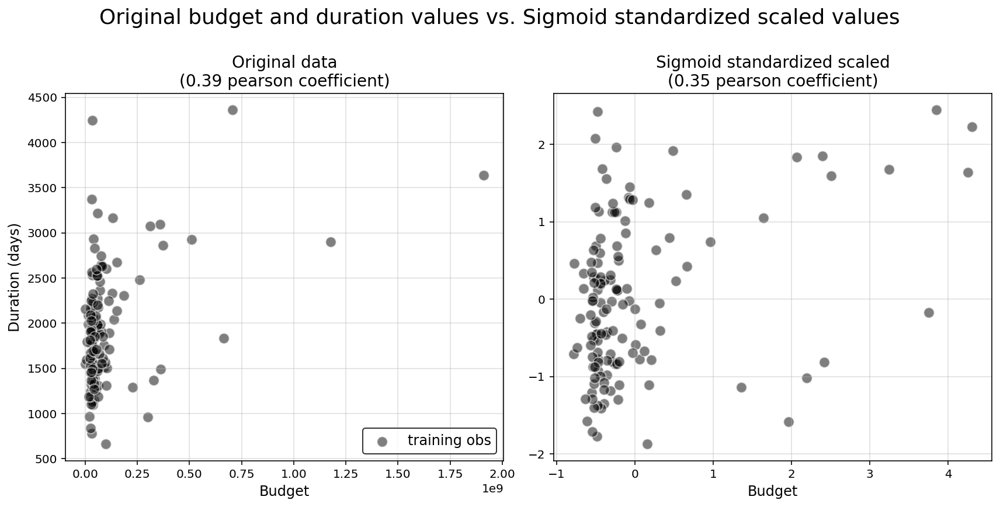

In [13]:
# Identify binary variable columns to exclude from scaling
exclude_scale_cols = list(X)[2:]

# Standardize X_train and X_test, pass through sigmoid transformation
# and re-standardize to minimize skew of data
scaler = StandardScaler
scale_before_func = None
scale_after_func = caproj.scale.sigmoid
reapply_scaler = True


X_std_sig, _ = caproj.scale.scale_features(
    X, X,
    exclude_scale_cols,
    scaler,
    scale_before_func,
    scale_after_func,
    reapply_scaler,
)

# inspect scaled datasets
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '14-scaled-std-sig-train-scatter.jpg', save_images
)
caproj.visualize.plot_bdgt_sched_scaled(
    X, X_std_sig, 'Sigmoid standardized', savepath=savepath
)

**RESULTS:**

As can be seen in the two plots above, 3-step scaling method we applied (standardize, sigmoid transform, and then re-standardize), as was described immediately above, does an adequate job of reducing (but not eliminating) the skew of our data and the magnitude out our outliers.

This we believe is an important first step before scaling, primarily to get all variables on a more common scale, so that the distance-based clustering algorithms used here are not overwhelmed by just the Budget_Start values, which range in the hundreds of millions of dollars.

With this scaling completed, we can now compare K-means at verious values for $k$.

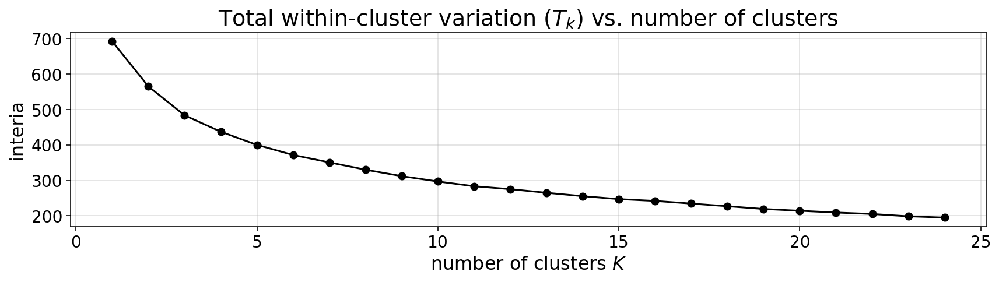

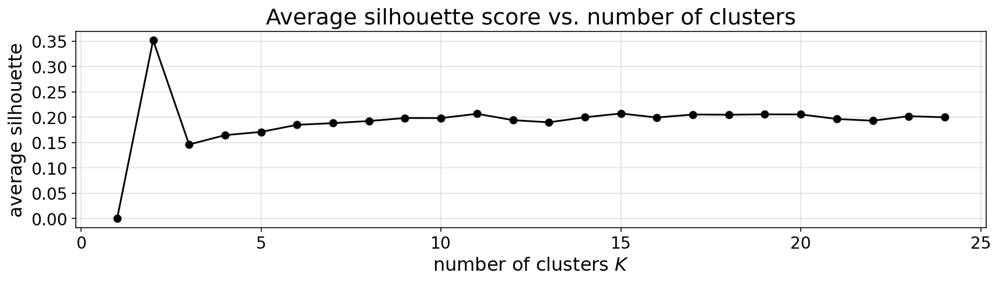

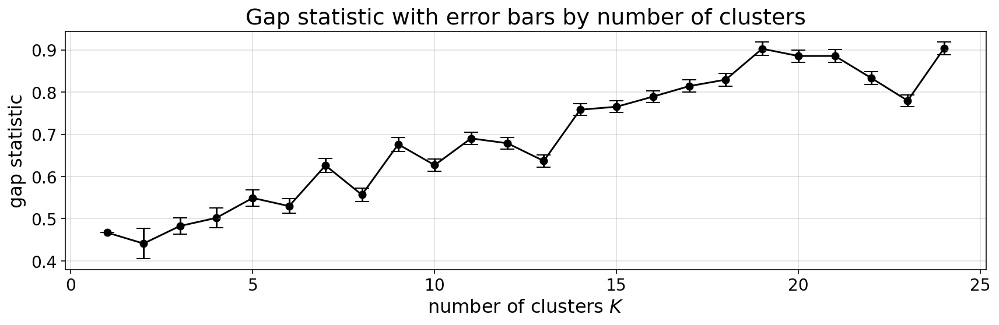

CPU times: user 6.38 s, sys: 1.26 s, total: 7.64 s
Wall time: 7.85 s


In [14]:
%%time

n_init = 40
random_state = 109

# define version of X scaled data to use throughout the remaining cells
X_data = X_std_sig

# define list of k values to compare
k_list = list(np.arange(1,25))

# fit kmeans at each value k and save to dict for future use
# reuse the same n_init=46 and random_state=109 values used previously
kmeans_dict = {
    k: KMeans(n_clusters=k, n_init=n_init, random_state=random_state).fit(X_data)
    for k in k_list
}

# save total within-cluster variation for each kmeans fit
tot_var_vals = [kfit.inertia_ for kfit in kmeans_dict.values()]

# set my plot parameters and generate my elbow plot
y_vals = tot_var_vals
x_vals = k_list
title = 'Total within-cluster variation ($T_k$) vs. number of clusters'
x_label = 'number of clusters $K$'
y_label = 'interia'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '15-kmeans-inertia-lineplot.jpg', save_images
)
caproj.visualize.plot_line(
    x_vals, y_vals, title, x_label, y_label, savepath=savepath
)

# save average silhouette score for each kmeans fit
# handle k=1 silhouette score error by inputting 0 as start to list
silscore_vals = [0] + [
    silhouette_score(X_data, kmeans_dict[k].labels_)
    for k in k_list[1:]
]

# set my plot parameters and generate my avg. silhouette score plot
y_vals = silscore_vals
x_vals = k_list
title = 'Average silhouette score vs. number of clusters'
x_label = 'number of clusters $K$'
y_label = 'average silhouette'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '16-kmeans-silscore-lineplot.jpg', save_images
)
caproj.visualize.plot_line(
    x_vals, y_vals, title, x_label, y_label, savepath=savepath
)

# Initialize OptimalK object
gs_obj = OptimalK()

# Provide OptimalK object with dataset and cluster array
n_clusters = gs_obj(X_data.values, n_refs=200, cluster_array=k_list)

# Plot Gap statistic with error bars
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '17-kmeans-gapstat-lineplot.jpg', save_images
)
caproj.cluster.display_gapstat_with_errbars(
    gs_obj.gap_df, savepath=savepath
)

**RESULTS:**

As is the problem with diagnostic metrics for evaluating K-means clustering, optimal values $k$ can be interpreted differently dependent on the metric and evaluative methods used.

For instance, in the inertia plot at the top above, it is rather unclear if any elbow exists in the line plot, althought careful inspection might indicate a slight visual kink at either 2 or 3 clusters.

Next, the average silhouette plot would indicate that 2 clusters are ideal if we are evaluating on average silhouette score alone.

Last, the Gap statistic plot indicates no conclusive result, as error bars overlap right from the start, but it does offer the intriguing feature that it jumps significantly at $k=7$.

**DBSCAN**

These inconclusive results led us to next examine what kind of unsupervised clustering might be achieved using DBSCAN, where rather than selecting an optimal number of clusters explicitly, the algorithm would do that for us. 

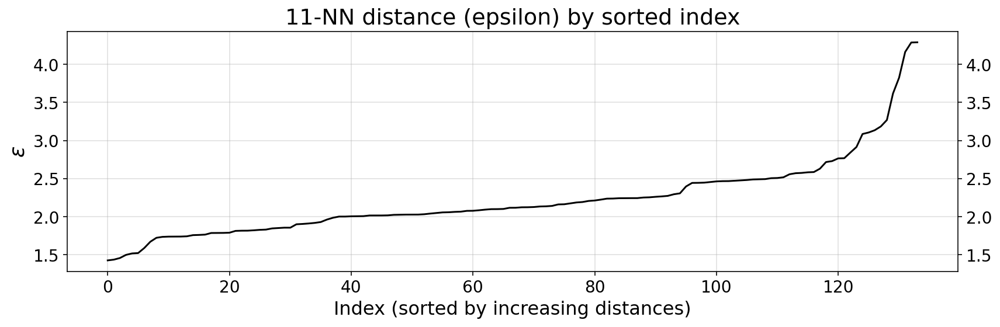


For the DBSCAN model:

DBSCAN(eps=2.25, min_samples=12)

2 clusters were identified, and 25 of the n=134 observations were not assigned to any clusters.

The distribution of resulting labels are illustrated by this chart with un-clustered observations represented by the cluster labeled -1.



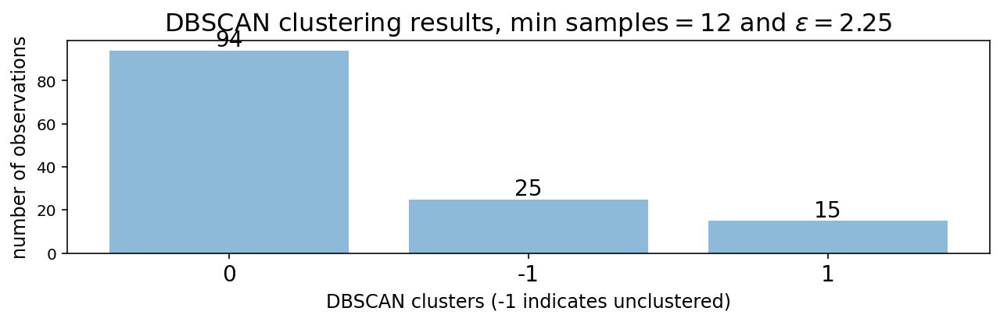


The resulting silhouette score, excluding the points not assigned to any cluster is:

	0.1843



In [15]:
# Use general rule of thumb presented in class where min_samples
# is set to the number of features (12) x 2
min_samples = 12 # 54 * 2

# Use knn to plot and identify suitable epsilon values for DBSCAN
distances = caproj.cluster.fit_neighbors(X_data, min_samples)
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '18-dbscan-epsilon-lineplot.jpg', save_images
)
caproj.cluster.plot_epsilon(
    distances, min_samples, height=4, savepath=savepath
)

eps = 2.25

dbscan = caproj.cluster.fit_dbscan(X_data, min_samples, eps)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '19-dbscan-cluster-barplot.jpg', save_images
)
caproj.cluster.print_dbscan_results(dbscan, savepath=savepath)

**RESULTS:**

It was extremely difficult to find a set of parameters $\epsilon$ and `min_samples` that yeilded any sort of separation of our data into discrete clusers using DBSCAN.

Shown here was the most "reasonably separated" set of clusters we could achieve. Accoding to this we have 2 major clusters, one more heavily distributed with 94 observations, and a set of 25 observation not assigned to either category.

**Agglomerative clustering using Ward's method**

As a final attempt to learn about the natural clustering of this data, we perform agglomerative clustering using Ward's method below, with the results plotted as a dendrogram.

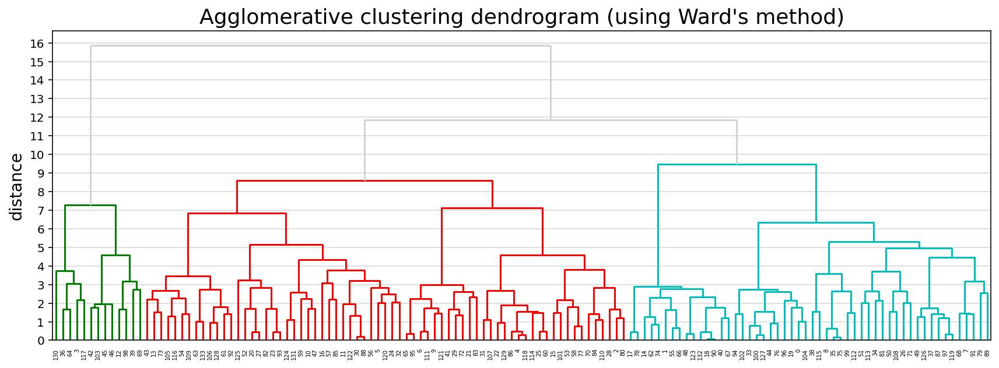

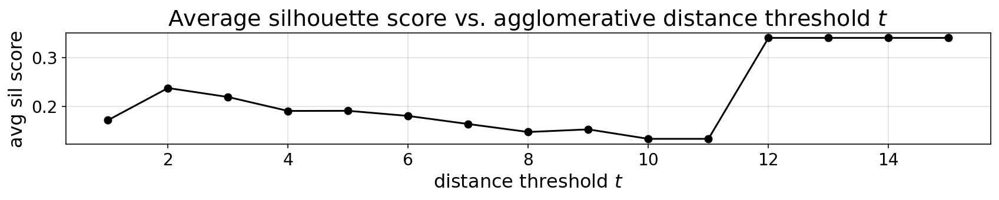

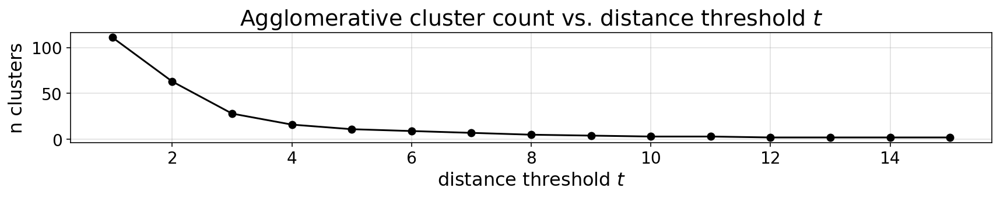


The maximum silhouette score of 0.340, suggests K=2 clusters at threshold t=12.



In [16]:
# generate distance matrix
dist_mat = pdist(X_data, metric="euclidean")

# perform wards linkage on distance matrix
ward_data = hac.ward(dist_mat)

# generate dendrogram plot from ward_data linkage data
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '20-wards-dendrogram.jpg', save_images
)
caproj.cluster.plot_dendrogram(
    ward_data, method_name="Ward's method",
    yticks=16, ytick_interval=1, height=4.5, savepath=savepath
)

# generate list of distance thresholds (t) to evaluate
t_list = np.arange(1, 16, 1)

# generate disctionary of cluster lables for each value t
label_dict = {
    t: hac.fcluster(ward_data, t=t, criterion='distance')
    for t in t_list
}

# calculate silhouette scores for each set of labels
sil_scores = [
    silhouette_score(X_data, labellings)
    for labellings in label_dict.values()
]

# generate list of cluster counts for each set of labels
cluster_counts =[
    len(set(labellings)) for labellings in label_dict.values()
]

# generate lineplot of sil score vs. distance threshold t
y_vals = sil_scores
x_vals = t_list
title = 'Average silhouette score vs. agglomerative distance threshold $t$'
x_label = 'distance threshold $t$'
y_label = 'avg sil score'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '21-wards-silscore-lineplot.jpg', save_images
)
caproj.visualize.plot_line(
    x_vals, y_vals, title, x_label, y_label, height=2.5, savepath=savepath
)

# generate lineplot of cluster count vs. distance threshold t
y_vals = cluster_counts
x_vals = t_list
title = 'Agglomerative cluster count vs. distance threshold $t$'
x_label = 'distance threshold $t$'
y_label = 'n clusters'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '22-wards-cluster-count-lineplot.jpg', save_images
)
caproj.visualize.plot_line(
    x_vals, y_vals, title, x_label, y_label, height=2.5, savepath=savepath
)

# identify optimal threshold and corresponding cluster count given silscores
max_sil = np.max(sil_scores)
max_idx = np.argmax(sil_scores)
max_sil_clust = cluster_counts[max_idx]
max_sil_thresh = t_list[max_idx]

print(
    '\nThe maximum silhouette score of {:.3f}, suggests K={} clusters at '\
    'threshold t={:,}.\n'.format(
        max_sil, max_sil_clust, max_sil_thresh,
    )
)

**RESULTS:**

Here we can see how Ward's method identifies distances between observations with linkage points illustrated in the dendrogram above. Using this method, we can see the average silhouette score decrease as the distance threshold increases (the middle line plot), until it spikes at the last few threshold values $t$. However, it is intersting to note just how quickly the number of clusters diminish as the threshold increases.

Overall, this method yields the highest average silhouette score at $k=2$ clusters.

**Visual inspection of K-means clustering**

Now that we are armed with this additional clustering information, we are going to inspect just a few sets of K-means clusters at a few values $k$ we think might be best suited to this data given our results above. Those will be $k$'s of 2, 3, and 5.

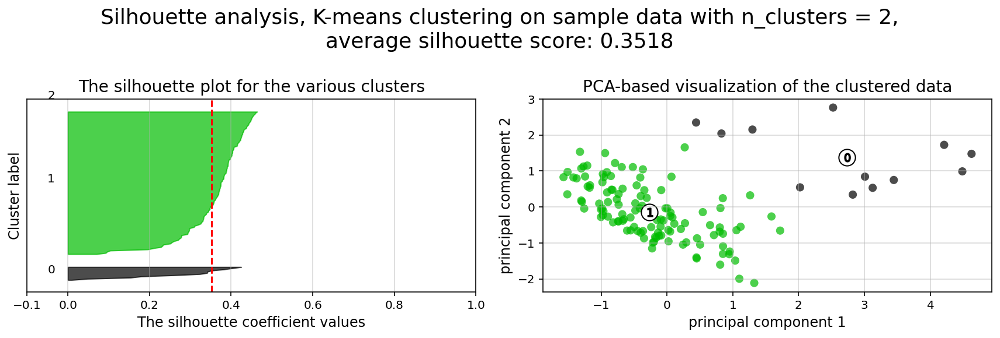

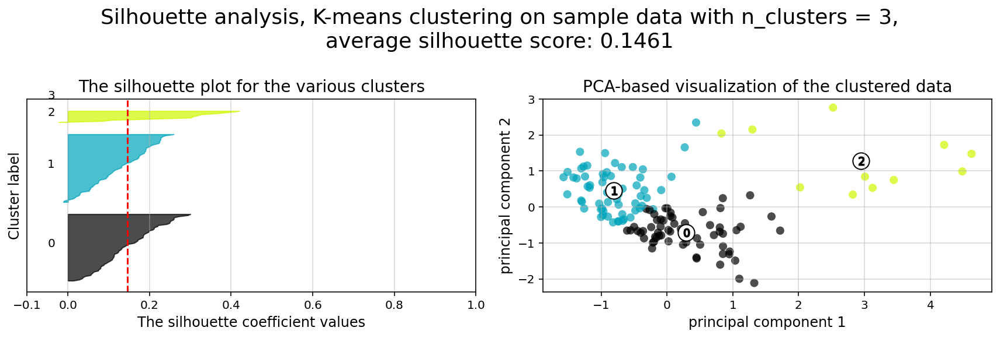

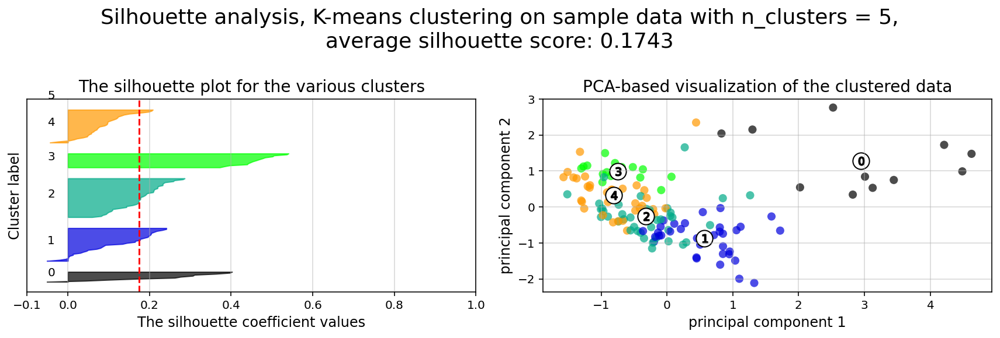

In [17]:
X_data = X_std_sig

# try with 2 clusters
n_classes = 2
n_init = 100

# fit kmeans algorithm and save to Cluster5 column in df
km_cluster2 = KMeans(
    n_clusters=n_classes, n_init=n_init, random_state=random_state
).fit(X_data)

cluster_labels = km_cluster2.labels_

silhouette_avg = silhouette_score(X_data, cluster_labels)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '23-kmeans-{}-silplot.jpg'.format(n_classes), save_images
)
caproj.cluster.silplot(
    X_data, cluster_labels, km_cluster2, height=4, savepath=savepath
)


# try with 3 clusters
n_classes = 3
n_init = 100

# fit kmeans algorithm and save to Cluster5 column in df
km_cluster3 = KMeans(
    n_clusters=n_classes, n_init=n_init, random_state=random_state
).fit(X_data)

cluster_labels = km_cluster3.labels_

silhouette_avg = silhouette_score(X_data, cluster_labels)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '24-kmeans-{}-silplot.jpg'.format(n_classes), save_images
)
caproj.cluster.silplot(
    X_data, cluster_labels, km_cluster3, height=4, savepath=savepath
)


# try with 5 clusters
n_classes = 5

# fit kmeans algorithm and save to Cluster5 column in df
km_cluster5 = KMeans(
    n_clusters=n_classes, n_init=n_init, random_state=random_state
).fit(X_data)

cluster_labels = km_cluster5.labels_

silhouette_avg = silhouette_score(X_data, cluster_labels)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '25-kmeans-{}-silplot.jpg'.format(n_classes), save_images
)
caproj.cluster.silplot(
    X_data, cluster_labels, km_cluster5, height=4, savepath=savepath
)

**RESULTS:**

As can be seen in the silhouette analysis plots and 2D PCA represenations above, all three values $k$ provide intriguing types of separation among our data. While we would have liked to incorporate K-means reference class classification features of several varying values $k$ in our engineered feature set for predictive comparisons in our regression models, we utlimately decided to choose just one K-means-derived reference class feature in favor of exploring other, more powerful clustering techniques as we illutrate below in section 3.1.2. In the end, we decided to balance clarity of separation as exhibited in the PCA plots above with a value $k$ which provided some degree of balance between the size and individual silhouette scores of several clusters. For that reason we choose $k=3$ for our eventual predictive reference class feature titled `attributes_km3_label` in our final model data.

<a name='umap'></a>

### 3.1.2. UMAP clustering for reference class labels

[Return to section index](#3.1.-Reference-class-clustering-with-K-means-and-UMAP)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/05_umap_hdbscan_features.ipynb)**


**Disadvantages of PCA, Kmeans, DBSCAN**

Caveats of Kmeans K-Means is the ‘go-to’ clustering algorithm for many simply because it is fast, easy to understand, and available everywhere. K-Means has a few problems however. The first is that it isn’t a clustering algorithm, it is a partitioning algorithm. That is to say K-means doesn’t ‘find clusters’ it partitions your dataset into as many (assumed to be globular) chunks as you ask for by attempting to minimize intra-partition distances. Clusters found in kmeans are usually similar in shapes, with an assumption of largely spherical clusters.

Also, as we saw above, finding the optimum number of clusters can be challenging. The gap statistic and silhouette plots help, but finding the 'elbow' was not too easy, nor does it necessarily correlate well with the number of natural clusters.

**A competing approach using UMAP in combination with HDBSCAN**

By using  HDBSCAN instead of the more standard DBSCAN, we can improve on our results by using a smarter density based algorithm. We chose HDBSCAN, which is an improved version of DBSCAN. Unlike DBSCAN, it allows variable density clusters. It also replaces the unintuitive epsilon parameter with a new parameter `min_cluster_size`, which is used to determine whether points are ‘falling out of a cluster’ or splitting to form two new clusters. HDBSCAN usually does very well with the points that it is confident enough to put into clusters, while leave out less confident points.

**The need to use dimensionality reduction techniques in conjunction with HDBSCAN**

We used HDBSCAN on the raw, one-hot-encoded data and got between 70% - 80% of the data clustered. While HDBSCAN did a great job on the data it could cluster it did a poor job of actually managing to cluster the data. The problem here is that, as a density based clustering algorithm, HDBSCAN tends to suffer from the curse of dimensionality: high dimensional data requires more observed samples to produce much density. If we could reduce the dimensionality of the data more we would make the density more evident and make it far easier for HDBSCAN to cluster the data. The problem is that trying to use PCA to do this can be problematic due to its linear nature. What we need is strong manifold learning, which graph-based methods like t-sne and UMAP can offer. We chose UMAP since it is faster and preserves global structures better.

Our goal is to make use of **Uniform Manifold Approximation and Projection (UMAP)** to perform non-linear manifold aware dimension reduction so we can get the dataset down to a number of dimensions small enough for a density based clustering algorithm to make progress. UMAP constructs a high dimensional graph representation of the data, with edge weights representing the likelihood that two points are connected. It chooses whether one point is connected to another or not using a local radius metric, based on the distance to each point's nth nearest neighbor, then optimizes a low-dimensional graph to be as structurally similar as possible.

Tuning UMAP The most important parameter is `n_neighbors` - the number of approximate nearest neighbors used to construct the initial high-dimensional graph. It effectively controls how UMAP balances local versus global structure - low values will push UMAP to focus more on local structure by constraining the number of neighboring points considered when analyzing the data in high dimensions, while high values will push UMAP towards representing the big-picture structure while losing fine detail. As `n_neighbors` increases, UMAP connects more and more neighboring points when constructing the graph representation of the high-dimensional data, which leads to a projection that more accurately reflects the global structure of the data. At very low values, any notion of global structure is almost completely lost.

**Sources and additional resources:**

- https://pair-code.github.io/understanding-umap/

- https://umap-learn.readthedocs.io/en/latest/clustering.html

- https://hdbscan.readthedocs.io/en/latest/comparing_clustering_algorithms.html


**Getting started:**

To get started on this task, we trained UMAP transformer on the train set, and use that for getting 2D embedding from train data as additional features during training time. At inference time, we use the same transformer (fitted only on train) to transform the test set.

We can see from the visualizations below that the 2D embedding gives us some insight into our data. It shows separation between cluster of points, and their is some logic in the direction of the components with regards to our two target variable `Budget_Change_Ratio` and `Schedule_Change_Ratio`.

**NOTE:** For the purpose of brevity and computational cost for this report, we import pickled versions of the resulting models below instead of re-run all of our exploratory models here. To view the full code used to generate these results, please see [the complete notebook on GitHub](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/05_umap_hdbscan_features.ipynb).

In [18]:
# read in all the pickled python objects and data required for this
# section. To see the original code used to explore and generate our
# findings, we suggest you review the GitHub notebook linked above
scaler = pickle.load(open(filepath_scaler, "rb"))
clusterer = pickle.load(open(filepath_clusterer, "rb"))
final_cols = pickle.load(open(filepath_final_cols, "rb"))
mapper_dict = pickle.load(open(filepath_mapper_dict, "rb"))
clustering_X_full = pickle.load(open(filepath_clustering_X_full, "rb"))

# read in bert embedding, discussed in more detail in Section 4
bert_embedding = pd.read_csv(filepath_bert).round(2)

embedding_expanded = bert_embedding["embedding"].str.split(
    ",", expand=True
)
embedding_expanded.columns = [
    f"description_embedding_original"
    for num in embedding_expanded.columns
]
bert_embedding = bert_embedding.join(embedding_expanded)
bert_embedding = bert_embedding.drop_duplicates("PID")
bert_embedding = bert_embedding.drop(
    columns="embedding"
).reset_index().drop(columns="index")

# use custom UMAP embedder class to manage visualizations
# and trained clustering models analysis. This class can be found in the
# module `../src/cluster.py` on the GitHub repository
UMAP_transformer = caproj.cluster.UMAP_embedder(
    scaler, final_cols,
    mapper_dict, clusterer,
    bert_embedding
)

/home/sedelmeyer/.local/share/virtualenvs/nyc-capital-projects-nSoXLpsW/lib/python3.7/site-packages/sklearn/base.py:334: UserWarning: Trying to unpickle estimator RobustScaler from version 0.22.2.post1 when using version 0.23.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


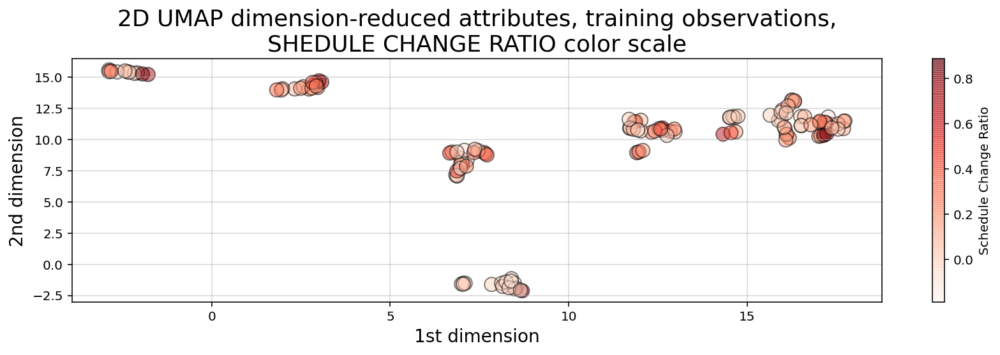

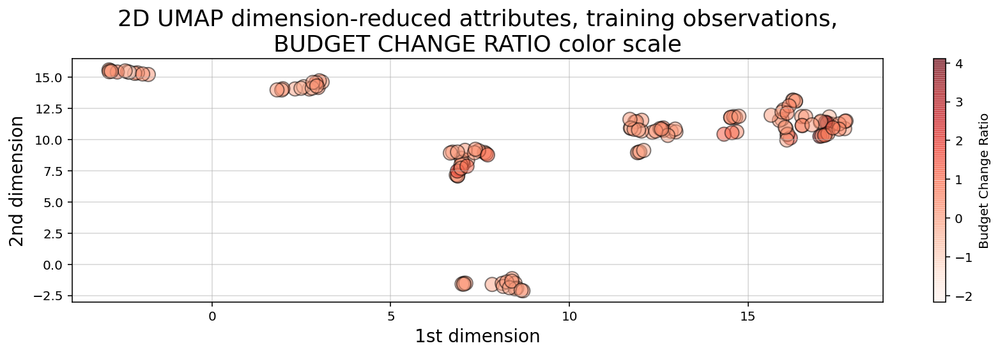

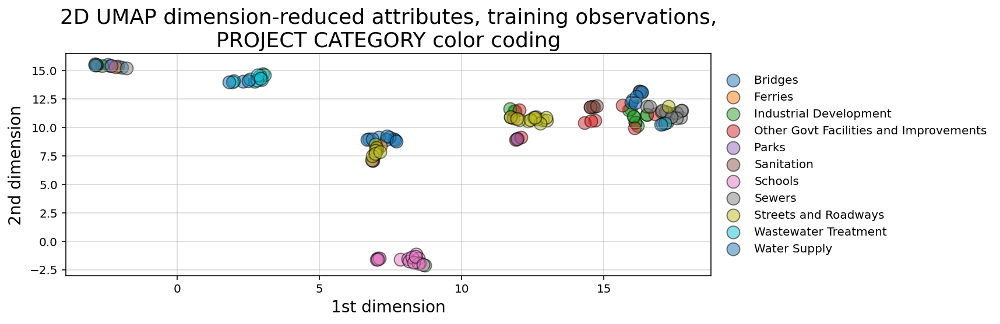

In [19]:
# now we print our UMAP reduced dimensions against a few existing
# features already present in our data
filter_cond = data_train["PID"].notnull()
UMAP_description_all_projects = UMAP_transformer.get_mapping_description(
    bert_embedding, dimensions=["2D"]
).drop(columns="description_embedding_original")


x_col = "umap_attributes_2D_embed_1"
y_col = "umap_attributes_2D_embed_2"

scale_var = "Schedule_Change_Ratio"
color = np.log(data_train[scale_var][filter_cond] + 1)
colormap = 'Reds'

title = '2D UMAP dimension-reduced attributes, training observations,\n'\
        'SHEDULE CHANGE RATIO color scale'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '26-umap-schedule-scale-scatter.jpg', save_images
)
caproj.cluster.plot_umap_scatter(
    data_train[filter_cond][x_col],
    data_train[filter_cond][y_col],
    color,
    title,
    scale_var,
    savepath=savepath,
)

scale_var = "Budget_Change_Ratio"
color = np.log(data_train["Budget_Change_Ratio"][filter_cond] + 1)

title = '2D UMAP dimension-reduced attributes, training observations,\n'\
        'BUDGET CHANGE RATIO color scale'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '27-umap-budget-scale-scatter.jpg', save_images
)
caproj.cluster.plot_umap_scatter(
    data_train[filter_cond][x_col],
    data_train[filter_cond][y_col],
    color,
    title,
    scale_var,
    savepath=savepath,
)


cat_col = "Category"

title = '2D UMAP dimension-reduced attributes, training observations,\n'\
        'PROJECT CATEGORY color coding'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '28-umap-category-color-scatter.jpg', save_images
)
caproj.cluster.plot_category_scatter(
    data_train, x_col, y_col, cat_col, title, savepath=savepath
)

**Clustering our UMAP projections:**

After our initial dimensionality reduction with UMAP, we then applied HDBSCAN on the resulted UMAP embedding and got much better results than clustering on our raw data. HDBSCAN was able to cluster > 99% of points, and the clusters all contained multiple types of project categories (as can be seen by examining the clusters below and comparing them to the category-colored scatterplot of the UMAP embedding above). We interperet this to mean that we were able to capture more information in our would-be reference classes than we might otherwise have been able to capture by using the existing defined categories present in the original dataset.

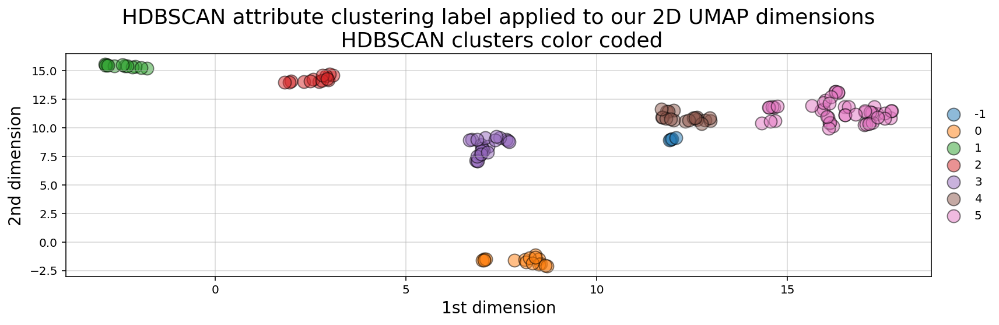


For comparison, the resulting average silhouette score for our two methods
of reference class clustering are, when measured against our original
training data (without any feature engineering) are:

	K-means 3		0.1461
	UMAP with HDBSCAN	0.1798



In [20]:
cat_col = "attribute_clustering_label"
# color = np.log(plot_df["Budget_Change_Ratio"][filter_cond] + 1)

title = 'HDBSCAN attribute clustering label applied to our 2D UMAP '\
        'dimensions\n HDBSCAN clusters color coded'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '29-umap-hdbscan-color-scatter.jpg', save_images
)
caproj.cluster.plot_category_scatter(
    data_train, x_col, y_col, cat_col, title, savepath=savepath
)

print(
    '\nFor comparison, the resulting average silhouette score for our '\
    'two methods\nof reference class clustering are, when measured '\
    'against our original\ntraining data (without any feature '\
    'engineering) are:\n\n'\
    '\tK-means 3\t\t{:.4f}\n\tUMAP with HDBSCAN\t{:.4f}\n'.format(
        silhouette_score(X_data, data_train['attribute_km3_label']),
        silhouette_score(X_data, data_train['attribute_clustering_label'])
    )
)

**FINDINGS:**

As a point of comparison, now that we have a second set of reference classes to compete in our models against the [K-means cluster completed in section 3.1.1](#3.1.1.-K-means-clustering-for-reference-class-labels), we can most directly compare both sets of clustered reference classes by examining the average silhouette scores of those clusters on our original set of training data. As is shown in the output above, the UMAP with HDBSCAN method achieves a slightly higher avg. silhoutte score at 0.1798 than the K-means $k=3$ clusters, which scored 0.1461. While this might indicate better clustering using UMAP with HDBSCAN, the real test comes when we attempt to use each of theses engineered features in competing prediction models.

**Understand characteristics of projects in each of our clustering labels:**

In our attempt to understand the 5 clusters/latent reference classes shown above, we used two approaches in our more complete notebook (which can be [found here](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/05_umap_hdbscan_features.ipynb)):

1. Fit 5 binary classification classifiers, each predicting the datapoints of one cluster vs the rest of the data

2. Select which variable has the highest variance between clusters, with the assumption that cluster-defining variables will have very different mean from one cluster to another.

However, since approach 2 yielded better results, for the sake of brevity, that is all we are showing below.


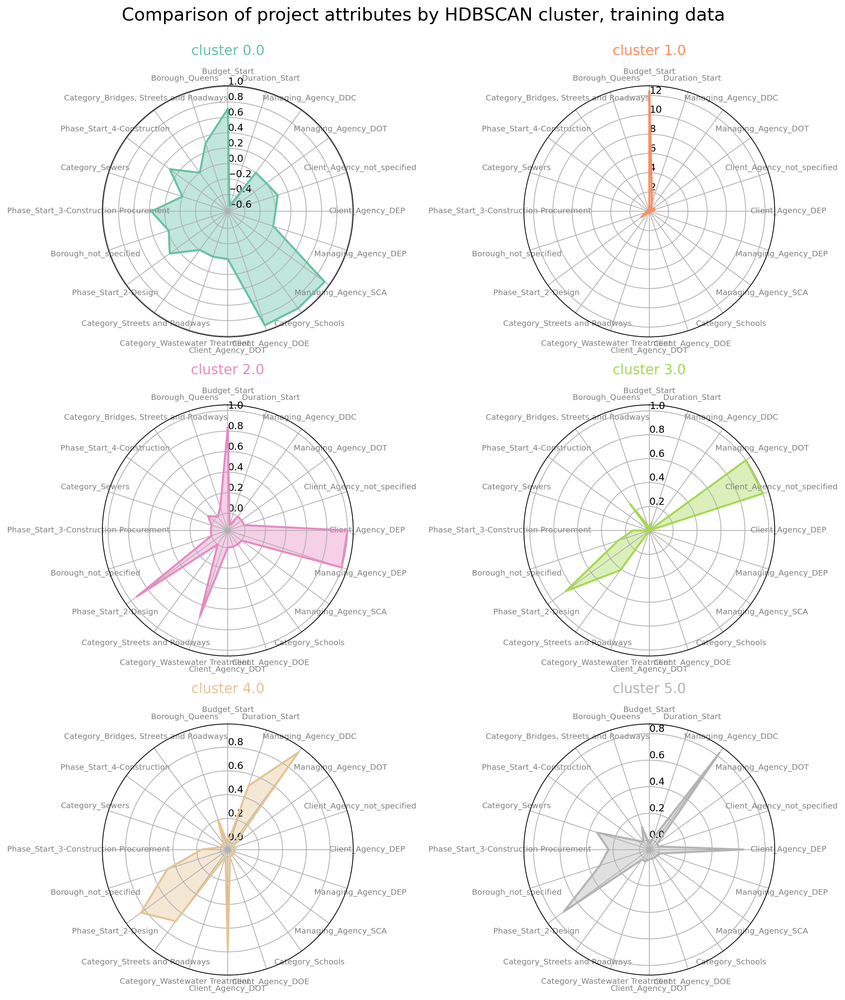

In [21]:
# manipulated UMAP clustering data so that we can generate radar
# plots of the features inherent in each HDBSCAN cluster
embedding_latest, _, scaled_df, dummified = UMAP_transformer.get_mapping_attributes(
    data_train.copy().drop(columns="Category").rename(
        columns={"Category_Old": "Category"}
    ),
    dimensions=["2D"],
    return_extra=True
)

clustering_X = clustering_X_full[UMAP_transformer.final_cols]
clustering_X = clustering_X.assign(
    label=data_train["attribute_clustering_label"][
        data_train["attribute_clustering_label"]!= -1
    ]
)
dummified = dummified.assign(
    label=data_train["attribute_clustering_label"][
        data_train["attribute_clustering_label"]!= -1
    ]
)

high_var_features_between_clusters = dummified.groupby(
    "label"
).mean().var().sort_values(ascending=False)

radar_plots_df = dummified[
    list(
        high_var_features_between_clusters.loc[
            high_var_features_between_clusters.values >= 0.01
        ].index
    ) + ["label"]
].groupby("label").mean().reset_index().rename(columns={"label":"group"})

# plot cluster attributes with custom spider plot function in `..src/cluster.py`
title = "Comparison of project attributes by HDBSCAN cluster, training data"

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '30-umap-hdbscan-spiders.jpg', save_images
)
caproj.cluster.plot_spider_clusters(title, radar_plots_df, savepath=savepath)

**FINDINGS:**

By plotting the cluster-defining features onto radar plots, we can find intuitive explanations for each of the clusters. For example, cluster 5 are projects that are Managed by DDC, with DEP as Client agency. They are typically Sewers construction projects in Queens. Overall, we see an interesting mixing of each categorical variable within our clusters, indicating that our clustering algorithm did a good job separating projects along more than one set of dimensions, and may taken into account a set of latent relationships between all our available features, adding more richness than we might otherwise be able to do by explicitly assigning the reference classes ourselves.

Now, since our main goal is to use these reference classes to help improve our predictions, we visualize the histogram of projects Budget Change Ratio and Schedule Change Ratio, colored by clusters in the two plots below. 

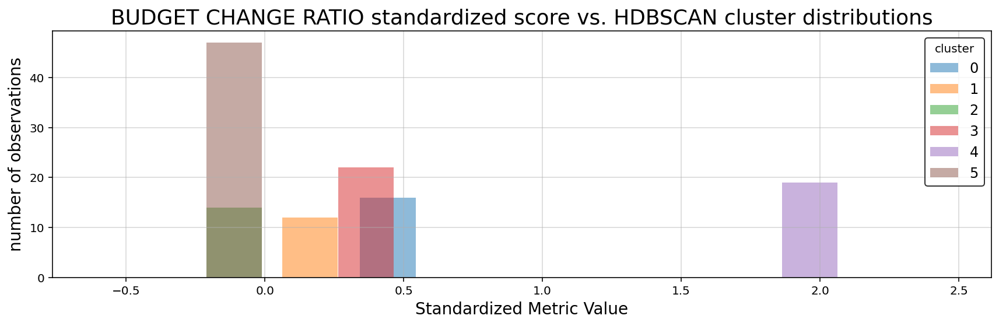

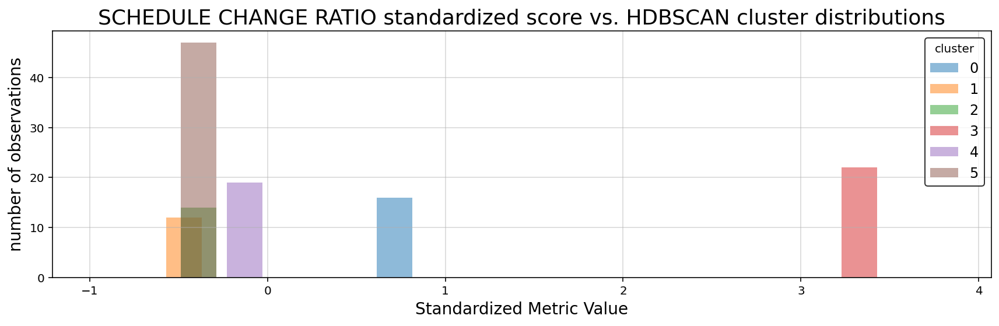

In [22]:
plot_cluster_metrics_df = clustering_X_full[
    ["Budget_Change_Ratio", "Schedule_Change_Ratio", "label"]
].rename(columns={"label":"cluster"})

# melt our dataset to make each metric value an observation
df_melt = plot_cluster_metrics_df.melt(
    id_vars=["cluster"],value_name= "Standardized Metric Value", var_name="Metric"
)

# use our custom plot_cluster_hist function from `..src/cluster.py' module
# to plot cluster vs standardized values for budget and schedule change
val_col = 'Standardized Metric Value'
cluster_col = 'cluster'

metric = 'Budget_Change_Ratio'
title = 'BUDGET CHANGE RATIO standardized score vs. HDBSCAN cluster distributions'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '31-umap-hdbscan-budget-hist.jpg', save_images
)
caproj.cluster.plot_cluster_hist(
    df_melt, title, metric, cluster_col, val_col, bins=5, savepath=savepath
)

metric = 'Schedule_Change_Ratio'
title = 'SCHEDULE CHANGE RATIO standardized score vs. HDBSCAN cluster distributions'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '32-umap-hdbscan-schedule-hist.jpg', save_images
)
caproj.cluster.plot_cluster_hist(
    df_melt, title, metric, cluster_col, val_col, bins=5, savepath=savepath
)

**FINDINGS:**

Based on these histograms, we can see that there are decent separation among our clusters in both of our response variable dimensions, `Budget_Change_Ratio` and `Schedule_Change_Ratio`. The clustering labels as a feature may perhaps help us most in predicting outlier values (as evidenced by the separation of cluster 4 in `Budget_Change_Ratio` and cluster 3 in `Schedule_Change_Ratio`) and may even help to distinguishing a set of other obervations from one another in our regressor models, except in areas of heavily overlapping clusters (e.g. clusters 2 and 5)

**CONCLUSION:**

Now that we feel we have created a two sufficient sets of competing reference classes to test within our models, we move on the embedding the textual project-description data available in our data set.

## 3.2. Embedding project descriptions text with BERT

[Return to section index](#3.-Feature-engineering)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/02_bert_embedded_descriptions.ipynb)**

Here, the objective is to create an embedding from the project descriptions for each project in our dataset.  We won't be making predictions based directly on the full embedding of each descriptions. Because our resulting embedding for each project description will be 512 values in length (the shortest available pre-trained BERT embedding), this would introduce far too many additional features into our predictor set to be of use for such a small training dataset. Instead, we will be extracting the latent space that these BERT embeddings provide via several different dimensionality reduction methods described below in sections [3.3.1 (PCA)](#3.3.1.-PCA-dimension-reduced-encoding-of-BERT-embedded-text), [3.3.2 (dense autoencoder)](#3.3.2.-Autoencoder-dimension-reduced-encoding-of-BERT-embedded-text), and [3.3.3 (uniform manifold approximation and projection, or UMAP for short)](#3.3.3.-UMAP-dimension-reduced-encoding-of-BERT-embedded-text).  Our resulting demensionality reduced description embeddings will be limited to 2 dimensions each to limit model complexity.  If we find that any of the 2-dimensional description embeddings prove useful in our models, it may be useful to explore using a larger-dimension latent space in the future.

For our embedding exercise, BERT was chosen because it is currently a leading NLP model and has a bi-directional character which should allow the resulting embedding to take into account more expressive sequential relationships among words in each description.

### Citation:

For additional information on the pre-trained BERT model used in this analysis, please see the original project's source repository:

- https://github.com/google-research/bert

The specific pre-trained BERT model used here, ``uncased_L-2_H-128_A-2``, was downloaded from:

- https://storage.googleapis.com/bert_models/2020_02_20/uncased_L-2_H-128_A-2.zip

Additionally, this pre-trained model is referenced by its author's in the following article:

- Turc, Iulia and Chang, Ming-Wei and Lee, Kenton and Toutanova, Kristina. (2019). "Well-Read Students Learn Better: On the Importance of Pre-training Compact Models". [arXiv preprint arXiv:1908.08962v2](https://arxiv.org/abs/1908.08962)

And, more information regarding BERT itself can be found in the original paper:

- Devlin, Jacob and Chang, Ming-Wei and Lee, Kenton and Toutanova, Kristina. (2018). "BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding". [arXiv preprint arXiv:1810.04805](https://arxiv.org/abs/1810.04805)

In [23]:
%%time

# NOTE: This code block can take 30 minutes to execute.
# If the BERT embedding .csv file already exists, you don't need
# to run this unless you are changing the model

load_saved = True

if load_saved:

    data_embed = pd.read_csv(filepath_bert)
    
else:
    
    # bert pretrained model
    bert_model = 'uncased_L-2_H-128_A-2' 
    model_path = os.path.join(BERT_BASE_DIR, bert_model)
    output_file = '../data/processed/embeddings_' + bert_model + '_v2.csv'
    
    # drop duplicates if they exist, ensuring only one record each
    all_descriptions = data_allyears[['PID', 'Description']].drop_duplicates()
    
    # get the indexes of just the first line per project
    pid_only_index = all_descriptions['PID'].drop_duplicates().index

    projects = all_descriptions.loc[pid_only_index]
    
    with open(output_file, 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile, delimiter=",")
        csv_writer.writerow(['PID', 'embedding'])

        for row in tqdm(
            projects.itertuples(), total=len(projects),
            desc="Creating embeddings"
        ):

            # if project description is nan, make it an underscore
            if type(row.Description) == float:
                desc = ['_']
            else:
                # Join all sentences into list of 1 element.
                # This ensures that output is same length for each description.
                desc = [
                    x.strip() for x in row.Description.split('.')
                    if x != ''
                ]
                desc = [' '.join(desc)]

            # calculate embedding and format to store in csv file
            emb = extract_embeddings(
                model_path, desc, output_layer_num=4,
                poolings=[POOL_NSP, POOL_MAX]
            )[0]
            emb = str(list(emb)).replace('[','').replace(']','')

            csv_writer.writerow([row.PID, emb])
    
    data_embed = pd.read_csv(output_file)

CPU times: user 16.6 ms, sys: 88 µs, total: 16.7 ms
Wall time: 15.2 ms


In [24]:
# dedupe dataframe by keeping first occurance of each PID if multiple exist
data_embed = data_embed.copy().drop_duplicates(subset='PID', keep='first')

# split embedding data into train/test splits

# identify PIDs in train and test sets
train_pids = data_train['PID'].values
test_pids = data_test['PID'].values

# used those PIDs to create two subsetted versions of the embed data
embed_train = data_embed.set_index('PID').copy().loc[train_pids]
embed_test = data_embed.set_index('PID').copy().loc[test_pids]

# generate embeddings train and test embedding value arrays

# save index keys for both embedding sets just in case
pid_key_train = embed_train.index
pid_key_test = embed_test.index

# extract embedding values from comma separated strings and convert to matrix 
embed_array_train = np.vstack(
    embed_train['embedding'].str.split(',').apply(
        lambda x: np.array(x).astype(float)
    ).values
)

embed_array_test = np.vstack(
    embed_test['embedding'].str.split(',').apply(
        lambda x: np.array(x).astype(float)
    ).values
)

# check shapes and types of resulting arrays
print(
    '\n\nBERT EMBEDDING DATA SUMMARY:\n\n'
    'The resulting shapes of the train and test bert embeddings '\
    'arrays are:\n\n\tTrain\t{}\n\tTEST\t{}\n'.format(
        embed_array_train.shape, embed_array_test.shape 
    )
)
print(
    "The length of each project's description-text "\
    "embedding is an array of\nn={} float values\n".format(
        embed_array_train.shape[1]
    )
)
print(
    "For all {:,} embedding values used to describe our description "\
    "text\nfor the TRAINING set, these are the basic summary statistics:"\
    "\n\n\tmin\t{:.2}\n\tmax\t{:.2}\n\tmean\t{:.2}\n\tstd\t{:.2}\n\n"\
    "".format(
        embed_array_train.shape[0]*embed_array_train.shape[1],
        embed_array_train.min(), embed_array_train.max(),
        embed_array_train.mean(), embed_array_train.std()
    )
)



BERT EMBEDDING DATA SUMMARY:

The resulting shapes of the train and test bert embeddings arrays are:

	Train	(134, 512)
	TEST	(15, 512)

The length of each project's description-text embedding is an array of
n=512 float values

For all 68,608 embedding values used to describe our description text
for the TRAINING set, these are the basic summary statistics:

	min	-6.9
	max	5.6
	mean	0.67
	std	1.2




**RESULT:**

As can be seen by the printed summary output above, the resulting BERT embeddings for each observation resulted in the expected array of 512 float values. Now, be subsetted our embeddings to match the projects contained in our training and test sets, we are able to train different dimensionality-reduction methods on our training set to generate a set of 2-dimensional training embeddings. We can then use those fitted models predict our test (or previously unseen) embeddings for use in evaluating our eventual "project success" prediction models.

**In the next section below (Section 3.3), we examine 3 competing methods for reducing the dimensions of our 512-dimension description-text BERT embeddings to just 2 dimensions each.**

## 3.3 Encoding the BERT embedding with PCA, Autoencoders, and UMAP

[Return to section index](#3.-Feature-engineering)

**IN THIS SECTION:**

**[3.3.1. PCA dimension-reduced encoding of BERT embedded text](#3.3.1.-PCA-dimension-reduced-encoding-of-BERT-embedded-text)**

**[3.3.2. Autoencoder dimension-reduced encoding of BERT embedded text](#3.3.2.-Autoencoder-dimension-reduced-encoding-of-BERT-embedded-text)**

**[3.3.3. UMAP dimension-reduced encoding of BERT embedded text](#3.3.3.-UMAP-dimension-reduced-encoding-of-BERT-embedded-text)**

As described above in the previous section, Section 3.3. of our analysis focuses on 3 competing methods for reducing the dimensions of our 512-dimension BERT embeddings. The objective of these reduced-dimension embeddings will be to reduce our current BERT embeddings to just 2 values each. If we are able to effectively accomplish this, we will have reduced 512 possible predictors to just 2, minimizing the added complexity to our "project success" prediction models. The challenge here though, will be to reduce this dimensionality in such a way that we retain as much explained variance in our embeddings as possible, but in a greatly reduced dimension-space. As can be seen in the "IN THIS SECTION" list above, **we will explore principal component analysis (PCA), "latent space" encoding with a dense autoencoder neural network, and uniform manifold approximation and projection (UMAP) as our methods of choice.**

### 3.3.1. PCA dimension-reduced encoding of BERT embedded text

[Return to section index](#3.3-Encoding-the-BERT-embedding-with-PCA,-Autoencoders,-and-UMAP)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/04_pca_autoencoder_features.ipynb)**

Here we start with PCA as our first method for reducing the dimensions of our BERT embeddings.

- Please note, given the random seed we use in our algorithm below, the resulting PCA components generated for both train and test will be perfectly identical to the values present in the train and test dataframes we have already loaded from disk. Those values can be access in the train and test columns titled `'pca_descr_embed_1'` and `'pca_descr_embed_2'`


- Also, note we are training our PCA algorithm only on our training data, therefore treating our test data as "unseen" or new data against with we apply the fitted model to generate components as we would when new project observations are acquired.


- Lastly, note that, because the BERT embeddings are all of the same units of measure, we have choosen not to standardize our BERT embeddings data prior to fitting our PCA decomposition model.

PCA decomposition fitted on training data embeddings.

Total variance explained by the first 2 PCA components: 31.64%



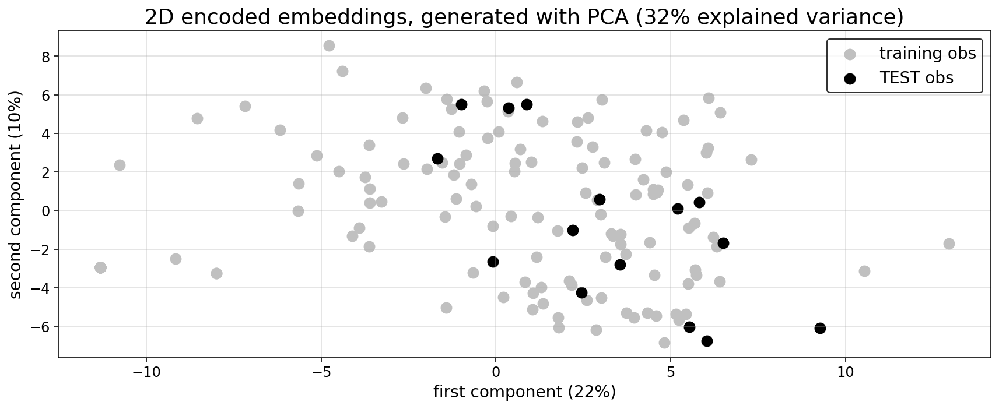

In [25]:
# generate PCA reduction by fitting on our training set
n_components = 2
random_seed = 109

PCA_embed = PCA(
    n_components=n_components, random_state=random_seed
).fit(embed_array_train)

pca_expvar = PCA_embed.explained_variance_ratio_
total_expvar = pca_expvar.sum()

print(
    'PCA decomposition fitted on training data embeddings.\n\n'\
    'Total variance explained by the first 2 PCA components: {:.2%}'\
    '\n'.format(total_expvar)
)

# Now to generate our PCA latent embeddings

# NOTE: these embeddings will be IDENTICAL to the values in
# the following columns of our train and test datasets:
# 'pca_descr_embed_1', 'pca_descr_embed_2'

pca_embed_train = PCA_embed.transform(embed_array_train)
pca_embed_test = PCA_embed.transform(embed_array_test)

pca_expvar = PCA_embed.explained_variance_ratio_
total_expvar = pca_expvar.sum()

title = '2D encoded embeddings, generated with PCA '\
        '({:.0%} explained variance)'.format(total_expvar)
xlabel = 'first component ({:.0%})'.format(pca_expvar[0])
ylabel = 'second component ({:.0%})'.format(pca_expvar[1])

pca_cols = ['pca_descr_embed_1', 'pca_descr_embed_2']

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '33-bert-pca-scatter.jpg', save_images
)
caproj.visualize.plot_2d_embed_scatter(
    pca_embed_train,
    pca_embed_test,
    title, xlabel, ylabel,
    point_size=80,
    savepath=savepath,
)

**RESULTS:**

As can be seen in the output above, the first 2 principle components for our PCA model fitted on our training set comprises $31.64\%$ of the explained variance in our 512-dimension dataset of BERT embeddings. This result strikes us as particularly promising given the high degree to which we have reduced the dimensionalty of this data. However, the true test of this method will be whether or not these 2 dimensions, when incorporated as predictors for one of our prediction models, will yield us improved predictive behavior in our models.

Now, with PCA taken care of, we move on to our next competing method for reducing the dimensionality of our BERT embeddings: "latent space" encoding with a dense autoencoder neural network.

### 3.3.2. Autoencoder dimension-reduced encoding of BERT embedded text

[Return to section index](#3.3-Encoding-the-BERT-embedding-with-PCA,-Autoencoders,-and-UMAP)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/04_pca_autoencoder_features.ipynb)**

In this section, we apply a dense autoencoder neural network to generate an encoded (and learned) 2-dimensional latent space (i.e. 2-dimensional bottleneck) with which we can encode our 512-dimension BERT embeddings to just 2 dimensions.

Because of the difficulty associated with trying to perfectly replicate our original results of this autoencoder network in this report notebook (the original of which [can be seen on GitHub at this location](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/04_pca_autoencoder_features.ipynb)), we will:

1. Call the same custom function used to generate the architecture and compile that original model for illustrative purposes.


2. Load and plot the training history of that originally trained model.


3. Plot the 2-dimensional latent space of that original autoencoder, which can be visualized by plotting the original values saved to our current train and test sets under the columns titled  `'ae_descr_embed_1'` and `'ae_descr_embed_2'`.

Now we first replicate the architecture of our originally trained model, as is shown below, and load a pickled Python dictionary containing the original training loss values at the end of each trained epoch.

In [26]:
# recreate autoencoder model architecture for illustrative purposes
input_dim = 512 # embed_array_train.shape[1]
encoding_dim = 2
droprate = 0.2
learning_rate = 0.005
name = 'ae_2dim'

ae2, encoder2, decoder2 = caproj.autoencoder.build_dense_ae_architecture(
    input_dim, encoding_dim, droprate, learning_rate, name
)

# print summaries of each model
print('\nTHE ENCODER MODEL:\n')
encoder2.summary()
print('\n\nTHE DECODER MODEL:\n')
decoder2.summary()
print('\n\nTHE AUTOENCODER (AE) MODEL:\n')
ae2.summary()
print('\n')

# read pickled training history to plot training history

with open(filepath_ae_hist, 'rb') as f:
    ae2_history_dict = pickle.load(f)

# extract relevant metrics from training history dict
# for later printing
loss = ae2_history_dict['loss']
val_loss = ae2_history_dict['val_loss']

n_epochs = len(loss)
min_loss = min(loss)
min_val_loss = min(val_loss)


THE ENCODER MODEL:

Model: "ae_2dim_encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 512)]             0         
_________________________________________________________________
dense (Dense)                (None, 512)               262656    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               65664     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                4128      
_________________________________________________________________
dropout_2 (Dropout)          (

**ABOUT THE NETWORK ARCHITECTURE:**

As can be seen in the printed model summaries above, our full dense autoencoder network is actually a composition of two separate models. The first model, which takes the original 512 BERT embeddings values as input is our "Encoder" model. That encoder model reduces the dimensions of our embeddings incrementally by passing those embeddings through 5 dense layers, each of which becomes incrementally smaller (with fewer output nodes), until it reduces to a 2-dimensional bottleneck. The Encoder model output at this bottleneck can be thought of as the 2-dimensional latent spaced learned by our network to represent the encoded distribution of these BERT training embeddings. Then, the output from the Encoder model becomes the input for the Decoder model, which works the same process with 5 additional dense layers, but in reverse order. Ultimately decoding our 2-dimensional encoded BERT embeddings back to their original dimension.

In between each dense layer of the Encoder and Decoder networks are dropout layers, with dropout rates set to 0.20. The rationale for including these dropout layers is to try to prevent our network from memorizing the the training set, thus hopefully helping the autoencoder to generalize to the new "unseen" embeddings which it will ultimately encounter in our test set. While our inclination was to increase the dropout rate further for these layers, we ultimately kept it at 0.20 due to some interesting behaviour in our encoded latent space, which we will explore with the accompanying scatterplot shown below.

Lastly, our complete autoencoder model was compiled using Adam with a learning rate of 0.005 as our optimizer and mean squared error as our reconstruction loss becuase of the continuous values we are seeking to encode and decode with our network.

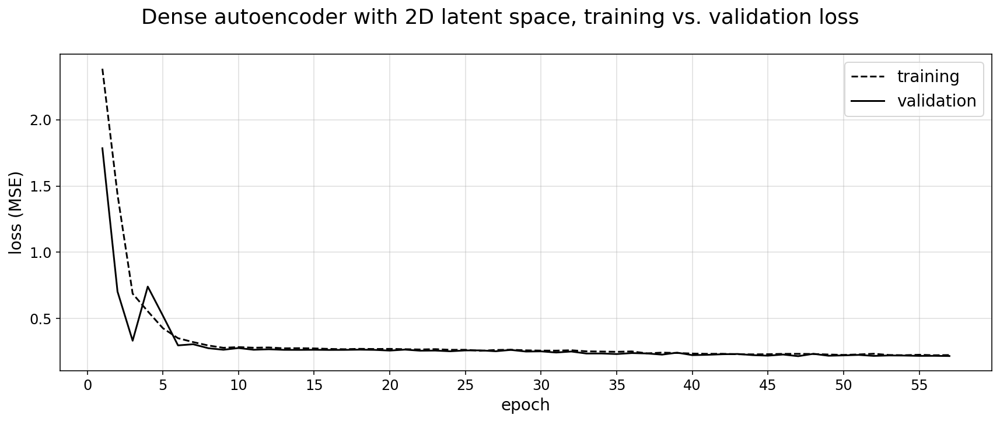


The network trained for 57 epochs achieving a minimum training loss of 0.223 and validation loss of 0.216


In [27]:
# plot autoencoder training history and summarize training metrics
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '34-bert-ae-history-lineplot.jpg', save_images
)
caproj.autoencoder.plot_history(
    ae2_history_dict,
    'Dense autoencoder with 2D latent space, training vs. validation loss',
    savepath=savepath
)
print(
    '\nThe network trained for {} epochs achieving a minimum training '\
    'loss of {:.3} and validation loss of {:.3}'.format(
        n_epochs, min_loss, min_val_loss
    )
)

**HOW THE MODEL WAS TRAINED:**

The resulting autoencoder model was trained for a maximum of 200 epochs, but with an early-stopping callback that monitored validation loss for a minimum change of at least a 0.0001 improvement to MSE within every 10 epochs (i.e. `min_delta=0.0001` and `patience=10`). The callback also specified that the "best weights" be restored at the end of training. Therefore, because the early stopping parameters were triggered, the network only trained for 57 epochs, with the best training loss of $MSE=0.223$ and best validation loss of $MSE=0.216$. 

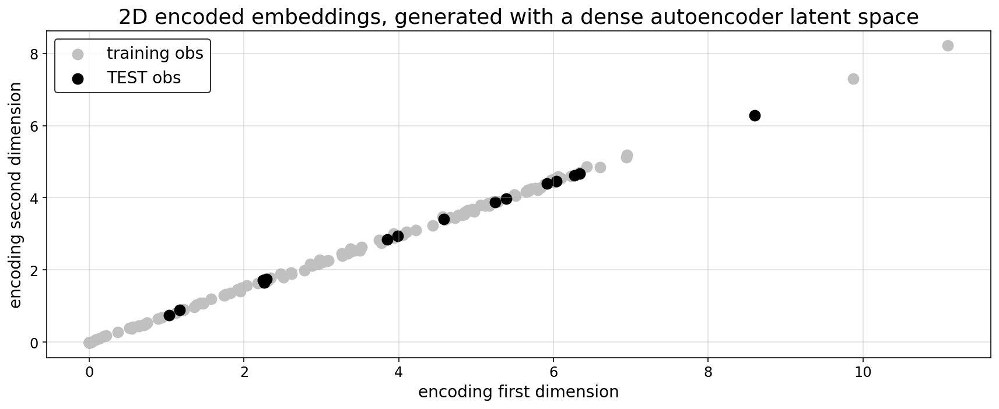

In [28]:
title = '2D encoded embeddings, generated with a dense autoencoder latent space'
xlabel = 'encoding first dimension'
ylabel = 'encoding second dimension'

ae_cols = ['ae_descr_embed_1', 'ae_descr_embed_2']

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '35-bert-ae-scatter.jpg', save_images
)
caproj.visualize.plot_2d_embed_scatter(
    data_train[ae_cols],
    data_test[ae_cols],
    title, xlabel, ylabel,
    point_size=80,
    savepath=savepath
)

**RESULTS:**

As can be seen above, after passing our training and test data into the Encoder portion of our autoencoder, the 2-dimensional encoded output indicates the dimensions of our encoded latent space are highly correlated. This is an interesting result. As I mentioned previously, we limited the dropout rate of the dropout layers in our autoencoder to a proportion lower than we might have otherwise chosen. This was primarily due to the increasingly correlated results we began to see as we continued to increase the dropout rate. Without dropout our latent space still exihibited some degree of correlation, albeit with the training and test observations far less tightly clusted along the diagonal axis. While we are not entirely certain of what to make of this counterintuitive result, we ultimately decided to walk a middle road where we kept our dropout rate lower than we might otherwise had, but still high enough that we felt we were sufficiently protecting against complete memorization of our training set.

The ultimate measure for us of how successful this attempt at dimensionality reduction is, comes later when we eventual fit these resulting 2 features as predictors in our prediction models and determine whether or not they increase the predictive strength of our model.

### 3.3.3. UMAP dimension-reduced encoding of BERT embedded text

[Return to section index](#3.3-Encoding-the-BERT-embedding-with-PCA,-Autoencoders,-and-UMAP)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/05_umap_hdbscan_features.ipynb)**

Now, as one final competing attempt at reducing the dimensions of our 512-dimension BERT embeddings to just 2 dimensions for our models, we will once again apply the UMAP algorithm previously used in conjunction with HDBSCAN for algorithmically identifying project reference classes. This time however, instead of categorizing our resulting UMAP encoded space, we will instead just directly use that 2-dimensional space as our dimensionality-reduced BERT emeddings similar to what we did with PCA and the dense autoencoder network above.

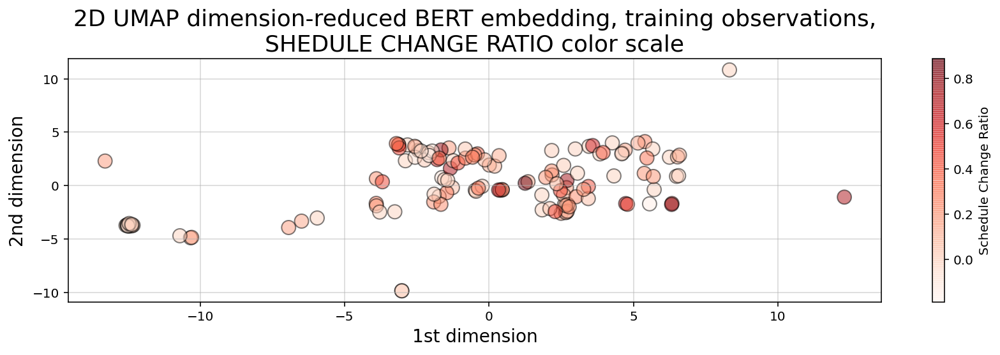

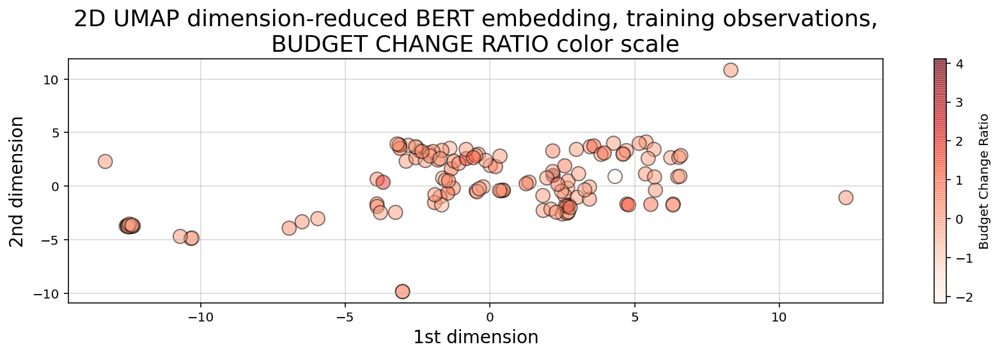

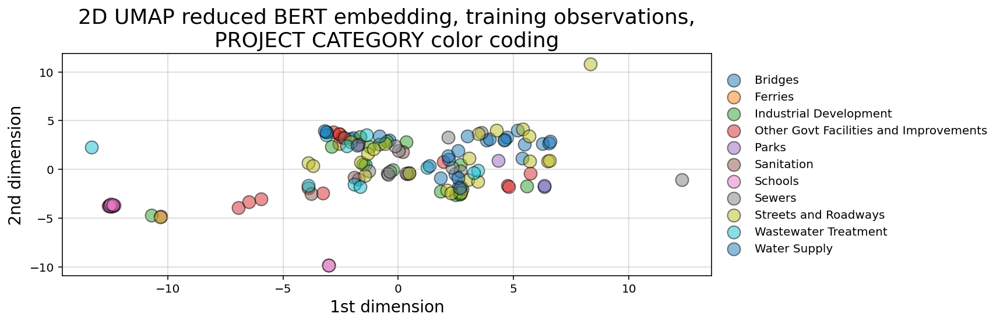

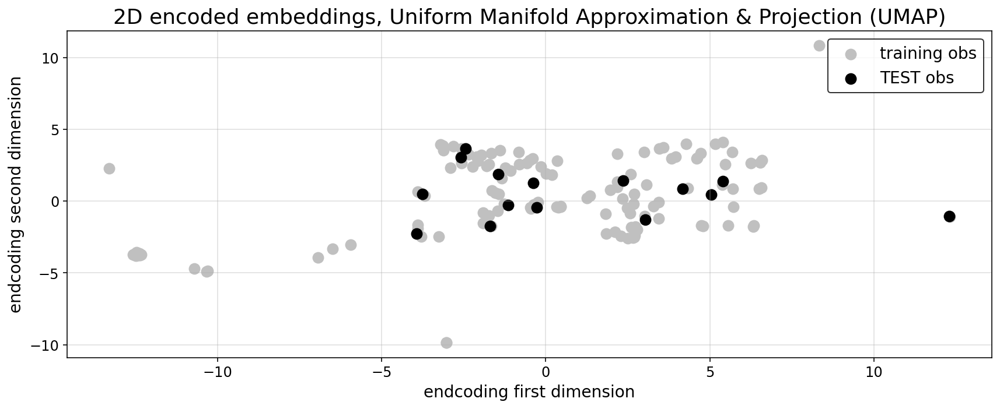

In [29]:
# here we once again use the cutom UMAP_trainsformer class
# initialized up in section 3.1.2 to illustrate the results of our
# UMAP dimension reduced BERT embeddings
UMAP_description_all_projects = UMAP_transformer.get_mapping_description(
    bert_embedding, dimensions=["2D"]
).drop(columns="description_embedding_original")

# visualize UMAP 2D space simular to the 3.1.2.
x_col = 'umap_descr_2D_embed_1'
y_col = 'umap_descr_2D_embed_2'

scale_var = "Schedule_Change_Ratio"
color = np.log(data_train[scale_var][filter_cond] + 1)
colormap = 'Reds'

title = '2D UMAP dimension-reduced BERT embedding, training observations,\n'\
        'SHEDULE CHANGE RATIO color scale'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '36-bert-umap-schedule-scale-scatter.jpg', save_images
)
caproj.cluster.plot_umap_scatter(
    data_train[filter_cond][x_col],
    data_train[filter_cond][y_col],
    color,
    title,
    scale_var,
    savepath=savepath,
)

scale_var = "Budget_Change_Ratio"
color = np.log(data_train["Budget_Change_Ratio"][filter_cond] + 1)

title = '2D UMAP dimension-reduced BERT embedding, training observations,\n'\
        'BUDGET CHANGE RATIO color scale'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '37-bert-umap-budget-scale-scatter.jpg', save_images
)
caproj.cluster.plot_umap_scatter(
    data_train[filter_cond][x_col],
    data_train[filter_cond][y_col],
    color,
    title,
    scale_var,
    savepath=savepath,
)


cat_col = "Category"

title = '2D UMAP reduced BERT embedding, training observations,\n'\
        'PROJECT CATEGORY color coding'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '38-bert-umap-category-color-scatter.jpg', save_images
)
caproj.cluster.plot_category_scatter(
    data_train, x_col, y_col, cat_col, title, savepath=savepath
)

title = '2D encoded embeddings, Uniform Manifold Approximation & Projection (UMAP)'
xlabel = 'endcoding first dimension'
ylabel = 'endcoding second dimension'

umap_emb_cols = ['umap_descr_2D_embed_1', 'umap_descr_2D_embed_2']

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '39-bert-umap-scatter.jpg', save_images
)
caproj.visualize.plot_2d_embed_scatter(
    data_train[umap_emb_cols],
    data_test[umap_emb_cols],
    title, xlabel, ylabel,
    point_size=80,
    savepath=savepath,
)

**FINDINGS:**

As a common point of comparison with our prior UMAP plots, we once again see a heavy mixing of project `Category`, as well as `Budget_Change_Ratio` and `Schedule_Change_Ratio` in our 2-dimensional UMAP encode space. And, ultimately, generating a train and test scatterplot similar to the ones we did for our 2D PCA and autoencoder encoded dimensions, we can see yet again another very different low-dimensionality representation of our 512 dimension BERT embeddings.

As mentioned before, whether or not these 2 dimensions help in the predictive power of our resulting prediction models will be the true test of whether or not this engineered feature was a success.

# 4. Linear models 

[Return to top](#Notebook-contents)

**IN THIS SECTION:**

**[4.1. Baseline linear regression](#4.1.-Baseline-linear-regression)**

**[4.2. Smoothing spline generalized additive models (GAMs)](#4.2.-Smoothing-spline-generalized-additive-models-(GAMs))**

- [4.2.1. Smoothing spline GAMs with baseline predictors](#4.2.1.-Smoothing-spline-GAMs-with-baseline-predictors)

- [4.2.2. Smoothing spline GAMs with engineered features](#4.2.2.-Smoothing-spline-GAMs-with-engineered-features)

In this section, prior to attempting to fit any complex models utilizing our newly engineered features, we first set a simple baseline against which we can compare all subsequent models. This will allow us to intelligently build complexity into our models, and it will allow us to hopefully develop a deeper sense of the predictive modelling problem we are trying to solve.

**For this Baseline model, we will utilize simple linear regression, using only the original features present in our initial dataset (prior to feature engineering).**

But, before getting started with our model, we need to first pre-process our data by subsetting the `X` and `y` variables in our training and test datasets, and then we perform some initial scaling to address the skewness of our quantitative predictors `Budget_Start` and `Duration_Start`. 

In [30]:
# Subset and scale data for X and y frames for all future models
# NOTE: only Budget_Start, Duration_Start, and Category features
#       will be used in our baseline model
X_cols = [
    'Budget_Start',
    'Duration_Start',
    'Bridges',
    'Ferries',
    'Industrial_Development',
    'Parks',
    'Sanitation',
    'Schools',
    'Sewers',
    'Streets_and_Roadways',
    'Wastewater_Treatment',
    'Water_Supply',
    'Category_Code',
    'umap_descr_2D_embed_1',
    'umap_descr_2D_embed_2',
    'umap_attributes_2D_embed_1',
    'umap_attributes_2D_embed_2',
    'attribute_clustering_label',
    'ae_descr_embed_1',
    'ae_descr_embed_2',
    'pca_descr_embed_1',
    'pca_descr_embed_2',
    'attribute_km3_label'
]

y_cols = [
    'Budget_Change_Ratio',
    'Schedule_Change_Ratio'
]

X_train, y_train = data_train[X_cols], data_train[y_cols]
X_test, y_test = data_test[X_cols], data_test[y_cols]

In [31]:
print('{}\t{}'.format(X_train.shape, X_test.shape))
print('{}\t{}'.format(y_train.shape, y_test.shape))

(134, 23)	(15, 23)
(134, 2)	(15, 2)


**For the reader's reference,** the following output illustrates the entire feature-space available to us in all of the modelling methods explored in the remainder of this report. This output includes our available predictors in the initial list of features, and our two response variables in the second printed list.

In [32]:
X_train.info()
print()
y_train.info()
X_train.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Budget_Start                134 non-null    float64
 1   Duration_Start              134 non-null    int64  
 2   Bridges                     134 non-null    int64  
 3   Ferries                     134 non-null    int64  
 4   Industrial_Development      134 non-null    int64  
 5   Parks                       134 non-null    int64  
 6   Sanitation                  134 non-null    int64  
 7   Schools                     134 non-null    int64  
 8   Sewers                      134 non-null    int64  
 9   Streets_and_Roadways        134 non-null    int64  
 10  Wastewater_Treatment        134 non-null    int64  
 11  Water_Supply                134 non-null    int64  
 12  Category_Code               134 non-null    int64  
 13  umap_descr_2D_embed_1       134 non

,Budget_Start,Duration_Start,Bridges,Ferries,Industrial_Development,Parks,Sanitation,Schools,Sewers,Streets_and_Roadways,...,umap_descr_2D_embed_1,umap_descr_2D_embed_2,umap_attributes_2D_embed_1,umap_attributes_2D_embed_2,attribute_clustering_label,ae_descr_embed_1,ae_descr_embed_2,pca_descr_embed_1,pca_descr_embed_2,attribute_km3_label
count,134.00,134.00,134.00,134.00,134.00,134.00,134.00,134.00,134.00,134.00,...,134.00,134.00,134.00,134.00,134.00,134.00,134.00,134.00,134.00,134.00
mean,"103,617,509.14","1,943.45",0.12,0.01,0.12,0.02,0.04,0.11,0.13,0.18,...,-0.66,0.19,10.00,9.85,3.08,2.99,2.22,0.00,-0.00,0.63
std,"213,833,628.68",636.18,0.33,0.12,0.33,0.15,0.19,0.32,0.33,0.38,...,5.47,2.98,6.08,4.75,1.89,2.31,1.72,5.44,3.62,0.63
min,"813,000.00",663.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,-13.29,-9.86,-2.88,-2.13,-1.00,0.00,-0.01,-11.32,-6.85,0.00
25%,"32,020,250.00","1,502.25",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,-2.76,-1.80,6.95,8.97,2.00,0.78,0.57,-3.13,-2.94,0.00
50%,"46,525,815.50","1,890.00",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,-0.30,0.29,11.77,10.89,3.00,2.87,2.14,1.11,-0.12,1.00
75%,"77,134,000.00","2,247.75",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,2.94,2.68,16.02,12.09,5.00,4.88,3.61,4.16,2.66,1.00
max,"1,910,339,114.55","4,360.00",1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,12.30,10.83,17.74,15.59,5.00,11.10,8.21,12.96,8.55,2.00


Next, now that we have subsetted all available `X` and `y` variables into separate train and test dataframes, we need to perform scaling on our quantitative predictors.

In [33]:
#######################################
# CREATE SCALED QUANTITATIVE PREDICTORS
#######################################

# Identify binary variable columns to exclude from scaling
exclude_scale_cols = list(X_train)[2:]


# Standardize both X_train and X_test data, fitting X_train as the
# scaler for both
scaler = StandardScaler
scale_before_func = None
scale_after_func = None
reapply_scaler = False


X_train_std, Scaler_std = caproj.scale.scale_features(
    X_train, X_train,
    exclude_scale_cols,
    scaler,
    scale_before_func,
    scale_after_func,
    reapply_scaler,
)

X_test_std, _ = caproj.scale.scale_features(
    X_train, X_test,
    exclude_scale_cols,
    scaler,
    scale_before_func,
    scale_after_func,
    reapply_scaler,
)


# Standardize X_train and X_test, pass through sigmoid transformation
# and re-standardize to minimize skew of data
scaler = StandardScaler
scale_before_func = None
scale_after_func = caproj.scale.sigmoid
reapply_scaler = True


X_train_std_sig, Scaler_std_sig = caproj.scale.scale_features(
    X_train, X_train,
    exclude_scale_cols,
    scaler,
    scale_before_func,
    scale_after_func,
    reapply_scaler,
)

X_test_std_sig, _ = caproj.scale.scale_features(
    X_train, X_test,
    exclude_scale_cols,
    scaler,
    scale_before_func,
    scale_after_func,
    reapply_scaler,
)

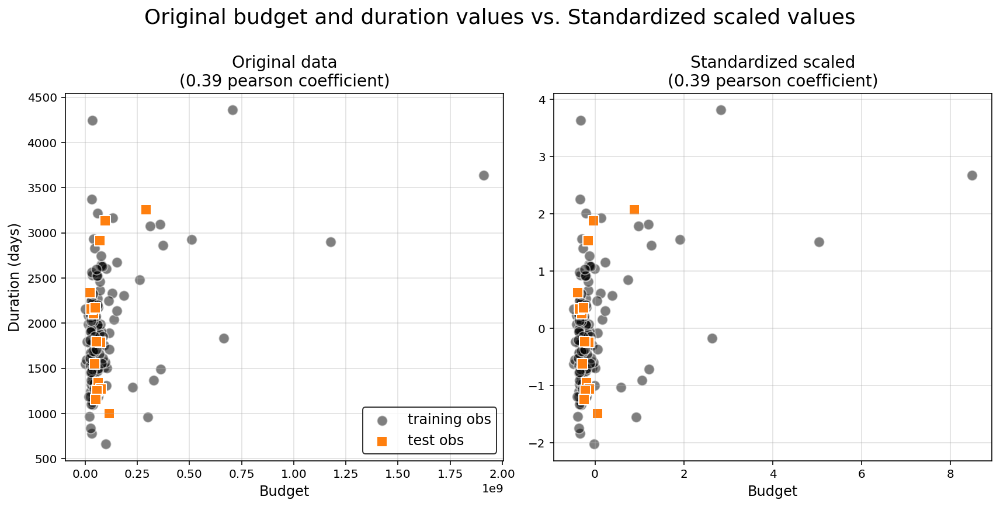

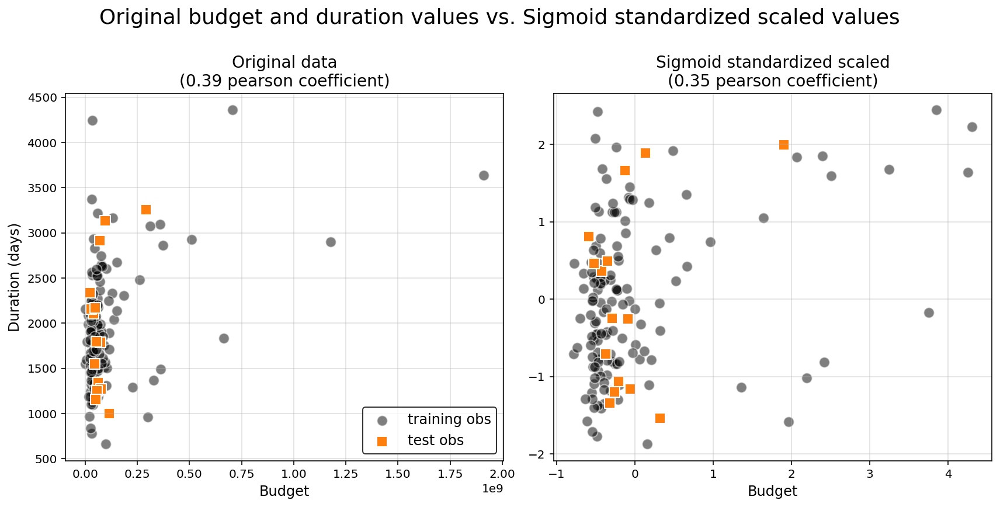

In [34]:
# inspect scaled datasets
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '40-scaled-std-all-scatter.jpg', save_images
)
caproj.visualize.plot_bdgt_sched_scaled(
    X_train, X_train_std,
    'Standardized',
    X_test, X_test_std,
    savepath=savepath,
)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '41-scaled-std-sig-all-scatter.jpg', save_images
)
caproj.visualize.plot_bdgt_sched_scaled(
    X_train, X_train_std_sig,
    'Sigmoid standardized',
    X_test, X_test_std_sig,
    savepath=savepath,
)

**FINDINGS**:

By visualizing our `Budget_Start` and `Duration_Start` predictors above, we can see a large skew with clear outliers in the original unscaled data. By applying standardization to the these predictors, as we have illustrated in the upper righthand plot, we have set both variables to the same scale. However, standardizing has not alleviated the skewness of our data or helped with our outlying datapoints. 

Therefore, we have also applied a sigmoid transformation to the data and re-standardized, as is shown in the lower righthand plot. This sigmoid transformation has helped to alleviate the skew of our data, and it has also helped to more evenly distrubute all of our data points, drawing outliers far closer to the center of the distribution.

**Scaling method used for the linear models in this report**

Although we built our first sets of baseline models in our unabridge notebook from which this code was taken using first standard-scaled data and then eventually data scaled using the 3-step scheme described above (1.standardized, 2. sigmoid transform, then 3. re-standardize), for the sake of brevity, we will only illustrate results from the 3-step scaled data here in our baseline model results.

**Now we will fit a "Baseline" linear regression model on our scaled datasets using the predictors `Budget_Start`, `Schedule_Start`, and one-hot-encoded `Category` values to set a baseline $R^2$ for evaluating future models.**

## 4.1. Baseline linear regression

[Return to section index](#4.-Linear-models)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/07_baseline_linear_models.ipynb)**

In [35]:
features = list(X_train)[:-10]

print(
    '\nThis "BASELINE" model uses the following '\
    'predictors:'\
    '\n\n\t{}\n\n'.format(features)
)


sm_formulas = [
    ' + '.join(features),
    ' + '.join(features)
]

model_descr = 'Baseline linear regression, sigmoid standarized data'

model_LR3 = caproj.model.generate_model_dict(
    sm.ols,
    model_descr,
    X_train_std_sig[features], X_test_std_sig[features],
    y_train, y_test,
    multioutput=True,
    verbose=False,
    predictions=True,
    scores=True,
    model_api='statsmodels',
    sm_formulas=sm_formulas,
)


caproj.model.print_model_results(model_LR3)


This "BASELINE" model uses the following predictors:

	['Budget_Start', 'Duration_Start', 'Bridges', 'Ferries', 'Industrial_Development', 'Parks', 'Sanitation', 'Schools', 'Sewers', 'Streets_and_Roadways', 'Wastewater_Treatment', 'Water_Supply', 'Category_Code']



MODEL SUMMARY:
Baseline linear regression, sigmoid standarized data


The fitted model object(s):




The formula for each fitted model object:

	Budget_Change_Ratio ~ Budget_Start + Duration_Start + Bridges + Ferries + Industrial_Development + Parks + Sanitation + Schools + Sewers + Streets_and_Roadways + Wastewater_Treatment + Water_Supply + Category_Code

	Schedule_Change_Ratio ~ Budget_Start + Duration_Start + Bridges + Ferries + Industrial_Development + Parks + Sanitation + Schools + Sewers + Streets_and_Roadways + Wastewater_Treatment + Water_Supply + Category_Code


This model resulted in the following R-squared scores:

	Budget_Change_Ratio

		Training	0.0686
		Test		-2.5340

	Schedule_Change_Ratio

		Training	0.452

**FINDINGS:**

Based on these initial results above `Budget_Change_Ratio` may prove more difficult to predict than `Schedule_Change_Ratio`, wherein our predictions for `Budget_Change_Ratio` perform less well than a naive model as is indicated by the negative $R^2$ score for the test data.

While our test $R^2$ score for `Schedule_Change_Ratio` is much better than budget, it is still something we are going to seek to improve on in more complex models.

These results indicates to us that we will likely have more difficulty in predicting `Budget_Change_Ratio` in our future models and that a Linear Regression model likely lacks the expressiveness required to adequately fit a model to the underlying relationship between predictors and outcome variable.

As on last step before moving on from Linear Regression, we will quickly inspect the predictions made by our **Baseline** model, as well as the regression coefficients.


## Visualize Baseline Model predictions and coefficients

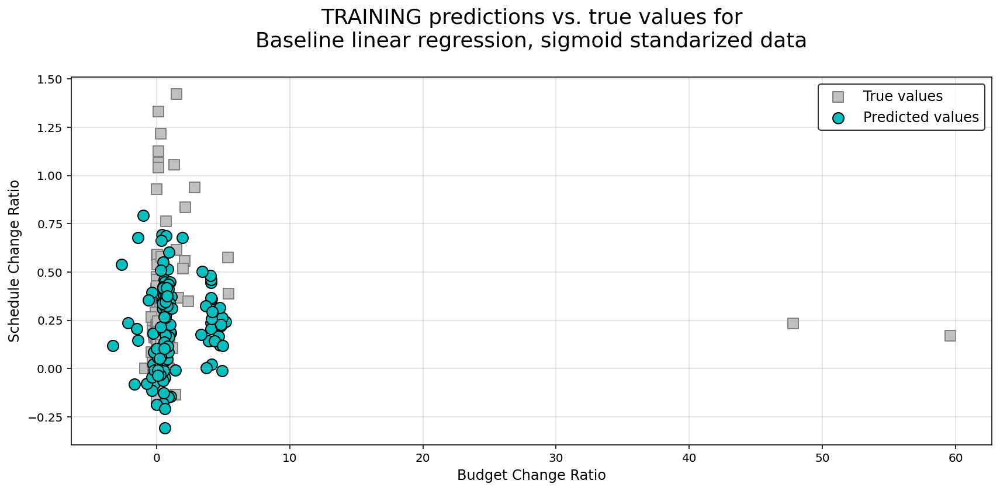

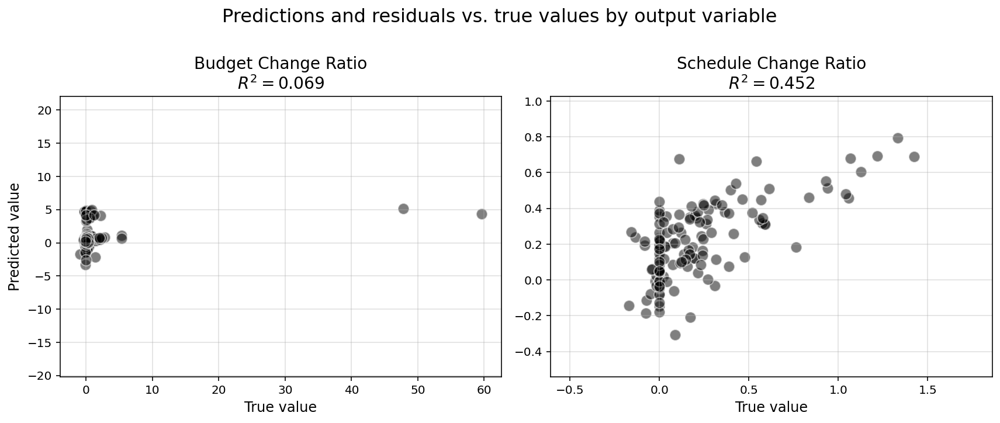

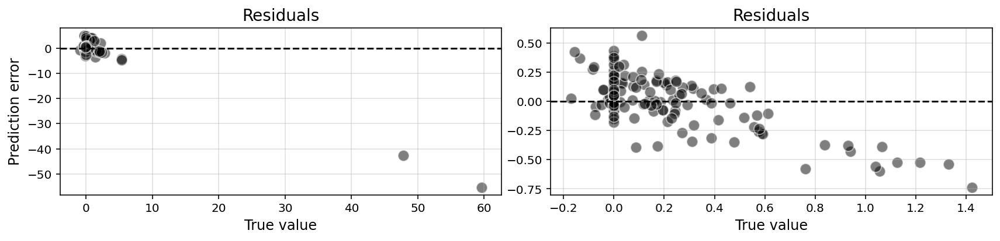

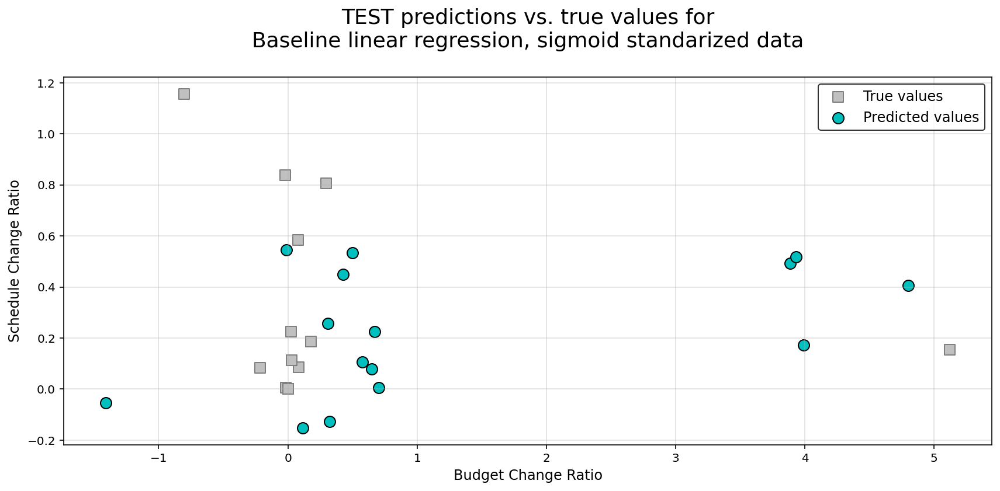

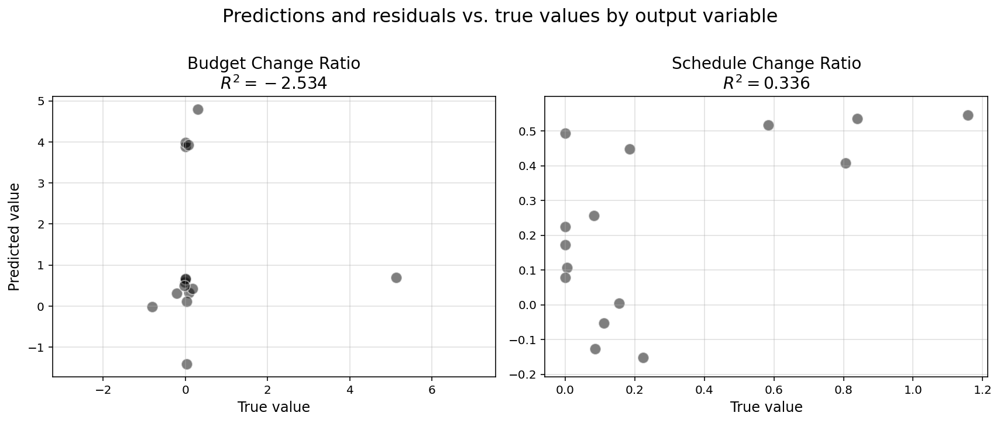

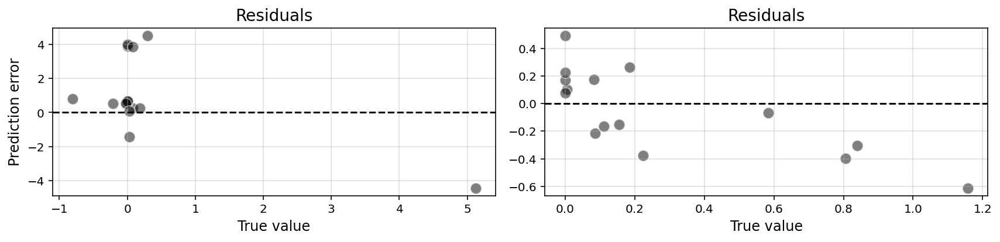

In [36]:
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '42-pred-linear-base-train.jpg', save_images
)
caproj.visualize.plot_true_pred(
    model_dict=model_LR3, dataset='train', savepath=savepath
)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '43-pred-linear-base-test.jpg', save_images
)
caproj.visualize.plot_true_pred(
    model_dict=model_LR3, dataset='test', savepath=savepath
)

**RESULTS:**

As can be seen in the scatterplots above, if we look at the first set of subplots showing true training values for `Budget_Change_Ratio` and `Schedule_Change_Ratio` versus our training predictions, we can see a model that clusters predictions very close together and mildly deviates rightward toward the extreme `Budget_Change_Ratio` outliers. What's more we can see fundamental linear regression model assumptions being violated, particularly that our residuals are not uniformly distributed and that there is heteroscedasticity present in our data, as evidenced by the residual plots for each response variable.

Then, if we look at the second set of subplots, which illustrate the same results, but for the true versus predicted TEST data, we can see the same issues arising, as well as a larger than appropriate grouping of predictions being pulled rightward by the skewed values in our training set, against which this linear model was fitted.

As a last step in evaluating this baseline model, let's take a look at our resulting model coefficients.

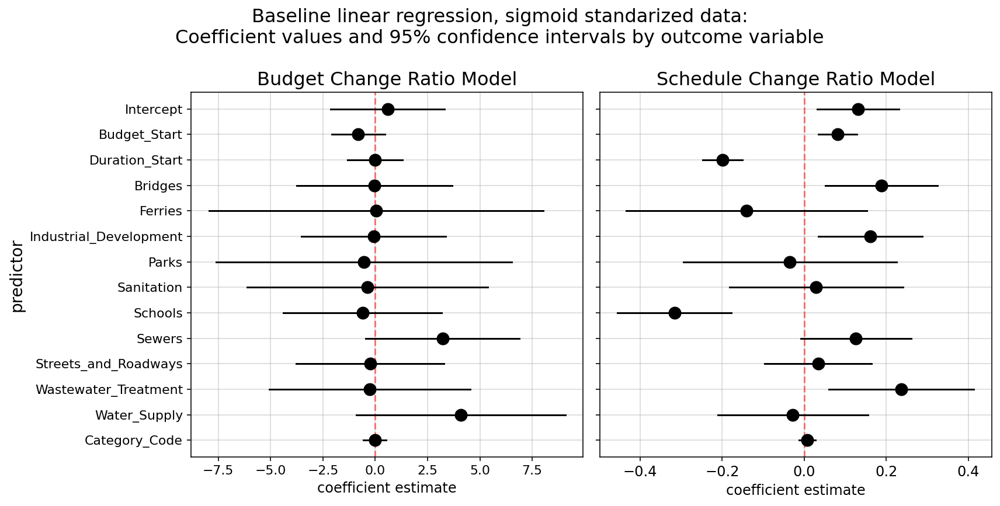

In [37]:
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '44-pred-linear-base-coefficients.jpg', save_images
)
caproj.visualize.plot_coefficients(
    model_LR3, fig_height=6, suptitle_spacing=1, savepath=savepath
)

**RESULTS:**

Lastly, by inspecting our model coefficients, we can finish our analysis of the baseline linear model. By looking at the `Budget_Change_Ratio` coefficient estimates and $95\%$ confidence intervals for each of those estimates, we can see that the model does not identify one single significant coefficient, as is evidenced by the confidence bounds all overlapping the value $0$. Considering that the test $R^2$ score for that model was $-2.53$, these coefficients are not surprising. If anything, they help to illustrate just how much difficulty our model had in identify linear relationships between our predictors and `Budget_Change_Ratio` response variable.

Our `Schedule_Change_Ratio` model on the otherhand provides confidence intervals to indicate clearly significant coefficients in that model. Base on those coefficients, it appears that significant relationships were found for the quantitative predictors `Budget_Start` (positive relationship), `Shedule_Start` (negative relationship), as well as relationships for the project categories `Bridges`, `Industrial_Development`, `Schools`, and `Wastewater_Treatment`.

Now that we have built and evaluated our baseline linear model, we will move on to a far more expressive class of generalized linear model, smoothing spline Generative Additive Models (GAMs), with the hope that this added expressiveness will improve the predictive accuracy of our models.

## 4.2. Smoothing spline generalized additive models (GAMs)

[Return to section index](#4.-Linear-models)

**IN THIS SECTION:**

**[4.2.1. Smoothing spline GAMs with baseline predictors](#4.2.1.-Smoothing-spline-GAMs-with-baseline-predictors)**

**[4.2.2. Smoothing spline GAMs with engineered features](#4.2.2.-Smoothing-spline-GAMs-with-engineered-features)**

## 4.2.1. Smoothing spline GAMs with baseline predictors

[Return to section index](#4.2.-Smoothing-spline-generalized-additive-models-(GAMs))

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/08_smoothing_spline_models.ipynb)**

As a first step toward developing our smoothing spline GAMs, we will train a model using the same baseline set of predictors we used in our baseline linear regression model in section 4.1. above.

**Using gridsearch to find optimal value $\lambda$ for each term in the smoothing spline GAM model**

- Here we treat each y output independently, partly because PyGam's Linear GAM will not fit a multi-output model, but mostly because each y output behaves differently and we have found that different $\lambda$ penalty values are required to optimize outputs for both of our response variables.

- In the coded cell below, we use PyGam's native `gridsearch` method to choose our values $\lambda$ for each term.
    - Because there are so few instances of some project categories, traditional cross-validation using k-splits creates split-instances where some categories are missing from our training splits
    - When that occurs, PyGam cannot fit a coefficient to that category and generates an error.

In [38]:
%%time

# re-import pygam import due to either objects s or f getting overwritten
from pygam import LinearGAM, s, f

# here we used linear encoding for our category types rather than
# one-hot-encoding because this is the appropriate approach to take
# when working with linear GAMs.
features = [
    'Budget_Start',
    'Duration_Start',
    'Category_Code',
]

terms = s(0) + s(1) + f(2)

# generate list of lambdas against which to perform gridsearch for
# each outcome variable and each of our 3 input predictors
lam_list = np.logspace(-3, 5, 10)
lams = [lam_list] * 3

# fit GAM to predict budget change ratio 
gam1 = LinearGAM(terms).fit(
    X_train_std_sig[features], y_train['Budget_Change_Ratio']
)
# perform gridsearch to find optimal lambdas for each term
gam1.gridsearch(
    X_train_std_sig[features], y_train['Budget_Change_Ratio'],
    lam=lams
)

# fit GAM to predict schedule change ratio
gam2 = LinearGAM(terms).fit(
    X_train_std_sig[features], y_train['Schedule_Change_Ratio']
)
# perform gridsearch to find optimal lambdas for each term
gam2.gridsearch(
    X_train_std_sig[features], y_train['Schedule_Change_Ratio'],
    lam=lams
)

100% (1000 of 1000) |####################| Elapsed Time: 0:00:49 Time:  0:00:49
100% (1000 of 1000) |####################| Elapsed Time: 0:00:45 Time:  0:00:45


CPU times: user 5min 6s, sys: 7min 15s, total: 12min 22s
Wall time: 1min 35s


LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, terms=s(0) + s(1) + f(2) + intercept, 
   tol=0.0001, verbose=False)

**Now we print our gridsearch results summaries for each model**

In [39]:
%%capture --no-stdout

print(
    '\nGAM gridsearch results for BUDGET_CHANGE_RATIO prediction model:\n'
)
gam1.summary()

print(
    '\n\n\nGAM gridsearch results for SCHEDULE_CHANGE_RATIO prediction model:\n'
)
gam2.summary()


GAM gridsearch results for BUDGET_CHANGE_RATIO prediction model:

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     18.7569
Link Function:                     IdentityLink Log Likelihood:                                  -419.7587
Number of Samples:                          134 AIC:                                              879.0312
                                                AICc:                                             886.2739
                                                GCV:                                               11.5842
                                                Scale:                                              8.7077
                                                Pseudo R-Squared:            

**RESULTS:**

In the output summaries above, we can see that `PyGam`'s native gridsearch has identified significantly different optimat penalty values $\lambda$ for each term with within each model. What's more, those optimal values $\lambda$ also vary greatly among terms between each model, whether it's fit to predict `Budget_Change_Ratio` or `Schedule_Change_Ratio`.

Now we will use those optimal $\lambda$ values to fit our final GAM models using just our baseline predictors.

In [40]:
print(
    '\nThese smoothing spline GAMs have been fit using the optimal lambda penalties '\
    'for each term, one set of results show models optimized for BUDGET_CHANGE_RATIO '\
    'predictions, the other for SCHEDULE_CHANGE_RATIO predictions.\n\n'\
    'The predictors used are:\n\n\t{}\n\n'.format(features)
)


model_descr = 'Smoothing spline GAM: sigmoid scaled, BUDGET_CHANGE_RATIO optimal penalties'

terms = s(0, lam=0.001) + s(1, lam=100000) + f(2, lam=215.4435)

model_GAM1 = caproj.model.generate_model_dict(
    LinearGAM,
    model_descr,
    X_train_std_sig[features], X_test_std_sig[features], y_train, y_test,
    multioutput=False,
    verbose=False,
    predictions=True,
    scores=True,
    model_api='sklearn',
    terms=terms,
)

caproj.model.print_model_results(model_GAM1)

model_descr = 'Smoothing spline GAM: sigmoid scaled, SCHEDULE_CHANGE_RATIO optimal penalties'

terms = s(0, lam=100000) + s(1, lam=27.8256) + f(2, lam=3.5938)

model_GAM2 = caproj.model.generate_model_dict(
    LinearGAM,
    model_descr,
    X_train_std_sig[features], X_test_std_sig[features], y_train, y_test,
    multioutput=False,
    verbose=False,
    predictions=True,
    scores=True,
    model_api='sklearn',
    terms=terms,
)

caproj.model.print_model_results(model_GAM2)


These smoothing spline GAMs have been fit using the optimal lambda penalties for each term, one set of results show models optimized for BUDGET_CHANGE_RATIO predictions, the other for SCHEDULE_CHANGE_RATIO predictions.

The predictors used are:

	['Budget_Start', 'Duration_Start', 'Category_Code']



MODEL SUMMARY:
Smoothing spline GAM: sigmoid scaled, BUDGET_CHANGE_RATIO optimal penalties


The fitted model object(s):

	LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, terms=s(0) + s(1) + f(2) + intercept, 
   tol=0.0001, verbose=False)

	LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, terms=s(0) + s(1) + f(2) + intercept, 
   tol=0.0001, verbose=False)


This model resulted in the following R-squared scores:

	Budget_Change_Ratio

		Training	0.8263
		Test		-0.8736

	Schedule_Change_Ratio

		Training	0.3532
		Test		0.0337




MODEL SUMMARY:
Smoothing spline GAM: sigmoid scaled, SCHEDULE_CHANGE_RAT

**FINDINGS:**

Here we can see that we stand to benefit from the added expressiveness of a smoothing spline class of linear model, as is illustrated by the improved $R^2$ results shown above. However, while our `Schedule_Change_Ratio` predictions have improved from $R^2=0.34$ to $R^2=0.54$, our `Budget_Change_Ratio` test $R^2$ score is still extremely negative. However, the smoothing spline GAM does appear to have fitted the training set with a `Budget_Change_Ratio` $R^2$ score of 0.54, which is somewhat promising. Now, if only we can improve on this to find a model that generalizes when applied to unseen data.

But, before we introduce any added complexity into this model, let's first look at our true versus predicted values as we did for our Baseline linear regression model at the end of section 4.1.

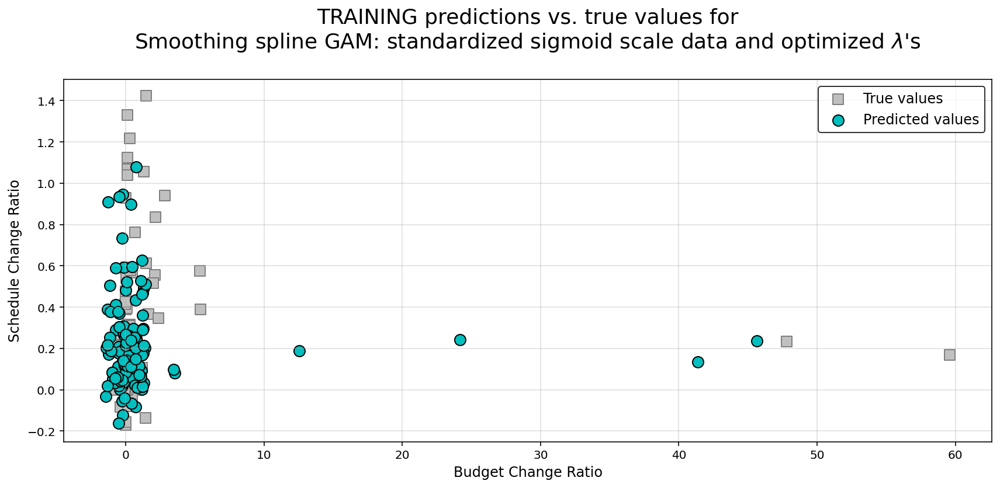

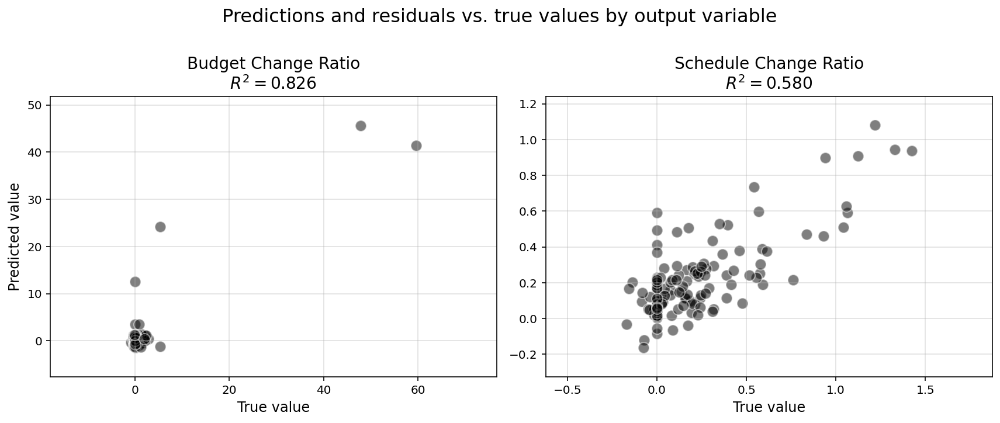

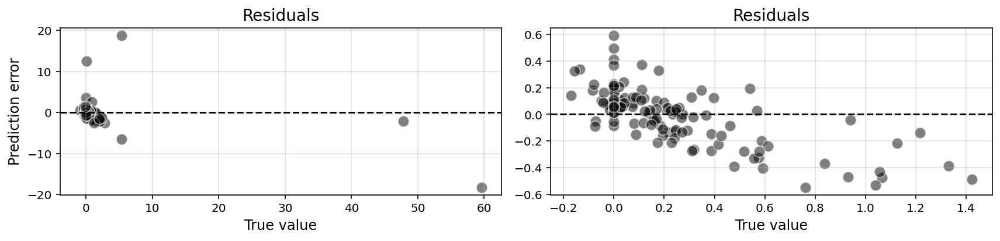

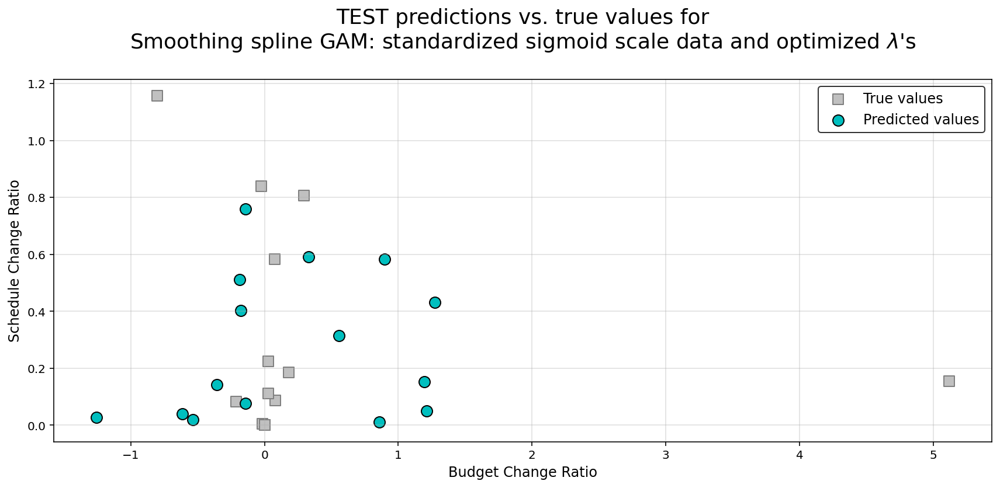

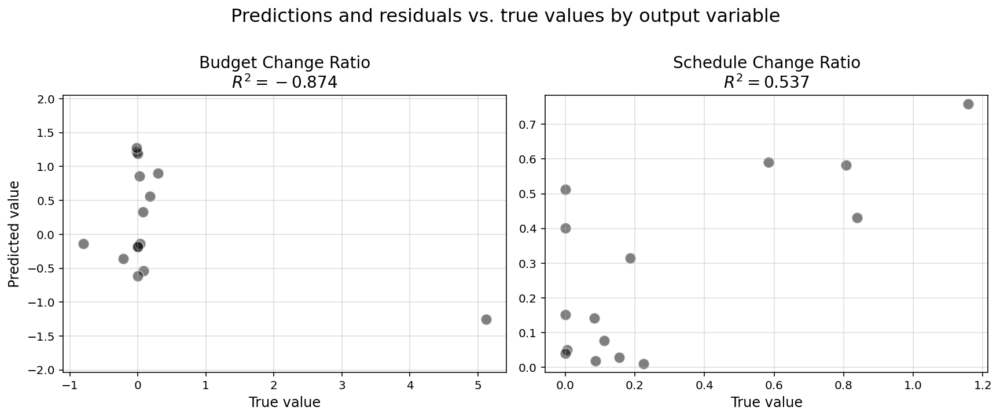

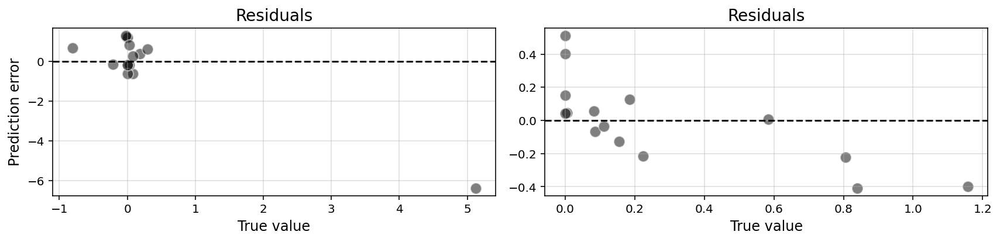

In [41]:
# combine budget and schedule train predictions from each
# respective optimized model
y_pred_train = np.hstack(
    [
        model_GAM1['predictions']['train'][:, 0].reshape(-1,1),
        model_GAM2['predictions']['train'][:, 1].reshape(-1,1)
    ]
)
# do the same for test predictions
y_pred_test = np.hstack(
    [
        model_GAM1['predictions']['test'][:, 0].reshape(-1,1),
        model_GAM2['predictions']['test'][:, 1].reshape(-1,1)
    ]
)

# plot those optimized predictions on the same axis
# to compare against true data
model_descr = "Smoothing spline GAM: standardized sigmoid "\
              "scale data and optimized $\lambda$'s"
y1_label = 'Budget Change Ratio'
y2_label = 'Schedule Change Ratio'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '45-pred-spline-base-train.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='train',
    y_true=y_train,
    y_pred=y_pred_train,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '46-pred-spline-base-test.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='test',
    y_true=y_test,
    y_pred=y_pred_test,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

**RESULTS:**

While we do see some mild imporvement in our residuals above, the most striking characteristic of these results when compared to the comparable plots for our Baseline linear regression model, is that the TEST predictions appear to be far more evenly distributed among the bulk of our true test values. This is a marked improvement and indicates that the predictive accuracy of this smoothing spline GAM is far less influenced by the extreme outliers in our dataset.

Now, as one final step, in lieu of having coefficient estimates like we had in our linear regression output, let's take a look at the "contribution" of each predictor to our overall GAM models using partial dependence and 95% confidence intervals.

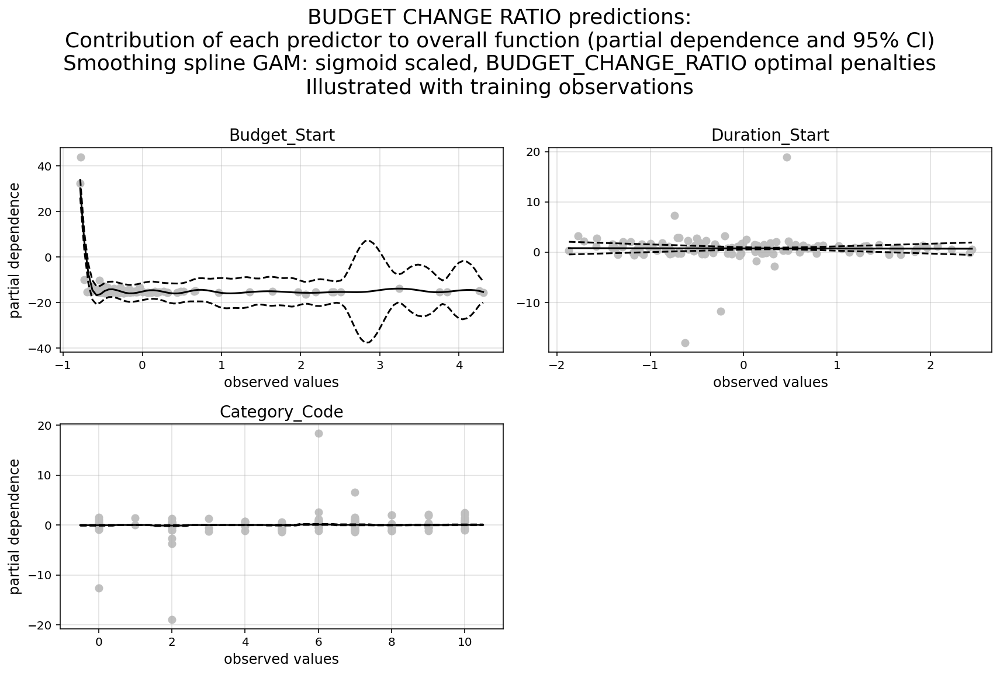

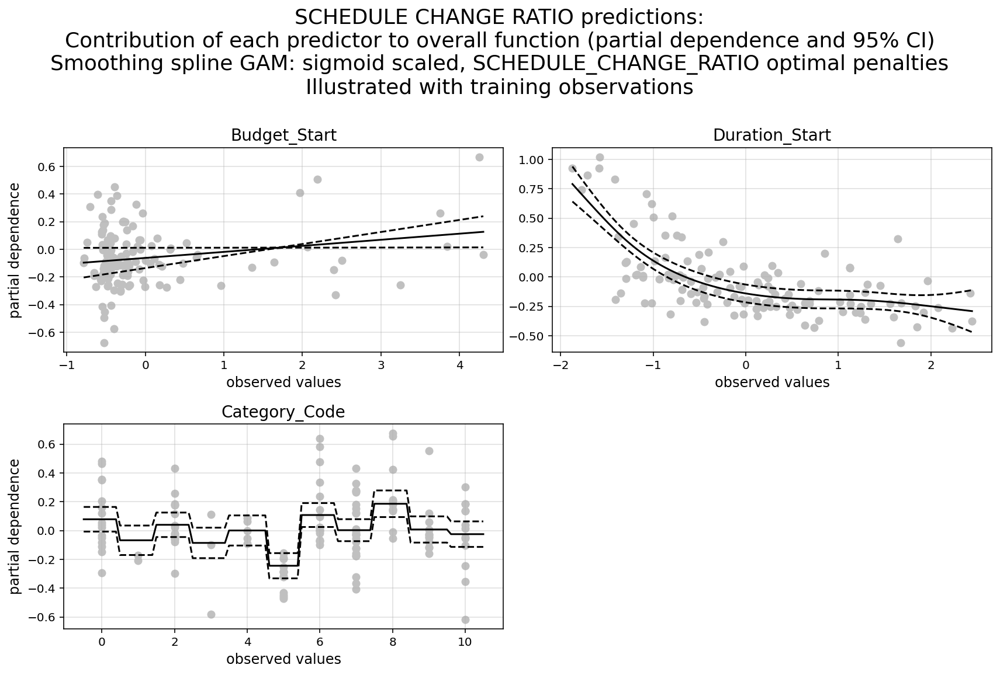

In [42]:
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '47-pred-spline-base-contrib-budget.jpg', save_images
)
caproj.visualize.plot_gam_by_predictor(
    model_dict=model_GAM1, model_index=0,
    X_data=X_train_std_sig[features], y_data=y_train,
    dataset='train',
    savepath=savepath,
)

print()

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '48-pred-spline-base-contrib-schedule.jpg', save_images
)
caproj.visualize.plot_gam_by_predictor(
    model_dict=model_GAM2, model_index=1,
    X_data=X_train_std_sig[features], y_data=y_train,
    dataset='train',
    savepath=savepath,
)

**RESULTS:**

As can be seen in the partial dependence plots above, again we see a model that doesn't appear to know what to do with our `Budget_Change_Ratio` response variable as is evidenced by the largely uniform horizontal relationships of each predictor variable in terms of their contribution to the overall model.

For `Schedule_Change_Ratio` on the otherhand, we can see far more significant contributions made to the model by each predictor. Not only is a positive linear relationship evidenced by the `Budget_Start` predictor, but `Duration_Start` appears to be negatively correlated in a curvalinear fashion, and several of the `Category` types appear to have a signigicant effect on our predictions as we might expect. 

## 4.2.2. Smoothing spline GAMs with engineered features

[Return to section index](#4.2.-Smoothing-spline-generalized-additive-models-(GAMs))

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/08_smoothing_spline_models.ipynb)**

Now that we have analyzed our results for the simplest comparable smoothing spline GAM we could have created, we move on to a slightly more complex version of the model wherein we search for the optimal combination of engineered features and combine those with our baseline predictors `Budget_Start` and `Schedule_Start`. 

What we show here is only the best performing predictor iterations we could identify for predicting both `Budget_Change_Ratio` and `Schedule_Change_Ratio` separately.

Ultimately, **for predicting `Budget_Change_Ratio` we use the predictors** `Budget_Start`, `Duration_Start`, and the engineered attribute encoding features `umap_attributes_2D_embed_1`, and `umap_attributes_2D_embed_2`.

As **for our model predicting `Schedule_Change_Ratio`, we use the predictors** `Budget_Start`, `Duration_Start`, the engineered reference class clusters identified using UMAP combined with HDBSCAN named `attribute_clustering_label`, as well as the PCA dimension-reduced encoding our project description text BERT embeddings `pca_descr_embed_1` and `pca_descr_embed_2`.

As we did in our previous GAM models, we perform `PyGam`'s native gridsearch to find the optimal $\lambda$'s for each term in each model.

**NOTE:** Gridsearch for these models is computationally intensive, therefore we recommend loading the pretrained `PyGam` models from disk for further evaluation. If you would like to review the notebook wherein these model objects were created, [please review the unabridged project notebook available on GitHub](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/08_smoothing_spline_models.ipynb).

In [43]:
%%time

savepath_gam1 = '../models/gam_budget_gridsearch_v2.pickle'
savepath_gam2 = '../models/gam_schedule_gridsearch_v2.pickle'

# NOTE: the gridsearch for these two models can take 40+ min to process

# It is recommended that the final resulting models be
# loaded from saved pickled versions of the models
load_saved = True
save_new = False


features1 = [
    'Budget_Start',
    'Duration_Start',
    'umap_attributes_2D_embed_1',
    'umap_attributes_2D_embed_2',
]

terms1 = s(0) + s(1) + s(2) + s(3)

features2 = [
    'Budget_Start',
    'Duration_Start',
    'attribute_clustering_label',
    'pca_descr_embed_1',
    'pca_descr_embed_2',
]

terms2 = s(0) + s(1) + f(2) + s(3) + s(4)


if load_saved:

    with open(filepath_gam1, 'rb') as f:
        gam1 = pickle.load(f)
    print('GAM1 fitted gridsearch model loaded from disk.')
    
    with open(filepath_gam2, 'rb') as f:
        gam2 = pickle.load(f)
    print('GAM2 fitted gridsearch model loaded from disk.')

else:
    
    # generate list of lambdas against which to perform gridsearch for
    # each of our input predictors for the budget model
    lam_list1 = np.logspace(-3, 5, 10)
    lams1 = [lam_list1] * 4
    
    # reduce size of gridsearch for schedule model because of added
    # computational cost caused by additional model term
    lam_list2 = np.logspace(-3, 5, 8)
    lams2 = [lam_list2] * 5

    # fit GAM to predict budget change ratio 
    gam1 = LinearGAM(terms1).fit(
        X_train_std_sig[features1], y_train['Budget_Change_Ratio']
    )
    # perform gridsearch to find optimal lambdas for each term
    gam1.gridsearch(
        X_train_std_sig[features1], y_train['Budget_Change_Ratio'],
        lam=lams1
    )
    
    if save_new:
        try:
            pickle.dump(gam1, open(savepath_gam1, 'wb'))
            print('GAM1 model saved to disk at {}'.format(savepath_gam1))
        except:
            print('GAM1 model did not save to disk. Check target directory.')

    # fit GAM to predict schedule change ratio
    gam2 = LinearGAM(terms2).fit(
        X_train_std_sig[features2], y_train['Schedule_Change_Ratio']
    )
    # perform gridsearch to find optimal lambdas for each term
    gam2.gridsearch(
        X_train_std_sig[features2], y_train['Schedule_Change_Ratio'],
        lam=lams2
    )
    
    if save_new:
        try:
            pickle.dump(gam2, open(savepath_gam2, 'wb'))
            print('GAM2 model saved to disk at {}'.format(savepath_gam2))
        except:
            print('GAM2 model did not save to disk. Check target directory.')


GAM1 fitted gridsearch model loaded from disk.
GAM2 fitted gridsearch model loaded from disk.
CPU times: user 5.21 ms, sys: 1.44 ms, total: 6.65 ms
Wall time: 4.96 ms


In [44]:
%%capture --no-stdout

print(
    '\nGAM gridsearch results for BUDGET_CHANGE_RATIO prediction model:\n'
)
gam1.summary()

print(
    '\n\n\nGAM gridsearch results for SCHEDULE_CHANGE_RATIO prediction model:\n'
)
gam2.summary()


GAM gridsearch results for BUDGET_CHANGE_RATIO prediction model:

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     20.3443
Link Function:                     IdentityLink Log Likelihood:                                  -421.6587
Number of Samples:                          134 AIC:                                              886.0061
                                                AICc:                                             894.5489
                                                GCV:                                               12.0984
                                                Scale:                                              8.8447
                                                Pseudo R-Squared:            

**RESULTS:**

Once again, we can see greatly varying optimal $\lambda$ dependent on model and term. We will use these values $\lambda$ now to train models for each of our response variables.

In [45]:
from pygam import LinearGAM, s, f

print(
    '\nThese smoothing spline GAMs have been fit using the optimal lambda penalties '\
    'this model was optimized for BUDGET_CHANGE_RATIO predictions.\n\n'\
    'The predictors used are:\n\n\t{}\n\n'.format(features1)
)


model_descr = 'FINAL smoothing spline GAM: sigmoid scaled, budget-optimized model'

terms1 = s(0, lam=0.001) + s(1, lam=100000) + s(2, lam=100000) + s(3, lam=100000)

model_GAM3 = caproj.model.generate_model_dict(
    LinearGAM,
    model_descr,
    X_train_std_sig[features1], X_test_std_sig[features1], y_train, y_test,
    multioutput=False,
    verbose=False,
    predictions=True,
    scores=True,
    model_api='sklearn',
    terms=terms1,
)

caproj.model.print_model_results(model_GAM3)


print(
    '\nThese smoothing spline GAMs have been fit using the optimal lambda penalties '\
    'this model was optimized for SCHEDULE_CHANGE_RATIO predictions.\n\n'\
    'The predictors used are:\n\n\t{}\n\n'.format(features2)
)


model_descr = 'FINAL smoothing spline GAM: sigmoid scaled, schedule-optimized model'

terms2 = s(0, lam=100000) + s(1, lam=37.2759) + f(2, lam=37.2759) + \
         s(3, lam=100000) + s(4, lam=517.9475)

model_GAM4 = caproj.model.generate_model_dict(
    LinearGAM,
    model_descr,
    X_train_std_sig[features2], X_test_std_sig[features2], y_train, y_test,
    multioutput=False,
    verbose=False,
    predictions=True,
    scores=True,
    model_api='sklearn',
    terms=terms2,
)

caproj.model.print_model_results(model_GAM4)


These smoothing spline GAMs have been fit using the optimal lambda penalties this model was optimized for BUDGET_CHANGE_RATIO predictions.

The predictors used are:

	['Budget_Start', 'Duration_Start', 'umap_attributes_2D_embed_1', 'umap_attributes_2D_embed_2']



MODEL SUMMARY:
FINAL smoothing spline GAM: sigmoid scaled, budget-optimized model


The fitted model object(s):

	LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + intercept, tol=0.0001, 
   verbose=False)

	LinearGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, 
   max_iter=100, scale=None, 
   terms=s(0) + s(1) + s(2) + s(3) + intercept, tol=0.0001, 
   verbose=False)


This model resulted in the following R-squared scores:

	Budget_Change_Ratio

		Training	0.8260
		Test		-1.0543

	Schedule_Change_Ratio

		Training	0.4439
		Test		0.3103




These smoothing spline GAMs have been fit using the optimal lambda penalties this model was opti

**RESULTS:**

As can be seen in the printed output above, the first model optimized for `Budget_Change_Ratio` predictions has appeared to overfit on the training data with a train $R^2$ score of $0.83$, but a test score of $-1.05$. The `Schedule_Change_Ratio` optimized model actually achieved a slightly improved (albeit still negative) `Budget_Change_Ratio` test score of $-0.73$, while the we were able to squeeze a bit more predictive accuracy out of our `Schedule_Change_Ratio` predictions ($0.55$ test $R^2$) by incorporating three of our engineered features.

Now, let's take a quick look at our true versus predicted values for each model.

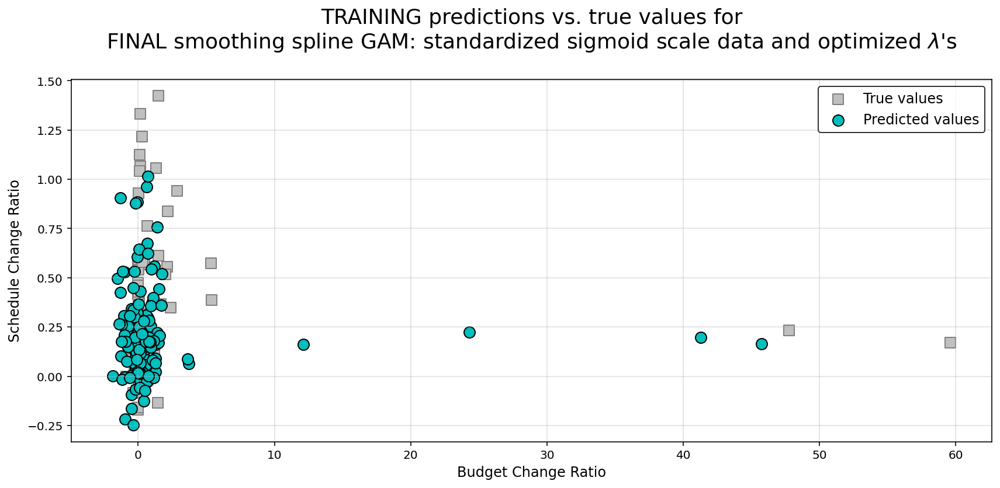

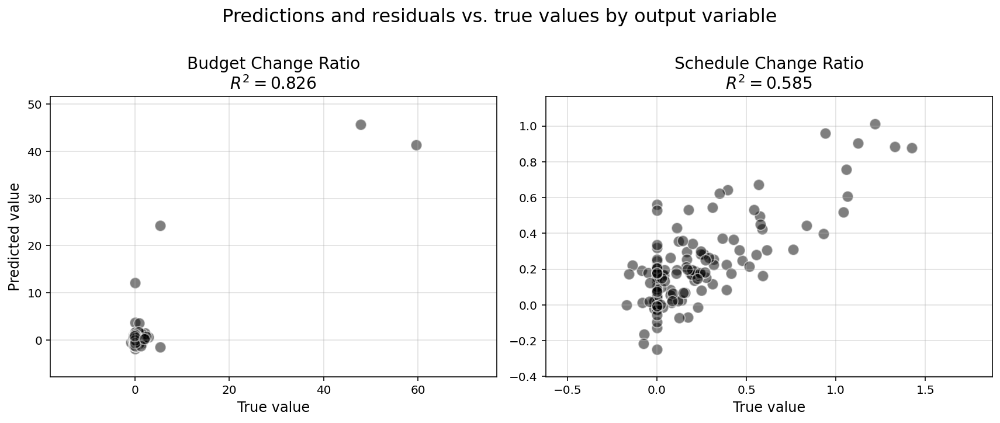

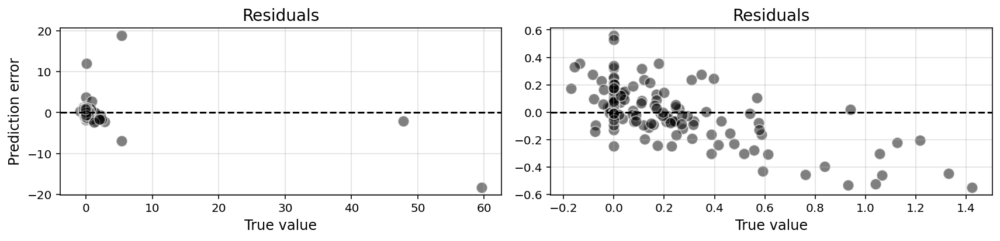

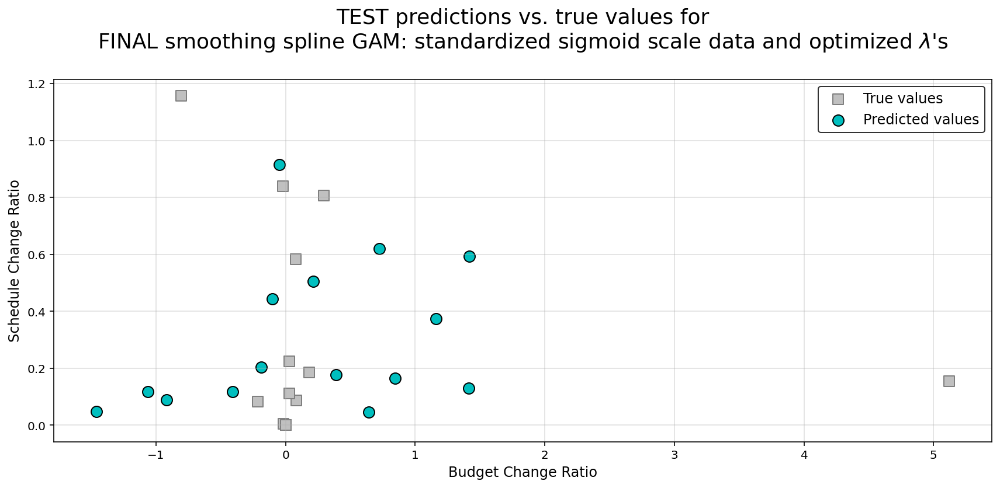

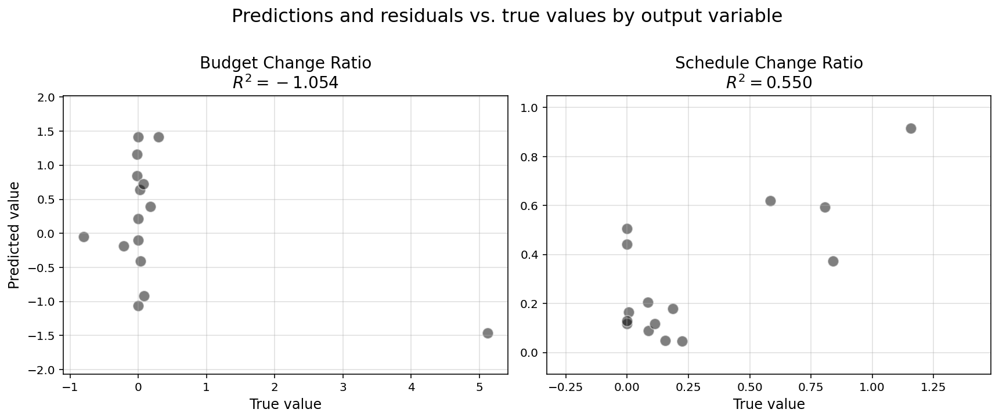

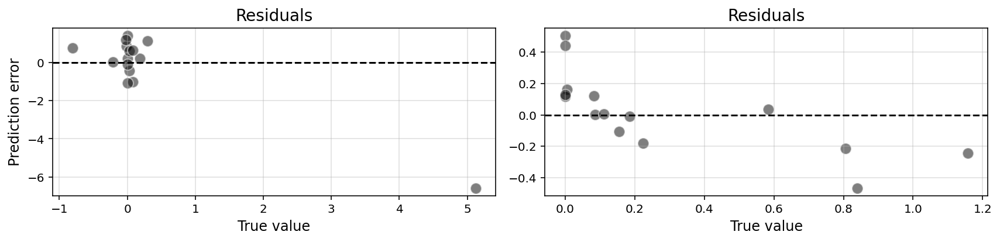

In [46]:
y_pred_train_extended = np.hstack(
    [
        model_GAM3['predictions']['train'][:, 0].reshape(-1,1),
        model_GAM4['predictions']['train'][:, 1].reshape(-1,1)
    ]
)

y_pred_test_extended = np.hstack(
    [
        model_GAM3['predictions']['test'][:, 0].reshape(-1,1),
        model_GAM4['predictions']['test'][:, 1].reshape(-1,1)
    ]
)

model_descr = "FINAL smoothing spline GAM: standardized sigmoid "\
              "scale data and optimized $\lambda$'s"
y1_label = 'Budget Change Ratio'
y2_label = 'Schedule Change Ratio'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '49-pred-spline-final-train.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='train',
    y_true=y_train,
    y_pred=y_pred_train_extended,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '50-pred-spline-final-test.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='test',
    y_true=y_test,
    y_pred=y_pred_test_extended,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

**RESULTS:**

As to be expected, the characteristics of the predictions do not vary much visually from our prior GAM, which used just our baseline predictors. I would not expect a $0.53$ to $0.55$ improvement in `Schedule_Change_Ratio` $R^2$ to provide much that we would notice visually.

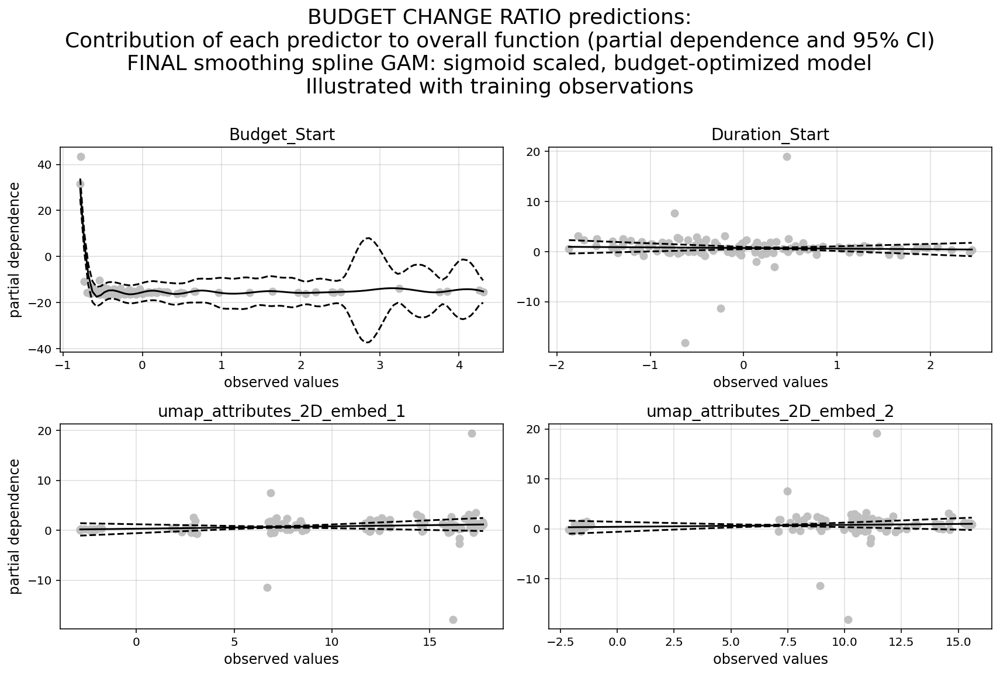

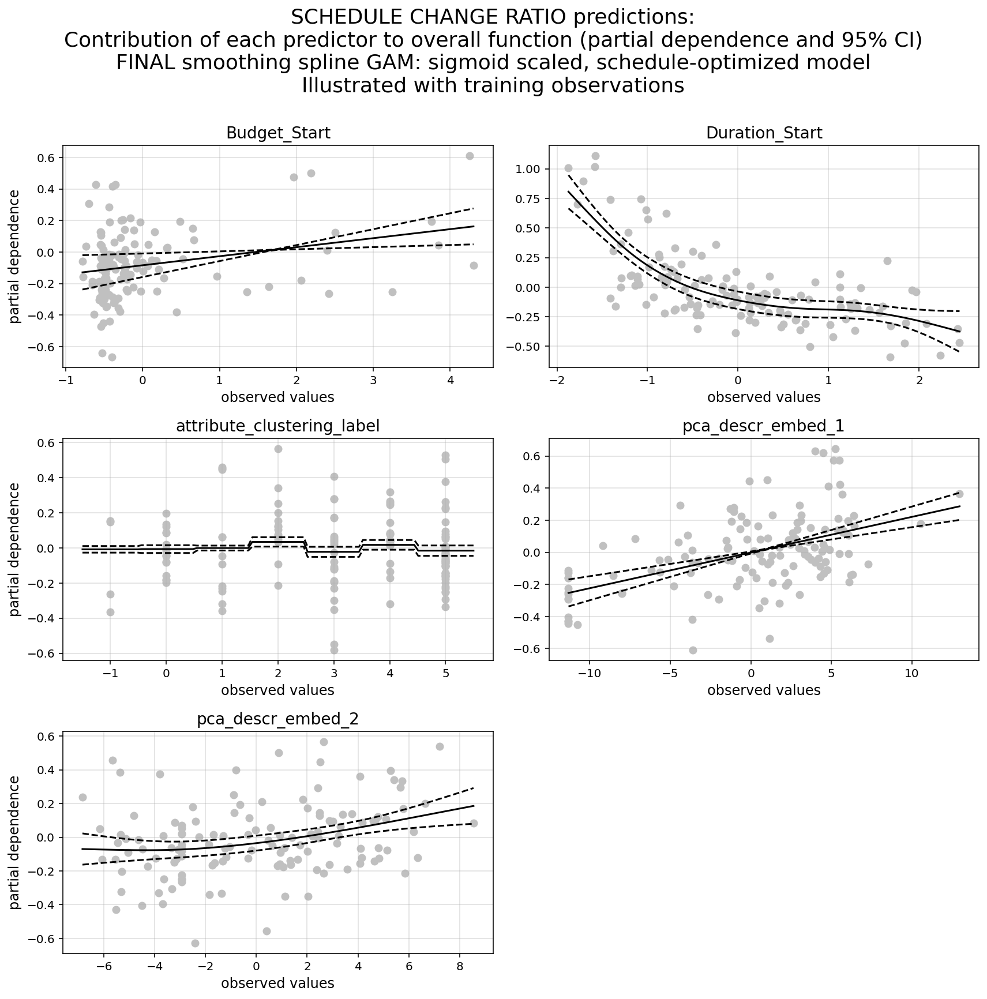

In [47]:
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '51-pred-spline-final-contrib-budget.jpg', save_images
)
caproj.visualize.plot_gam_by_predictor(
    model_dict=model_GAM3, model_index=0,
    X_data=X_train_std_sig[features1], y_data=y_train,
    dataset='train', savepath=savepath,
)

print()

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '52-pred-spline-final-contrib-schedule.jpg', save_images
)
caproj.visualize.plot_gam_by_predictor(
    model_dict=model_GAM4, model_index=1,
    X_data=X_train_std_sig[features2], y_data=y_train,
    dataset='train', suptitle_y=1, savepath=savepath,
)

**RESULTS:**

In our partial dependence plots above, once again we see the familiar trend where our model has extreme difficulty finding any significant relationship between our predictors and the `Budget_Change_Ratio` response variable. And, similar to before, we see significant contribution relationships expressed for the predictors in our `Schedule_Change_Ratio` model.

**Final thoughts on smoothing spline GAMs**

While the expressiveness of smoothing splines helped fit a more robust model to our `Schedule_Change_Ratio` response variable, it has become clear that this class of linear model will not be sufficient to predict `Budget_Change_Ratio`. We have yet to encounter a model that performs better than a naive model as has been evidenced by our negative $R^2$ test scores. For this reason, we will now move on to a non-parametric class of models Decision Trees and Decision Tree Ensemble methods to see if we can generate at least some predictive accurace for `Budget_Change_Ratio` and further improve our predictions for `Schedule_Change_Ratio`.

# 5. Nonparametric models 

[Return to top](#Notebook-contents)

**IN THIS SECTION:**

**[5.1. Decision tree regressors](#5.1.-Decision-tree-regressors)**

**[5.2. Ensemble tree regressors with boosting](#5.2.-Ensemble-tree-regressors-with-boosting)**


In this section, we take several approaches to fitting tree-based models on our data. First, in an attempt to identify what to expect from our performance using trees, we find the optminal combinations of features to perform the task of classifying each project as either over or not-over budget and over or not-over schedule at the end of the 3-year interval. We do this as an initial check on the effectiveness of trees and to identify which features seem to have the largest influence on whether a project is classified as likely to be either over budget or over schedule.

Next, we perform the same sort of feature-space exploration to find the optimal combination of feature with which to fit Decision Tree Regressors for predicting both `Budget_Change_Ratio` and `Schedule_Change_Ratio`. There we perform some of the same interpretive analysis of the resulting trees and tree depths.

Finally, we move on to the decision tree ensemble method known as Boosting, implemented with `scikit-learn`'s `AdaBoost`. Here we seek to identify the most robust model available on our limited set of data, primarily as a proof-of-value for further exploration of the problem, should we be able to later identify a larger set of data to perform more intensive model.

## 5.1. Decision tree regressors

[Return to section index](#5.-Nonparametric-models) 

**IN THIS SECTION:**

**[5.1.1. Decision tree classification models](#5.1.1.-Decision-tree-classification-models)**

**[5.1.2. Decision tree regression models](#5.1.2.-Decision-tree-regression-models)**

## 5.1.1. Decision tree classification models

[Return to section index](#5.1.-Decision-tree-regressors)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/09_decision_tree_models.ipynb)**

Here, we only predict whether the final values are higher or lower than the original start. The custom `iterate_tree_models` function used below can be found in the `../src/trees.py` available in our GitHub repository. This function iterates through a wide range of possible tree depth and predictor combinations to identify partially optimized model configurations for predicting `Budget_Change_Ratio` and `Schedule_Change_Ratio` separately.  

In [48]:
%%capture --no-display --no-stdout
%%time

categories = [
    'Bridges',
    'Ferries',
    'Industrial_Development',
    'Parks',
    'Sanitation',
    'Schools',
    'Sewers',
    'Streets_and_Roadways',
    'Wastewater_Treatment',
    'Water_Supply'
]
nondescr_attrbutes = [
    'Category',
    'Budget_Start',
    'Duration_Start',
    'umap_attributes_2D_embed'
]
descr_attributes = [
    'umap_descr_2D_embed',
    'ae_descr_embed',
    'pca_descr_embed'
]
responses_list = [
    ['Budget_Change_Ratio'],
    ['Schedule_Change_Ratio']
] 

results_all_log, model_dicts_log = caproj.trees.iterate_tree_models(
    data_train, data_test, categories,
    nondescr_attrbutes, descr_attributes,
    responses_list, classifier=True
)

Using CLASSIFIER models



CPU times: user 2min 13s, sys: 181 ms, total: 2min 14s
Wall time: 2min 13s


In [49]:
results_df = pd.DataFrame(results_all_log)
results_df.sort_values(by='test_score', ascending=False).head(3)

,desc,model_type,attributes,full_attributes,responses,Budget_Change_Ratio,Schedule_Change_Ratio,Budget_and_Schedule_Change,scoring,best_depth,train_score,train_scores,test_score,test_scores,best_model,depths
89,Classifier Tree. Depth: 8,Classifier,"[Category, Budget_Start, umap_attributes_2D_em...","[Budget_Start, Bridges, Ferries, Industrial_De...",[Schedule_Change_Ratio],0,1,0,auc,8,0.86,"[0.6777911164465786, 0.7040816326530612, 0.704...",1.00,"[0.625, 0.625, 0.625, 0.625, 0.829545454545454...","DecisionTreeClassifier(max_depth=8, random_sta...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
25,Classifier Tree. Depth: 5,Classifier,[umap_attributes_2D_embed],"[umap_attributes_2D_embed_1, umap_attributes_2...",[Schedule_Change_Ratio],0,1,0,auc,5,0.80,"[0.6777911164465786, 0.7111644657863145, 0.724...",0.88,"[0.625, 0.625, 0.625, 0.8295454545454546, 0.87...","DecisionTreeClassifier(max_depth=5, random_sta...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
49,Classifier Tree. Depth: 8,Classifier,"[Category, umap_attributes_2D_embed]","[Bridges, Ferries, Industrial_Development, Par...",[Schedule_Change_Ratio],0,1,0,auc,8,0.86,"[0.6777911164465786, 0.7040816326530612, 0.704...",0.88,"[0.625, 0.625, 0.625, 0.625, 0.829545454545454...","DecisionTreeClassifier(max_depth=8, random_sta...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."


Now that we've generated a dataframe storing the results of our tree depth and predictor-space search, we will look at the two tree model configurations identified as "best" for our two response variables.  

**First, our best `Budget Change` results.**

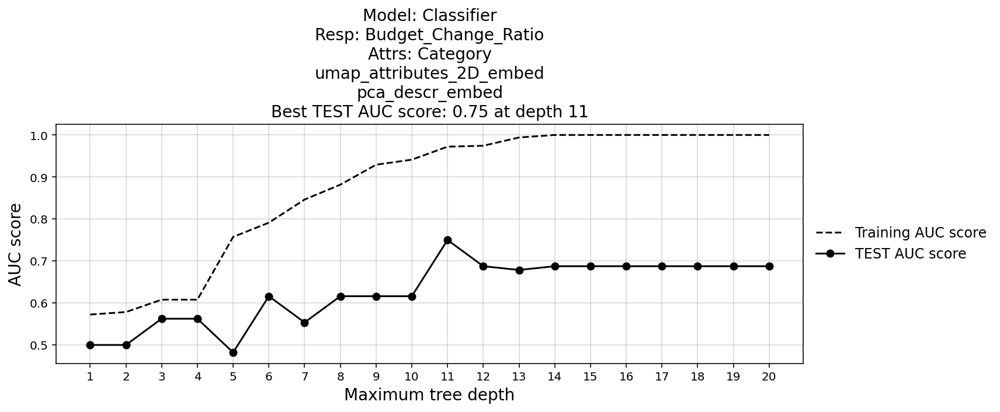

Index Chosen: 54
Best auc Score of Model Chosen: 0.75 // Depth: {m_dict.get('best_depth')}
Model Attributes: ['Category', 'umap_attributes_2D_embed', 'pca_descr_embed']
Model Response: ['Budget_Change_Ratio']


In [50]:
resp = 'Budget_Change_Ratio'
max_score = results_df[results_df[resp]==1].test_score.max()
idx = results_df[
    (results_df[resp]==1) & (results_df.test_score==max_score)
].sort_values(by='test_score').iloc[0].name
score_type = results_df.iloc[idx].scoring

m_dict = results_all_log[idx]

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '53-pred-tree-class-depth-budget.jpg', save_images
)
caproj.trees.plot_tree_depth_finder(
    results_all_log[idx], savepath=savepath
)

print(f"Index Chosen: {idx}")
print(
    f"Best {score_type} Score of Model Chosen: {round(max_score,4)} // "\
    "Depth: {m_dict.get('best_depth')}"
)
print(f"Model Attributes: {m_dict.get('attributes')}")
print(f"Model Response: {m_dict.get('responses')}")

# save jpeg of resulting tree diagram to file 
try:
    saveimage_path = '../docs/_static/figures/54-tree-class-budget'
    tree_dot_data = export_graphviz(
        m_dict['best_model'], feature_names=m_dict['full_attributes']
    )
    gr = graphviz.Source(tree_dot_data, format='jpg')
    gr.render(format='jpg', filename=saveimage_path)

except:
    pass

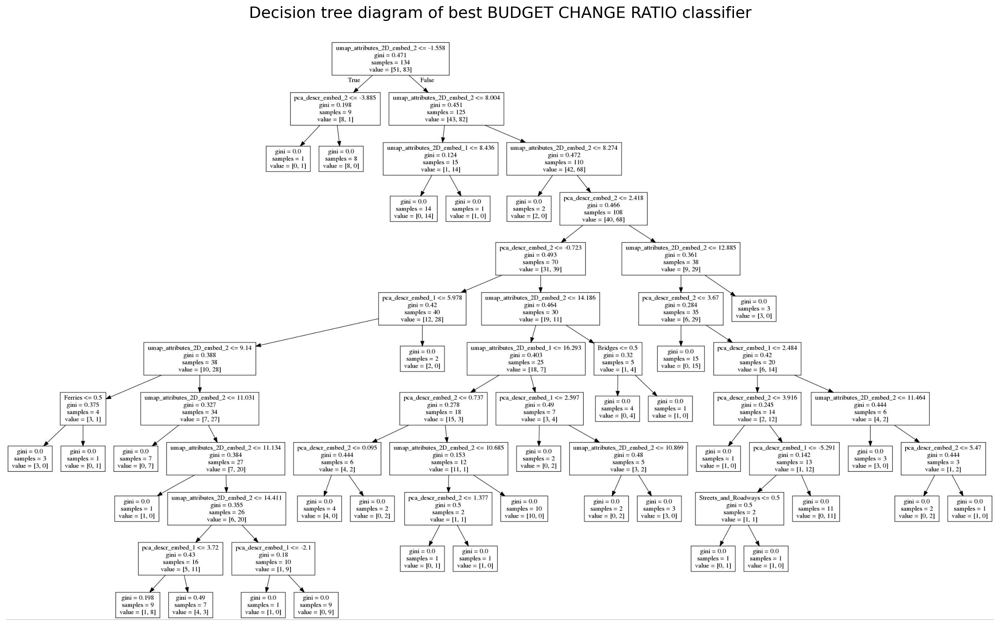

In [51]:
title = 'Decision tree diagram of best BUDGET CHANGE RATIO classifier'
caproj.visualize.plot_jpg(
    '{}.jpg'.format(saveimage_path), title, figsize=(16,10)
)

**Then our best `Schedule Change` results.**

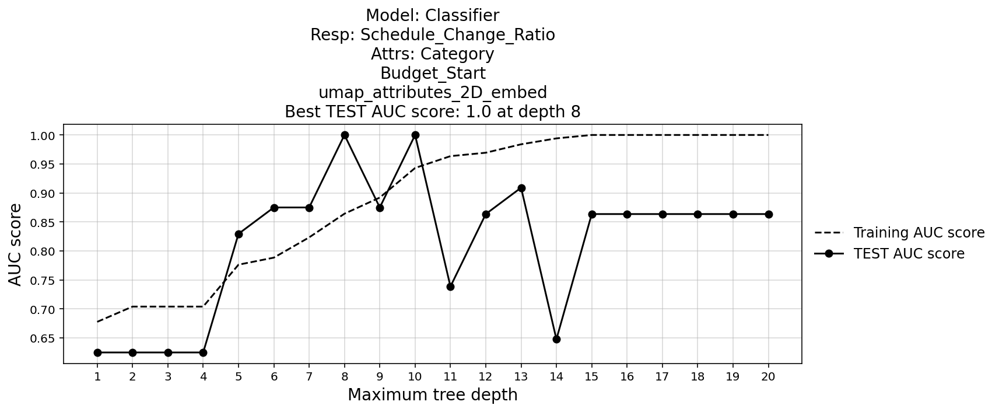

Index Chosen: 89
Best auc Score of Model Chosen: 1.0 // Depth: {m_dict.get('best_depth')}
Model Attributes: ['Category', 'Budget_Start', 'umap_attributes_2D_embed']
Model Response: ['Schedule_Change_Ratio']


In [52]:
resp = 'Schedule_Change_Ratio'
max_score = results_df[results_df[resp]==1].test_score.max()
idx = results_df[
    (results_df[resp]==1) & (results_df.test_score==max_score)
].sort_values(by='test_score').iloc[0].name
score_type = results_df.iloc[idx].scoring

m_dict = results_all_log[idx]

# plot model results
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '55-pred-tree-class-depth-schedule.jpg', save_images
)
caproj.trees.plot_tree_depth_finder(
    results_all_log[idx], savepath=savepath
)

print(f"Index Chosen: {idx}")
print(
    f"Best {score_type} Score of Model Chosen: {round(max_score,4)} // "\
    "Depth: {m_dict.get('best_depth')}"
)
print(f"Model Attributes: {m_dict.get('attributes')}")
print(f"Model Response: {m_dict.get('responses')}")

# save jpeg of resulting tree diagram to file 
try:
    saveimage_path = '../docs/_static/figures/56-tree-class-schedule'
    tree_dot_data = export_graphviz(
        m_dict['best_model'], feature_names=m_dict['full_attributes']
    )
    gr = graphviz.Source(tree_dot_data, format='jpg')
    gr.render(format='jpg', filename=saveimage_path)

except:
    pass

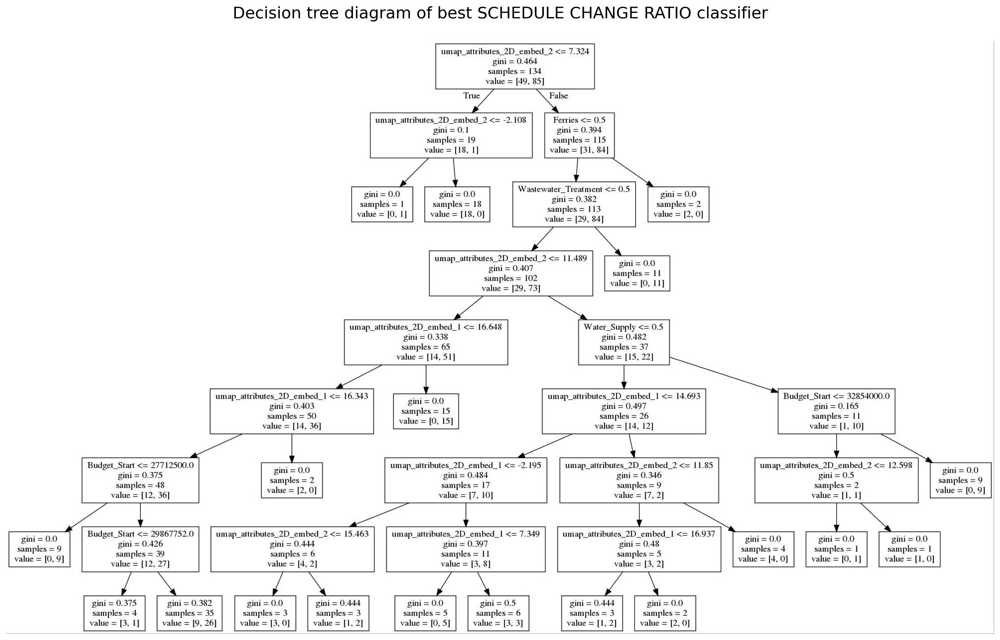

In [53]:
title = 'Decision tree diagram of best SCHEDULE CHANGE RATIO classifier'
caproj.visualize.plot_jpg(
    '{}.jpg'.format(saveimage_path), title, figsize=(16,10)
)

**RESULTS:**

As described in the intro to this sectinon, these models illustrated above will only try to predict if the budget or schedule will be over or under the initial estimate after a 3-year period.

As expected, the optimal models for predicting 'Schedule' and 'Budget' are different and both models produce trees with a depth of significant complexity.

**The optimal 'Budget' model uses the following parameters to predict "Budget Change Ratio":**

- Predictors: `Category`, `umap_attributes_2D_embed`, `pca_descr_embed`

- Best depth: 11
- Best AUC score: 0.75

Here, the project textual description (as represented by the PCA reduced BERT embeddings) is inidicative of the budget outcome.  Worth noting is that the `Budget_Start` predictor is not useful in finding the optimal model to predict the budget outcome.

**The optimal 'Schedule' model uses the following parameters to predict "Schedule Change Ratio":**

- Predictors: `Category`, `Budget_Start`, `umap_attributes_2D_embed`

- Best depth: 8
- Best AUC score: 1.0

Of note is that attributes using the project description embeddings were not selected while identifying the optimal model configuration. Also interesting is that the `Duration_Start` (i.e. starting planned schedule) was not identified as useful for predicting the schedule overage outcome.

Now, armed with this insight, we move on to identifying the optimal decision tree regressors.

## 5.1.2. Decision tree regression models

[Return to section index](#5.1.-Decision-tree-regressors)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/09_decision_tree_models.ipynb)**


Similar to the algorithmic search we performed above to identify the optimal model configurations for our decision tree classifiers, we now do the same to identify our optimal decision tree regressors. The following steps will find the best combination of attributes to find the models which best predict `Schedule_Change_Ratio` and `Budget_Change_Ratio`.

In [54]:
%%capture --no-display --no-stdout
%%time

nondescr_attrbutes = [
    'Category',
    'Budget_Start',
    'Duration_Start',
    'umap_attributes_2D_embed'
]
descr_attributes = [
    'umap_descr_2D_embed',
    'ae_descr_embed',
    'pca_descr_embed'
]
responses_list = [
    ['Budget_Change_Ratio'],
    ['Schedule_Change_Ratio']
] 

results_all_reg, model_dicts_reg = caproj.trees.iterate_tree_models(
    data_train, data_test, categories, 
    nondescr_attrbutes, descr_attributes,
    responses_list, classifier=False
)

Using REGRESSION models



CPU times: user 2min 25s, sys: 237 ms, total: 2min 25s
Wall time: 2min 25s


In [55]:
results_df = pd.DataFrame(results_all_reg)
results_df.sort_values(by='test_score', ascending=False).head(3)

,desc,model_type,attributes,full_attributes,responses,Budget_Change_Ratio,Schedule_Change_Ratio,Budget_and_Schedule_Change,scoring,best_depth,train_score,train_scores,test_score,test_scores,best_model,depths
105,Regression Tree. Depth: 7,Regression,"[Budget_Start, Duration_Start, umap_attributes...","[Budget_Start, Duration_Start, umap_attributes...",[Schedule_Change_Ratio],0,1,0,r2,7,0.92,"[0.44471966298379717, 0.5113941010455046, 0.63...",0.71,"[0.3952918025270771, 0.4537588972378642, 0.537...","DecisionTreeRegressor(max_depth=7, random_stat...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
79,Regression Tree. Depth: 7,Regression,"[Duration_Start, umap_attributes_2D_embed, pca...","[Duration_Start, umap_attributes_2D_embed_1, u...",[Schedule_Change_Ratio],0,1,0,r2,7,0.94,"[0.44471966298379717, 0.5113941010455046, 0.64...",0.68,"[0.3952918025270771, 0.45375889723786433, 0.56...","DecisionTreeRegressor(max_depth=7, random_stat...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
99,Regression Tree. Depth: 3,Regression,"[Category, Duration_Start, umap_attributes_2D_...","[Duration_Start, Bridges, Ferries, Industrial_...",[Schedule_Change_Ratio],0,1,0,r2,3,0.64,"[0.44471966298379717, 0.5113941010455046, 0.64...",0.66,"[0.3952918025270771, 0.4537588972378642, 0.656...","DecisionTreeRegressor(max_depth=3, random_stat...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."


**First, our best `Budget_Change_Ratio` regressor results.**

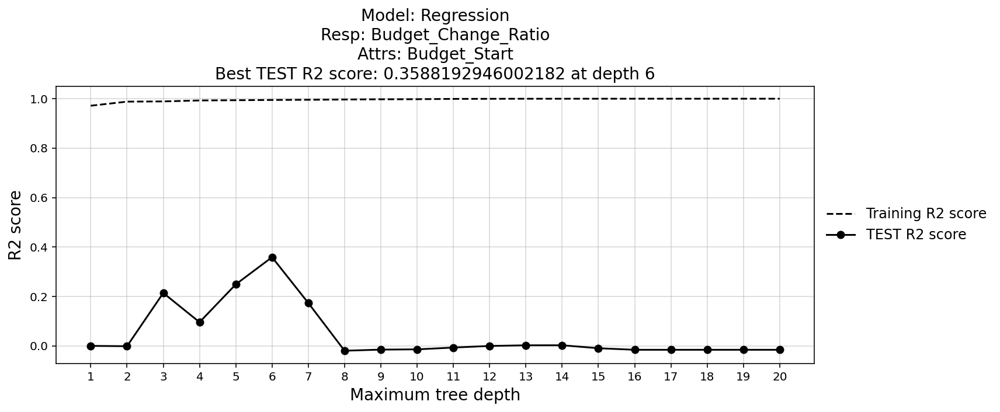

Index Chosen: 8
Best r2 Score of Model Chosen: 0.3588 // Depth: {m_dict.get('best_depth')}
Model Attributes: ['Budget_Start']
Model Response: ['Budget_Change_Ratio']

MODEL SUMMARY:
Regression Tree. Depth: 6


The fitted model object(s):

	DecisionTreeRegressor(max_depth=6, random_state=109)

	DecisionTreeRegressor(max_depth=6, random_state=109)


This model resulted in the following R-squared scores:

	Budget_Change_Ratio

		Training	0.9949
		Test		0.3588

	Schedule_Change_Ratio

		Training	0.5633
		Test		-1.0067





In [56]:
resp = 'Budget_Change_Ratio'
max_score = results_df[results_df[resp]==1].test_score.max()
idx = results_df[
    (results_df[resp]==1) & (results_df.test_score==max_score)
].sort_values(by='test_score').iloc[0].name
score_type = results_df.iloc[idx].scoring

m_dict = results_all_reg[idx]

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '57-pred-tree-regress-depth-budget.jpg', save_images
)
caproj.trees.plot_tree_depth_finder(
    results_all_reg[idx], savepath=savepath
)

print(f"Index Chosen: {idx}")
print(
    f"Best {score_type} Score of Model Chosen: {round(max_score,4)} // "\
    "Depth: {m_dict.get('best_depth')}"
)
print(f"Model Attributes: {m_dict.get('attributes')}")
print(f"Model Response: {m_dict.get('responses')}")

# save jpeg of resulting tree diagram to file 
try:
    saveimage_path = '../docs/_static/figures/58-tree-regress-budget'
    tree_dot_data = export_graphviz(
        m_dict['best_model'], feature_names=m_dict['full_attributes']
    )
    gr = graphviz.Source(tree_dot_data, format='jpg')
    gr.render(format='jpg', filename=saveimage_path)

except:
    pass

m_bdgt = model_dicts_reg[idx]
caproj.model.print_model_results(m_bdgt)

**RESULTS:**

As we can see above, this `Budget_Change_Ratio` optimized decision tree regressor offers a marked improvement over all prior models for predicting `Budget_Change_Ratio`. Whereas our best model prior to this one still had an test $R^2$ score of less than $0$, we are now achieving a test score of $0.36$. This is extremely promising.

What's interesting however, is that this optimal model uses `Budget_Start` as it's **only** predictor for generating results.

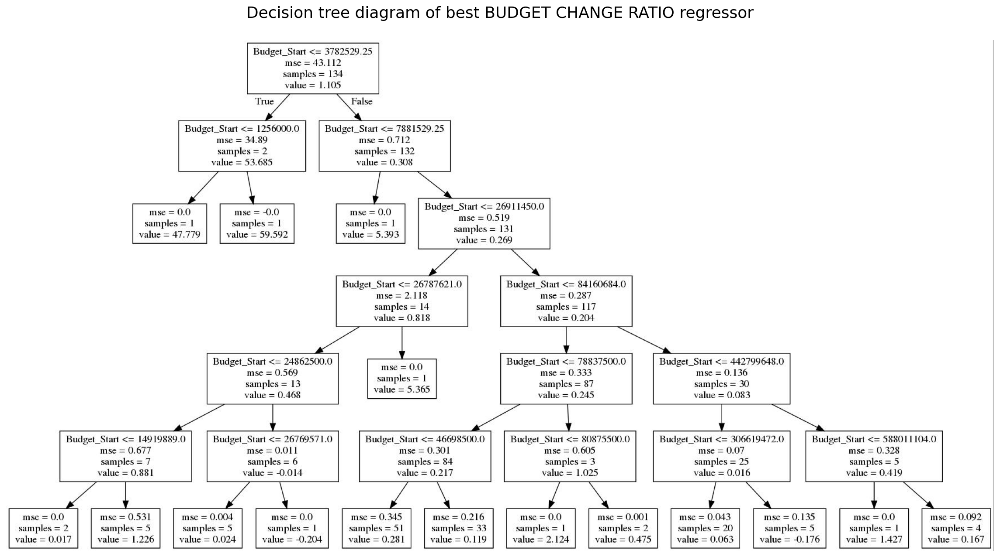

In [57]:
title = 'Decision tree diagram of best BUDGET CHANGE RATIO regressor'
caproj.visualize.plot_jpg(
    '{}.jpg'.format(saveimage_path), title, figsize=(16,10)
)

**RESULTS:**

When we inspect the resulting tree diagram, we can see the many decision nodes generate off of this singular predictor.

**Now, our best `Schedule_Change_Ratio` regressor results.**

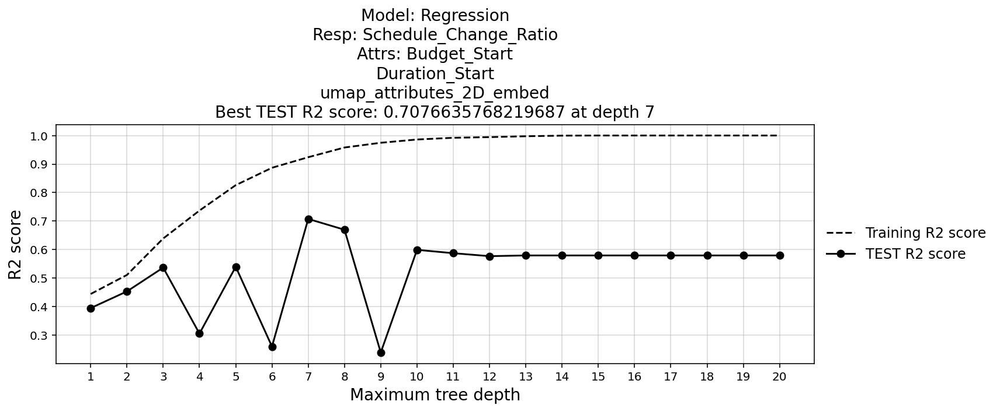

Index Chosen: 105
Best r2 Score of Model Chosen: 0.7077 // Depth: {m_dict.get('best_depth')}
Model Attributes: ['Budget_Start', 'Duration_Start', 'umap_attributes_2D_embed']
Model Response: ['Schedule_Change_Ratio']

MODEL SUMMARY:
Regression Tree. Depth: 7


The fitted model object(s):

	DecisionTreeRegressor(max_depth=7, random_state=109)

	DecisionTreeRegressor(max_depth=7, random_state=109)


This model resulted in the following R-squared scores:

	Budget_Change_Ratio

		Training	0.9968
		Test		-0.1285

	Schedule_Change_Ratio

		Training	0.9240
		Test		0.7077





In [58]:
resp = 'Schedule_Change_Ratio'
max_score = results_df[results_df[resp]==1].test_score.max()
idx = results_df[
    (results_df[resp]==1) & (results_df.test_score==max_score)
].sort_values(by='test_score').iloc[0].name
score_type = results_df.iloc[idx].scoring

m_dict = results_all_reg[idx]

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '59-pred-tree-regress-depth-schedule.jpg', save_images
)
caproj.trees.plot_tree_depth_finder(
    results_all_reg[idx], savepath=savepath
)

print(f"Index Chosen: {idx}")
print(
    f"Best {score_type} Score of Model Chosen: {round(max_score,4)} // "\
    "Depth: {m_dict.get('best_depth')}"
)
print(f"Model Attributes: {m_dict.get('attributes')}")
print(f"Model Response: {m_dict.get('responses')}")

# save jpeg of resulting tree diagram to file 
try:
    saveimage_path = '../docs/_static/figures/60-tree-regress-schedule'
    tree_dot_data = export_graphviz(
        m_dict['best_model'], feature_names=m_dict['full_attributes']
    )
    gr = graphviz.Source(tree_dot_data, format='jpg')
    gr.render(format='jpg', filename=saveimage_path)

except:
    pass

m_schd = model_dicts_reg[idx]
caproj.model.print_model_results(m_schd)

**RESULTS:**

Once again we are pleased with our results. The best decision tree regressor model for predicting `Schedule_Change_Ratio` has increased our best test $R^2$ score from $0.55$ as was seen in our smoothing spline GAM, up to $0.71$ as is shown above.

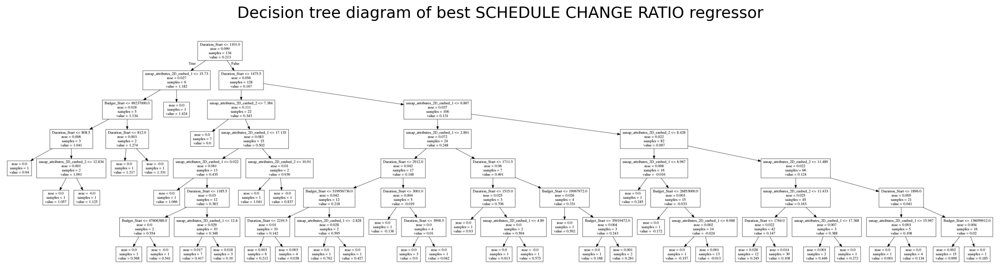

In [59]:
title = 'Decision tree diagram of best SCHEDULE CHANGE RATIO regressor'
caproj.visualize.plot_jpg(
    '{}.jpg'.format(saveimage_path), title, figsize=(16,10)
)

**RESULTS:**

Additionally, this `Schedule_Change_Ratio` tree regressor used a larger feature set and the best `Budget_Change_Ratio` model reviewed above. Here we use `Budget_Start`, `Duration_Start`, and `umap_attributes_2D_embed` to generate our predictions.

Now, as one final step, we will visually inspect our true versus predicted values for each of our best models.

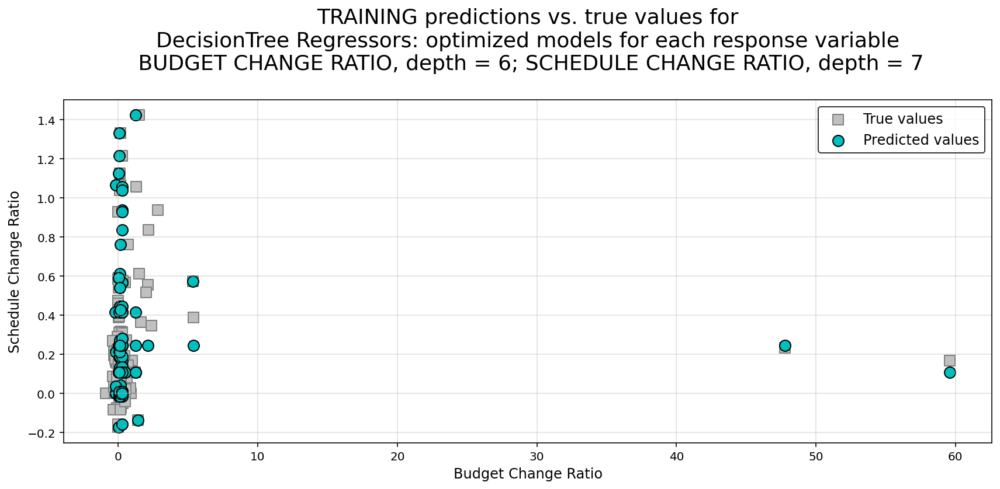

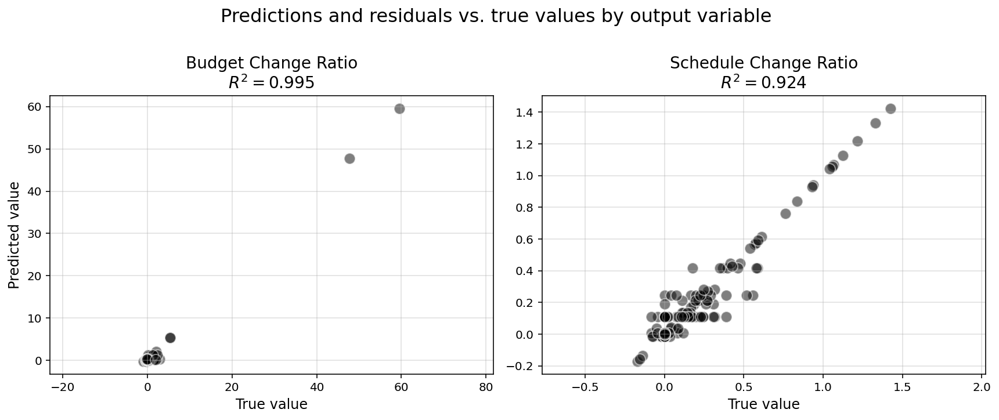

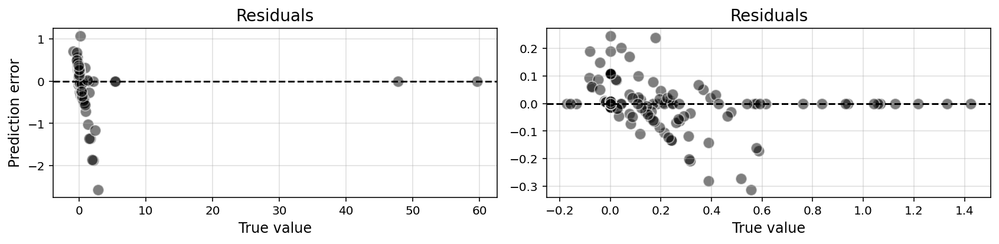

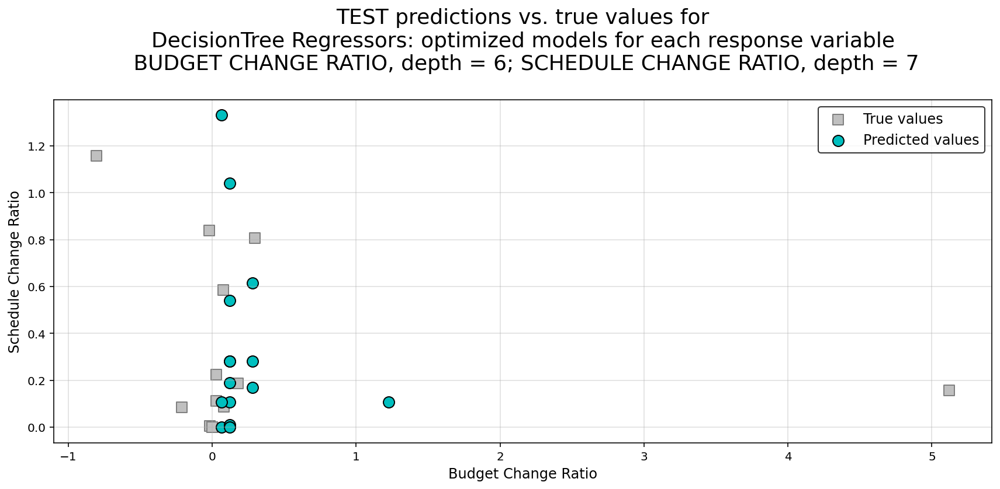

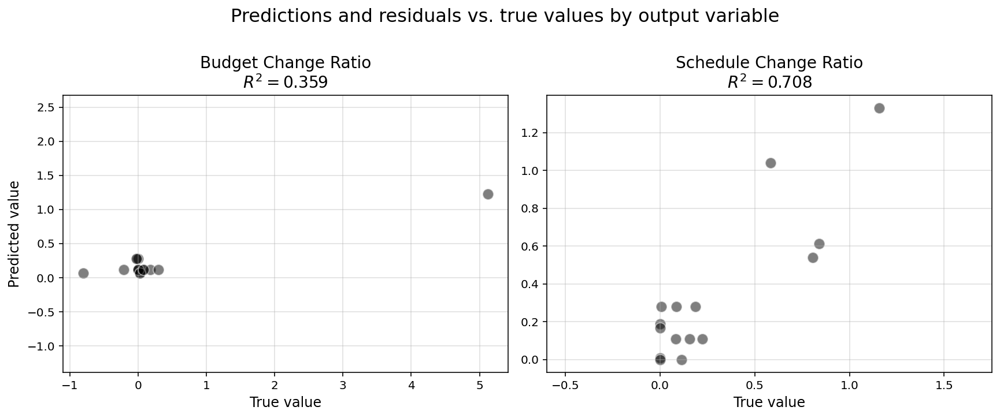

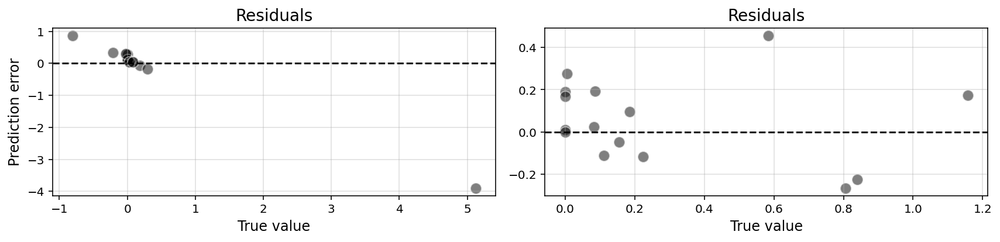

In [60]:
# combine best budget and best schedule predictions from each best model
# into a single set of arrays 
y_pred_train = np.hstack(
    [
        m_bdgt['predictions']['train'][:, 0].reshape(-1,1),
        m_schd['predictions']['train'][:, 1].reshape(-1,1),
    ]
)

y_pred_test = np.hstack(
    [
        m_bdgt['predictions']['test'][:, 0].reshape(-1,1),
        m_schd['predictions']['test'][:, 1].reshape(-1,1),
    ]
)

# plot the results of the 2 best tree models combined
model_descr = 'DecisionTree Regressors: optimized models for each response '\
              'variable\n BUDGET CHANGE RATIO, depth = 6; SCHEDULE CHANGE '\
              'RATIO, depth = 7'
y1_label = 'Budget Change Ratio'
y2_label = 'Schedule Change Ratio'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '61-pred-tree-regress-final-train.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='train',
    y_true=data_train[
        [y1_label.replace(' ','_'), y2_label.replace(' ','_')]
    ], # y_train,
    y_pred=y_pred_train,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '62-pred-tree-regress-final-test.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='test',
    y_true=data_test[
        [y1_label.replace(' ','_'), y2_label.replace(' ','_')]
    ], #y_test,
    y_pred=y_pred_test,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

**RESULTS:**

These models attempt to predict the ending `Schedule_Change_Ratio` and `Budget_Change_Ratio` values after a 3-year period.

As expected, the optimal models for predicting *Schedule* and *Budget* are different and both models produce trees with a depth of significant complexity, albeit one model uses only one singular predictor.

**The optimal 'Budget' model uses the following parameters to predict `Budget_Change_Ratio`**

- Predictors: `Budget_Start`
- Best depth: 6
- Best R2 score: 0.3588

Here, only the starting budget value is determined to be significant when predicting `Budget_Change_Ratio`.  The $R^2$ score is not exceptionally impressive which may be the result of some extreme outliers in the data, but is still a considerable improvement over the negative scores seen in our prior models. 

**The optimal 'Schedule' model uses the following parameters to predict `Schedule_Change_Ratio`**

- Predictors: `Budget_Start`, `Duration_Start`, `umap_attributes_2D_embed`
- Best depth: 7
- Best R2 score: 0.7077

Of note, once again, is that 2D attributes derived from the BERT description-text embeddings were not identified as components of our optimal `Schedule_Change_Ratio` model.

## 5.2. Ensemble tree regressors with boosting

[Return to section index](#5.-Nonparametric-models)

**The unabridged notebook used to generate the findings in this section can be [found here on GitHub.](https://github.com/sedelmeyer/nyc-capital-projects/blob/master/notebooks/10_ensemble_tree_models.ipynb)**

In this section, we continue with the nonparatric models by applying Boosting to our model search using `scikit-learn`'s implementation of `AdaBoost`.  Boosting will use an ensemble of models to find an optimal model with a minimal number of iterations. Boosting achieves this by weighting observations with incorrect predictions more heavily in an effort to better learn those hard-to-learn feature relationships.

As with the previous models, this section will iterate over all possible combination of attributes and responses to find the best model.  Additionally, we iterate over options for various AdaBoost paramaters including `max_depth` for our base classifier as well as a few competing values for `n_estimators`, which specified how many boosting iterations should be executed by the algorithm. The process creates 672 models from which we select the best performing configurations.

In [61]:
%%time
# Iterate over combinations of attributes available saving the trained
# models in each iteration

# NOTE: This process takes approximately 5 minutes to run

model_descr = 'AdaBoost tree ensemble unscaled data'

# set parameters for AdaBoostRegressor model object
max_depths = [2, 3, 5, 7]
learning_rate = 0.05
estimators = [20,40,60]
random_state = 109

# calculate all combinations of modeling options of attribute and responses

nondescr_attrbutes = [
    'Category_Code',
    'Budget_Start',
    'Duration_Start',
    (
        'umap_attributes_2D_embed_1',
        'umap_attributes_2D_embed_2'
    )
]
descr_attributes = [
    ['umap_descr_2D_embed_1', 'umap_descr_2D_embed_2'],
    ['ae_descr_embed_1', 'ae_descr_embed_2'],
    ['pca_descr_embed_1', 'pca_descr_embed_2']
]

responses = ['Budget_Change_Ratio', 'Schedule_Change_Ratio']


results_boost, model_dicts_boost = caproj.trees.iterate_adaboost_models(
    data_train,
    data_test,
    model_descr,
    max_depths,
    learning_rate,
    estimators,
    random_state,
    nondescr_attrbutes,
    descr_attributes,
    responses,
)


Using ADABoost REGRESSION models



CPU times: user 4min 21s, sys: 1.1 s, total: 4min 22s
Wall time: 4min 21s


In [62]:
results_boost.sort_values(
    by='test_score_sch', ascending=False
).head(3)

,description,train_score_bud,train_score_sch,test_score_bud,test_score_sch,max_depth,lr,n_estimators,staged_scores_train,staged_scores_test
223,AdaBoost tree ensemble unscaled data,1.00,0.96,-0.13,0.74,7,0.05,20,"[[0.9711136626625033, 0.7653248930614919], [0....","[[-0.5508103080538387, 0.16835841837708043], [..."
219,AdaBoost tree ensemble unscaled data,1.00,0.96,-0.42,0.69,7,0.05,20,"[[-0.0004698663031137418, 0.7548799926118477],...","[[-1.5889054142576224, 0.18264788587467373], [..."
332,AdaBoost tree ensemble unscaled data,0.99,0.73,0.14,0.69,3,0.05,40,"[[0.9646808181742339, 0.6400864763644332], [0....","[[0.31276919259203106, 0.500042088490582], [0...."


**Review the Impact of `n_estimators` and `max_depth` on our results.**

Now that we've completed the search of our model-space and saved our results to a dataframe, we will first visually inspect the effect that our two `AdaBoost` model parameters had on our results. 

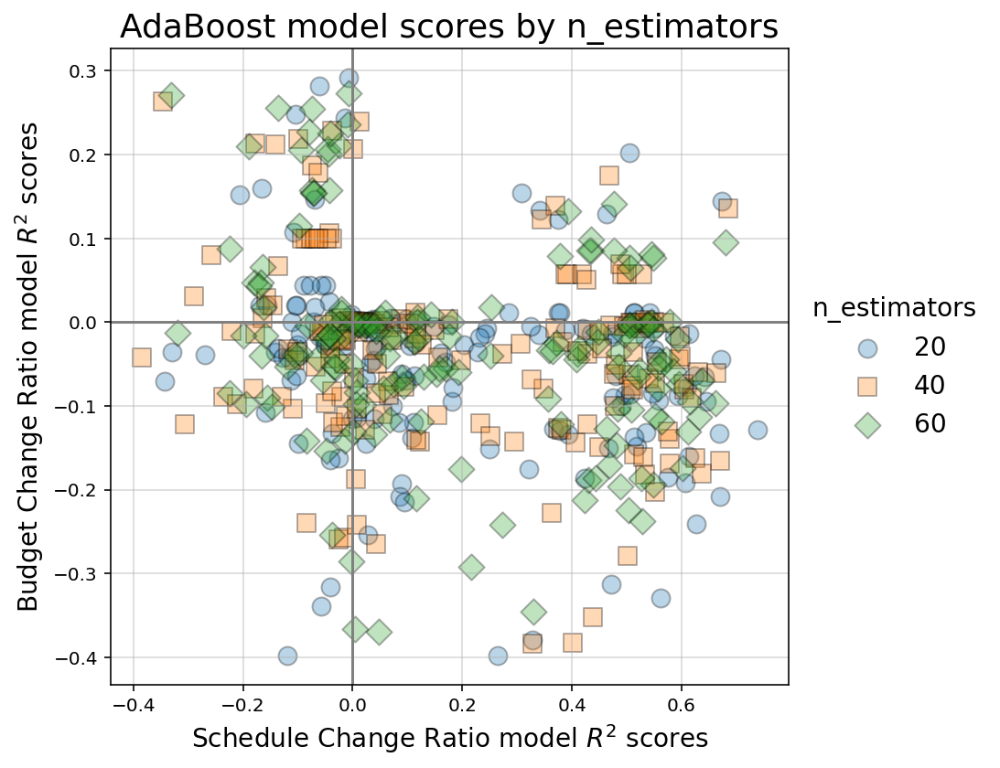

In [63]:
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '63-pred-boost-scores-by-n-estimators.jpg', save_images
)
caproj.trees.plot_adaboost_scores_scatter(
    results_boost,
    model_parameter="n_estimators",
    min_axis=.4, # limit outliers for clearer display
    savepath=savepath
)

**RESULTS:**

Here we are checking to see if there is any pattern in the `n_estimators` parameter creating clusters or unique distributioins relative to our resulting `Schedule_Change_Ratio` an `Budget_Change_Ratio` $R^2$ scores.  We observe no trend that indicates any value performs consistently better than the others. However, something worth notings, is that after examining our final "best" model results, we will have realized that should have perhaps explored values of even fewer iterations that explored here. 

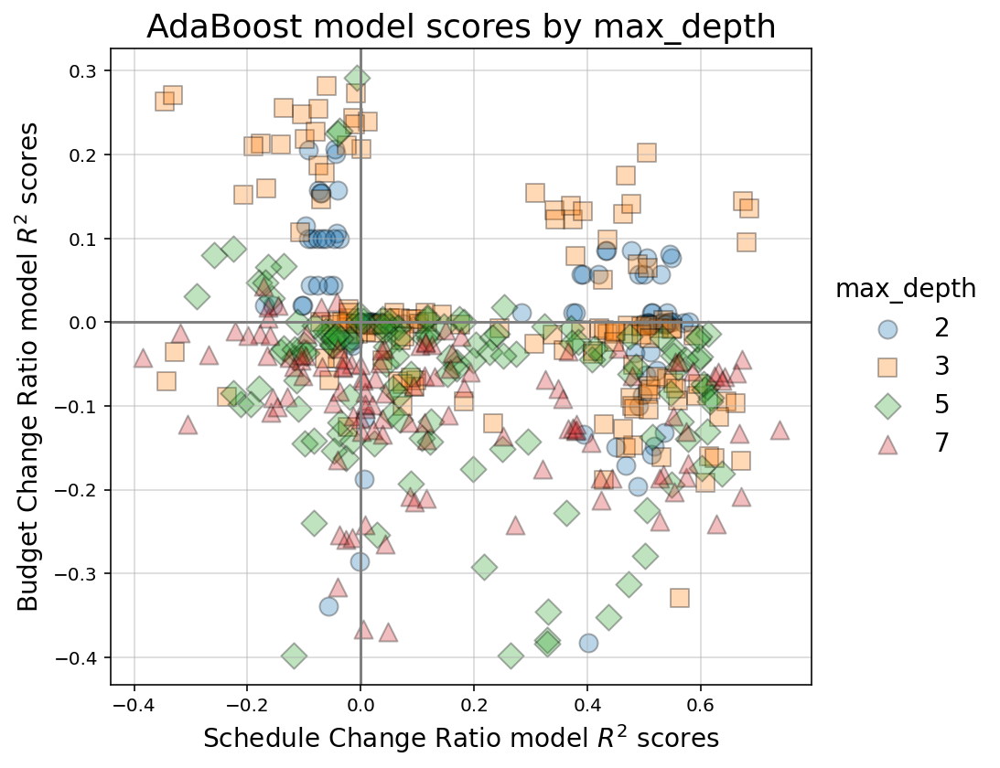

In [64]:
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '64-pred-boost-scores-by-max-depth.jpg', save_images
)
caproj.trees.plot_adaboost_scores_scatter(
    results_boost,
    model_parameter="max_depth",
    min_axis=.4, # limit outliers for clearer display
    savepath=savepath
)

**RESULTS:**

Similar to the visual inspection we conducted above for `n_estimators`, here we want to see if the maximum tree depth of our base classifier has any consistent impact on $R^2$ performance of the resulting models.  We notice that the max depths of 3 perform consistently better with schedule change; however the best budget change model has a max depth of 5.  Since `AdaBoost` learns 'fast' by also considering errors in training iterations, we can expect that lower numbers for `max_depth` would product good results. Predicting Budget values has been consistently more difficuly, so it makes sense that a larger `max_depth` is needed to find the optimal model for predicting the `Budget_Change_Ratio` response values.

Now that we've visualized the effect of `max_depth` and `n_estimators` across our entire set of trained models, we will inspect the best performing `Budget_Change_Ratio` and `Schedule_Change_Ratio` models identified during this search. 

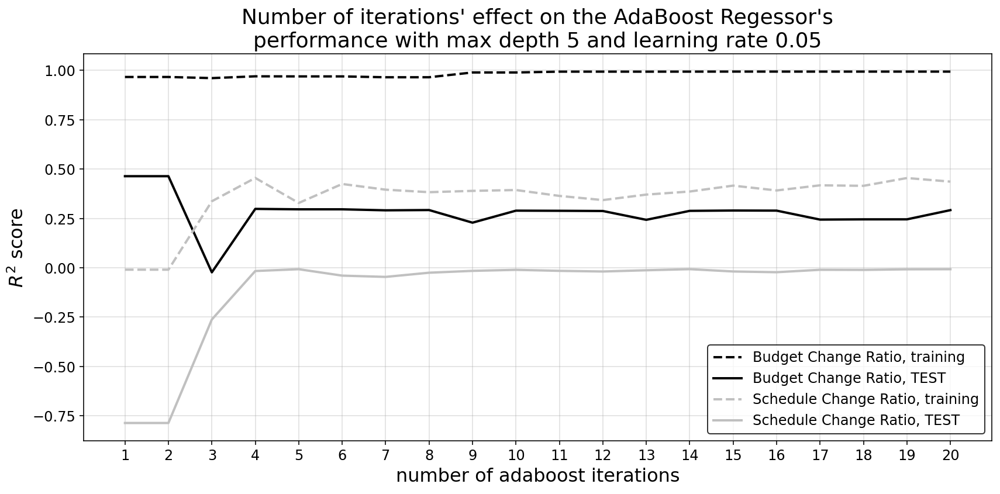

Best BUDGET CHANGE RATIO Prediction Model (shown above)
Train Score: 0.994
Test Score: 0.2921


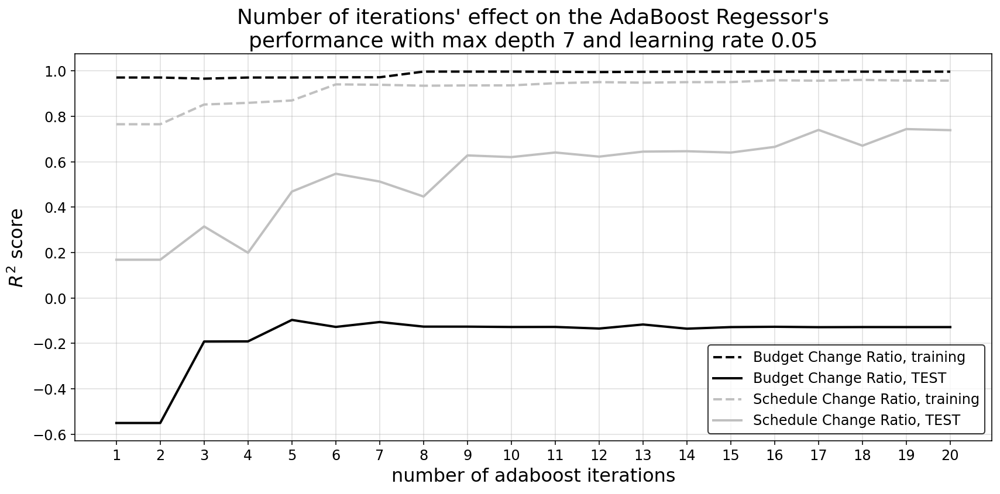

Best SCHEDULE CHANGE RATIO Prediction Model (shown above)
Train Score: 0.9576
Test Score: 0.7392


In [65]:
# best scoring model predicting budget changes
idx = results_boost.sort_values(
    by='test_score_bud', ascending=False
).iloc[0].name
m_bdgt = model_dicts_boost[idx]
best_budget_model = m_bdgt.copy()

# best scoring model predicting schedule changes
idx = results_boost.sort_values(
    by='test_score_sch', ascending=False
).iloc[0].name
m_schd = model_dicts_boost[idx]
best_schedule_model = m_schd.copy()

# use custom function imported from `../src/trees.py` to plot adaboost staged scores
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '65-pred-boost-staged-scores-budget.jpg', save_images
)
caproj.trees.plot_adaboost_staged_scores(
    m_bdgt,
    data_train[m_bdgt.get('attributes')],
    data_test[m_bdgt.get('attributes')], 
    data_train[m_bdgt.get('responses')],
    data_test[m_bdgt.get('responses')],
    height=6,
    savepath=savepath,
)

# print r-square summary
print("Best BUDGET CHANGE RATIO Prediction Model (shown above)")
print(f"Train Score: {round(m_bdgt['score']['train'][0],4)}")
print(f"Test Score: {round(m_bdgt['score']['test'][0],4)}")

# use custom function imported from `../src/trees.py` to plot adaboost staged scores
savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '66-pred-boost-staged-scores-schedule.jpg', save_images
)
caproj.trees.plot_adaboost_staged_scores(
    m_schd,
    data_train[m_schd.get('attributes')],
    data_test[m_schd.get('attributes')],
    data_train[m_schd.get('responses')],
    data_test[m_schd.get('responses')],
    height=6,
    savepath=savepath,
)

# print r-square summary
print("Best SCHEDULE CHANGE RATIO Prediction Model (shown above)")
print(f"Train Score: {round(m_schd['score']['train'][1],4)}")
print(f"Test Score: {round(m_schd['score']['test'][1],4)}")


**RESULTS:**

Above, when we examine the staged scores for each iteration of the optimal `Budget_Change_Ratio` model (upper plot) versus the optimal `Schedule_Change_Ratio` model (lower plot), we can see significant differences in the training and test performance for both response variables. As is evidenced by these charts, at all numbers of iterations, the `AdaBoost` model optimized for `Schedule_Change_Ratio` performs horribly on `Budget_Change_Ratio` and vice versa. What's even more compelling is the promise we can see for achieving far higher `Budget_Change_Ratio` test scores by training our `AdaBoost` model for only 1 to 2 iterations (with an approximate $R^2$ of $0.48$). Looking at the top chart, this can be seen by examining the solid black line. 

The major caveat however, looking at these plots are, we have not performed a proper exercise cross-validating our model scores with a validation set over a number of k-folds. As was mentioned in an earlier section of this report, the extremely small sample size and sparsity of a number of our categorical variables prevents us from being able to perform an effective gridsearch with proper cross-validation. Therefore, we can only consider these model results a proof of concept or proof of value for our modelling approach, which would then need to be subjected to more principled tests with a much more robust set of project data.

Now, as our final step, we examine our predicted values against the true values of our train and test sets.

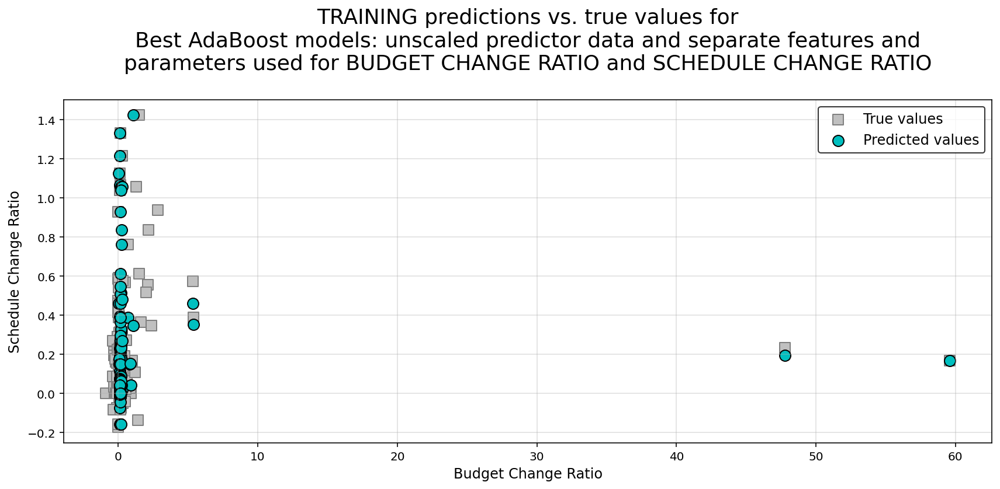

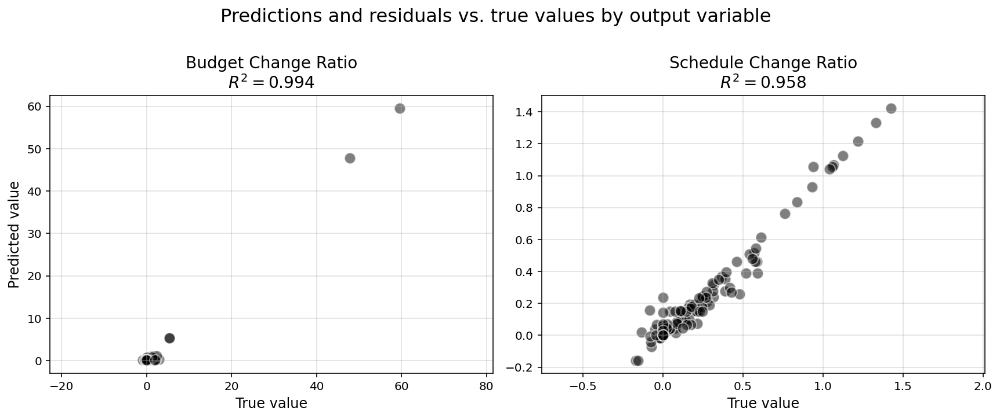

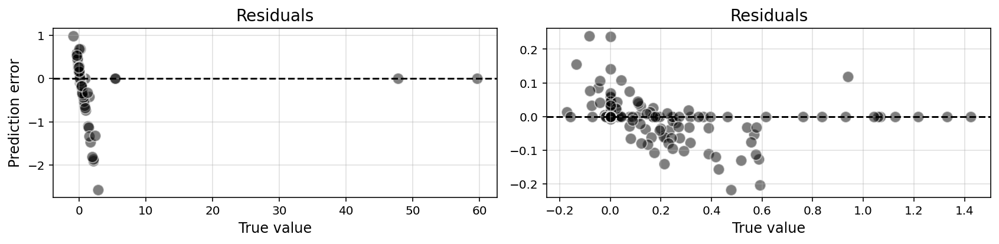

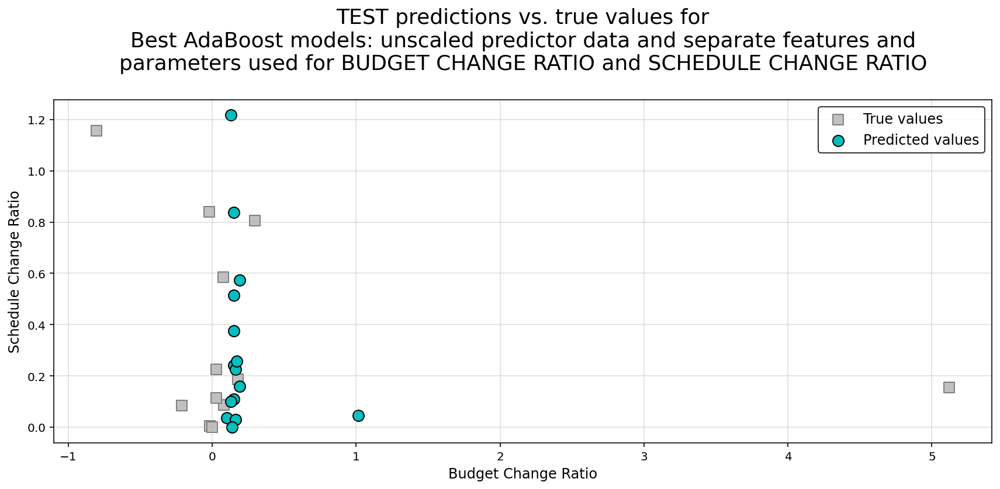

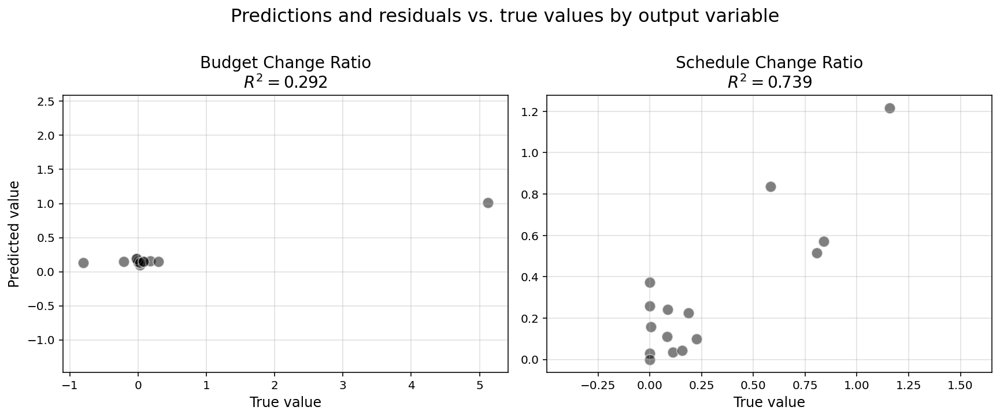

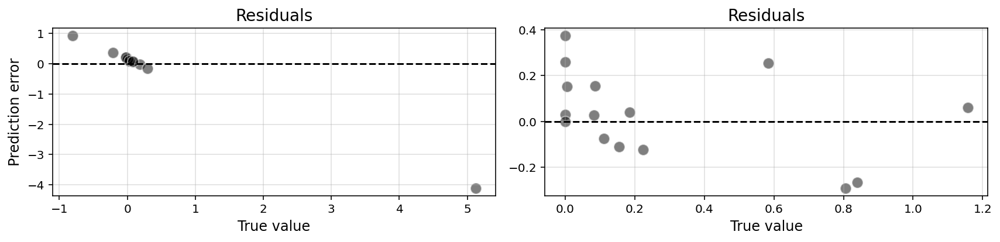

In [66]:
y_pred_train = np.hstack(
    [
        best_budget_model['predictions']['train'][:, 0].reshape(-1,1),
        best_schedule_model['predictions']['train'][:, 1].reshape(-1,1),
    ]
)

y_pred_test = np.hstack(
    [
        best_budget_model['predictions']['test'][:, 0].reshape(-1,1),
        best_schedule_model['predictions']['test'][:, 1].reshape(-1,1),
    ]
)

model_descr = 'Best AdaBoost models: unscaled predictor data and separate features '\
              'and\nparameters used for BUDGET CHANGE RATIO and SCHEDULE CHANGE RATIO'
y1_label = 'Budget Change Ratio'
y2_label = 'Schedule Change Ratio'

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '67-pred-boost-final-train.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='train',
    y_true=data_train[
        [y1_label.replace(' ','_'), y2_label.replace(' ','_')]
    ],
    y_pred=y_pred_train,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

savepath = caproj.visualize.set_savepath(
    FIGURE_ROOT, '68-pred-boost-final-test.jpg', save_images
)
caproj.visualize.plot_true_pred(
    dataset='test',
    y_true=data_test[
        [y1_label.replace(' ','_'), y2_label.replace(' ','_')]
    ],
    y_pred=y_pred_test,
    y1_label=y1_label,
    y2_label=y2_label,
    model_descr=model_descr,
    savepath=savepath,
)

**RESULTS:**

Thinking back to the results we had seen in our baseline model, we are extremely pleased with the far improved results we are seeing here from our best `AdaBoost` models. Not only are we achieving much improved $R^2$ scores on our `Budget_Change_Ratio` and `Schedule_Change_Ratio` predictions, but we are also seeing test predictions that distribute themselve well across the range of true `Schedule_Change_Ratio` values, and we can even see our `Budget_Change_Ratio` test predictions making an effort predict the presence of particular outliers in the data.

# 6. Conclusions 

[Return to top](#Notebook-contents)

Not surprisingly, linear models lacked the expressiveness needed to successfully model our predictions, particularly those for predicting `Budget_Change_Ratio` on our test projects. Not only were there drastic differences in the predictive performance of models on both `Budget_Change_Ratio` and `Schedule_Change_Ratio` as our primary response variables, but models also needed to be individually parameterized for optimal predictions on each of those two response variables.

In the end, through the use of ensemble decision tree regressors using boosting, we were able to achieve test $R^2$ scores of 0.48 on our budget change ratio predictions and 0.70 on our schedule change predictions. While there is still a great deal of additional work we can put towards this problem, we feel that this analysis is a good starting point for more principled exploration.

# 7. Next steps & future work

[Return to top](#Notebook-contents)

At most we can consider our work here a proof-of-concept. Our sample size was far too small and our available data was far too limiting. Below are a few key issues and next steps we'd seek to address if we decide to continue explorating this problem-space.

1. First we would seek to identify a more robust source of data for deeper and more principled analysis. Not only would we seek a larger sample set of projects to evaluate, but we would also seek far richer sources of information. To successfully achieve this, we would likely need to partner with a public or private organization as part of a long-term student that would be willing to grant us in-depth and complete project records from many different data sources and of many different data types for a truly robust predictive model that will have the accuracy and specificity to be of use for a managing organization.



2. We would also look into methods for controlling for the human element of data generation in our models. The process by which project data is created, updated, and maintained is flawed and prone to the effects of adverse incentives and management pressures placed on the project managers and administrators responsible for maintaining that data. In the case that we are able to gain the type of access to project records describe in bullet 1 above, we'd also have to give a great deal of consideration to how we control for these human factors in our data.



3. We'd also like to acknowledge that one metric cannot capture all aspects of a "successful" project . Here we used "Budget Change Ratio" and "Schedule Change Ratio" as our target variables, but as the literature suggests, there are various metrics that can capture project success. A small change in Budget Change Ratio or Schedule Change Ratio may mean that millions of dollars were overspent or the projects were delayed for many years. To get a holistic view of project success, we should consider all of the following metrics:


    - Absolute percentage error: |Forecast − Actual|/Actual
    - Relative percentage error: (referred to as cost escalation in project estimation literature): |Forecast − Actual|/Forecast
    - Ratios: Forecast/Actual or Actual/Forecast Difference: Actual − Forecast
    - Days delayed (only the positive differences) 
    - Absolute error: |Forecast − Actual| 
    - Squared error: (Forecast − Actual)^2